# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Libraries

In [ ]:
pip install keras-tuner

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 4.7 MB/s eta 0:00:00


In [ ]:
import random
import math
import numpy as np
from sklearn import preprocessing

import os
import pandas as pd
import zipfile

from datetime import datetime, timedelta
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

In [ ]:

import os
import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta
import numpy as np

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam


import tensorflow as tf


from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error




import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta


from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, Dropout, Concatenate, Bidirectional, LSTM






# Load the data

In [ ]:
bh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/27.420177_72.070427_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
ch=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/23.902077_71.19477_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
dh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/26.793418_72.009013_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kam=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/9.415969_78.248047_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kaz=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/32.2275_78.07099_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kur=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kurnool/15.855387_78.065199_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
man=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/23.986373_75.32641_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
pava=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/14.138196_77.314631_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
pha=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/27.294_72.365_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
rew=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/24.630418_81.537174_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
sak=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Sakri Solar Plant/21.085624_74.352948_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
tan=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Tangste Solar Plant/33.9608_78.0579_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)

In [ ]:
ch_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/ch_validation.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
bh_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/27.3677_71.9219_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
dh_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/26.9056_70.9083_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)


# Data Processing

In [ ]:
class DateTimeConverter:
    def __init__(self, data):
        self.data = data
    def add_month_hour_columns(self):
      self.data['Month']=pd.to_datetime(self.data['PeriodStart']).dt.month
      self.data['Hour']=pd.to_datetime(self.data['PeriodStart']).dt.hour
    def add_features(self):
      self.data = pd.get_dummies(self.data, columns=['Month'])
      self.data['sin_hour'] = np.sin(2*np.pi*self.data['Hour'].astype(int)/24)
      self.data['cos_hour'] = np.cos(2*np.pi*self.data['Hour'].astype(int)/24)
    def visualize_transformations(self):
      fig, ax = plt.subplots()
      ax.plot(self.data['Hour'].iloc[:96], self.data['Ghi'].iloc[:96]/1000, label='Solar Irradiance')
      ax.plot(self.data['Hour'].iloc[:96], self.data['sin_hour'].iloc[:96], label='Sine of Hour')
      ax.plot(self.data['Hour'].iloc[:96], self.data['cos_hour'].iloc[:96], label='Cosine of Hour')
      ax.set_xlabel('Hour of Day')
      ax.set_ylabel('Value')
      ax.set_title('Solar Irradiance and Time of Day Transformations')
      ax.legend()
      plt.show()

    def remove_features(self):
      self.data.drop(['Year', 'Day', 'Minute', 'Hour','Clearsky GHI', 'DHI', 'DNI', 'Clearsky DHI', 'Clearsky DNI','Fill Flag'],inplace=True,axis=1)
    
    def get_data(self):
      return self.data



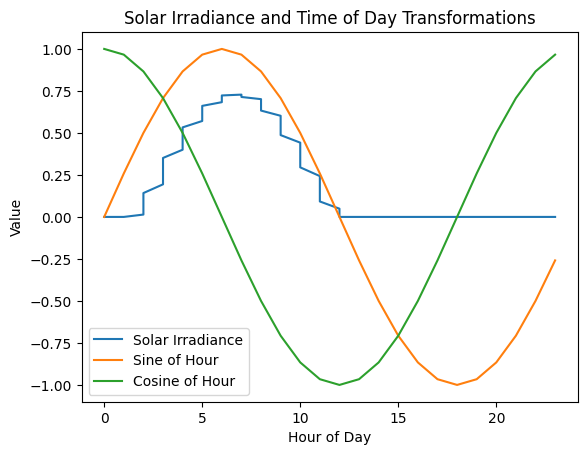

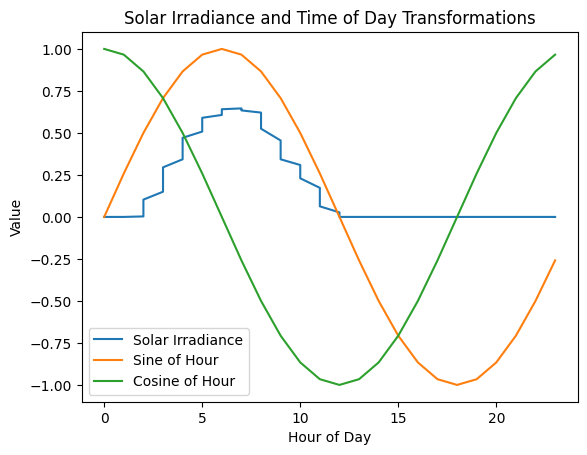

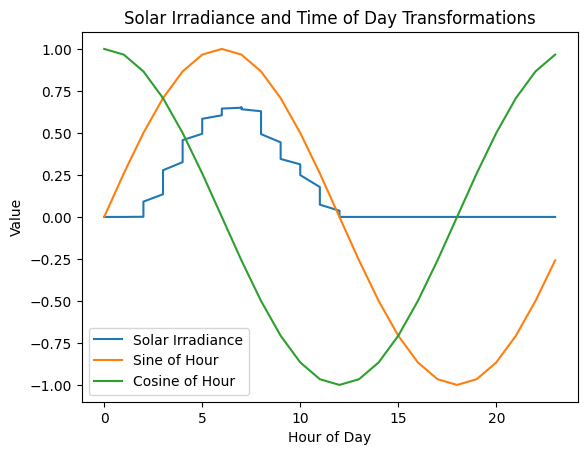

In [ ]:
# ch_val
dt_converter = DateTimeConverter(ch_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
ch_val=dt_converter.get_data()
# bh_val
dt_converter = DateTimeConverter(bh_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
bh_val=dt_converter.get_data()

# dh_val
dt_converter = DateTimeConverter(dh_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
dh_val=dt_converter.get_data()



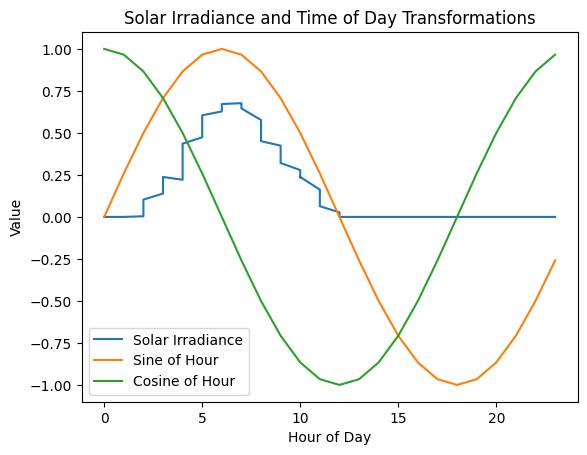

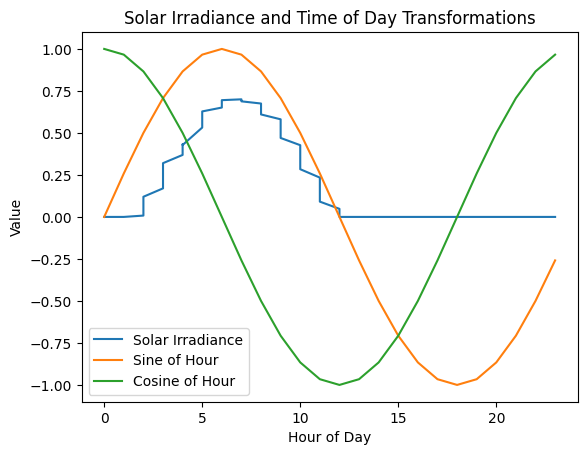

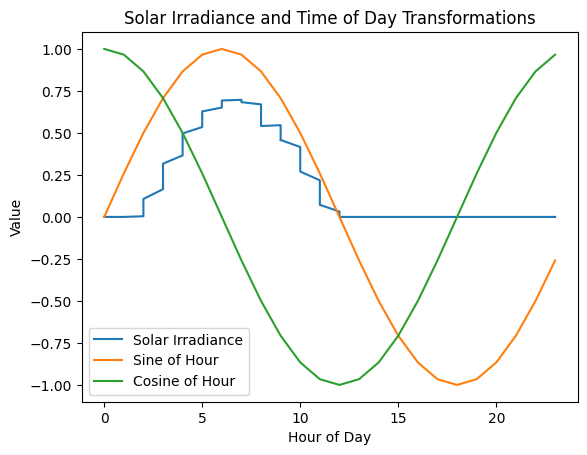

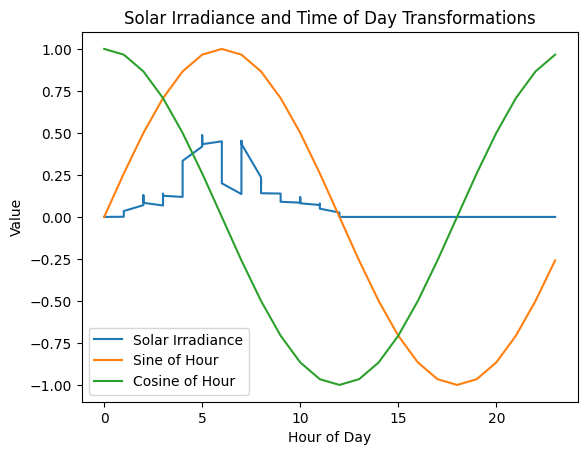

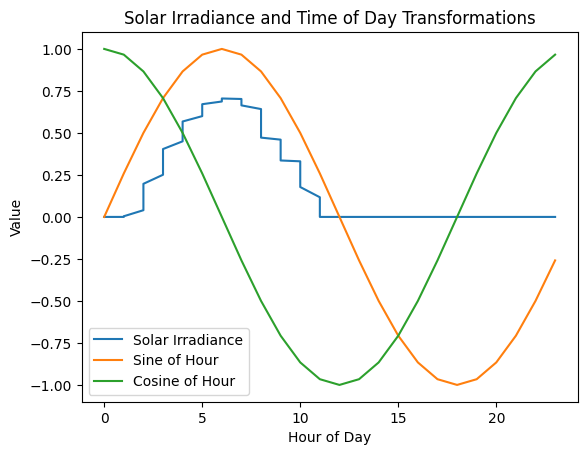

...

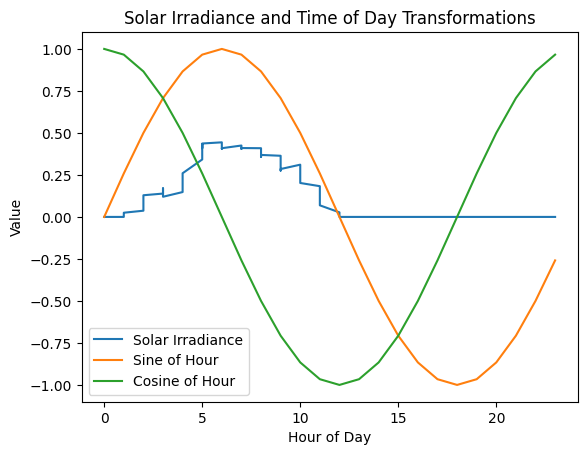

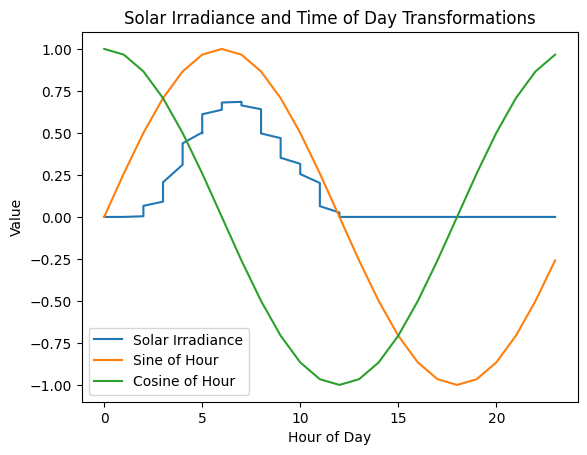

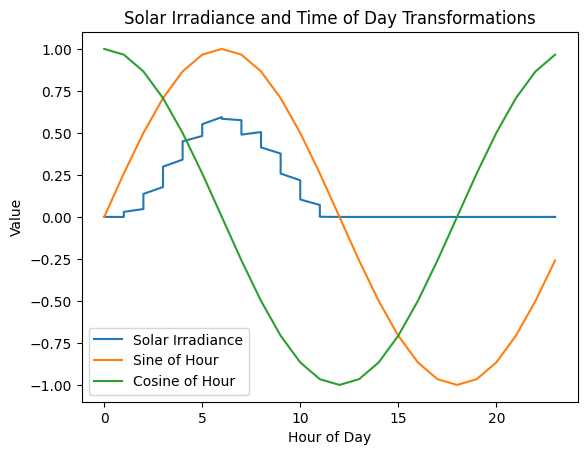

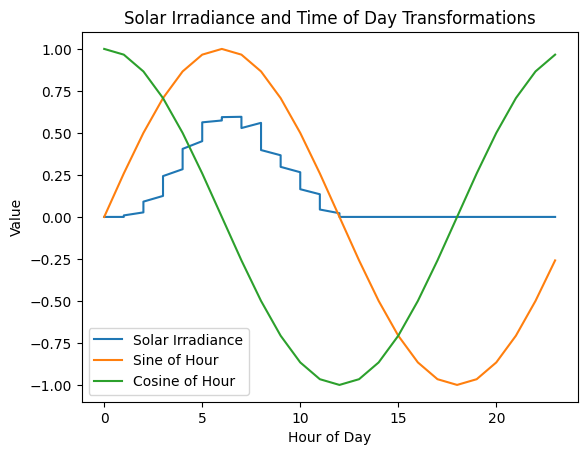

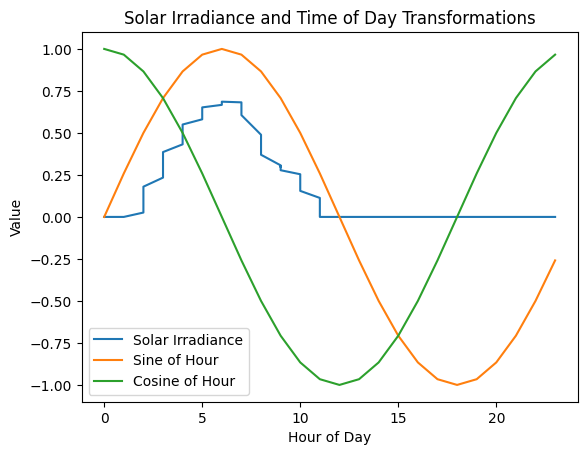

In [ ]:
# bh
dt_converter = DateTimeConverter(bh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
bh=dt_converter.get_data()
# ch
dt_converter = DateTimeConverter(ch)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
ch=dt_converter.get_data()
# dh
dt_converter = DateTimeConverter(dh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
dh=dt_converter.get_data()
# kam
dt_converter = DateTimeConverter(kam)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kam=dt_converter.get_data()
# kaz
dt_converter = DateTimeConverter(kaz)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kaz=dt_converter.get_data()
# kur
dt_converter = DateTimeConverter(kur)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kur=dt_converter.get_data()
# man
dt_converter = DateTimeConverter(man)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
man=dt_converter.get_data()
# pava
dt_converter = DateTimeConverter(pava)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pava=dt_converter.get_data()
# pha
dt_converter = DateTimeConverter(pha)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pha=dt_converter.get_data()
# rew
dt_converter = DateTimeConverter(rew)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
rew=dt_converter.get_data()
# sak
dt_converter = DateTimeConverter(sak)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
sak=dt_converter.get_data()
# tan
dt_converter = DateTimeConverter(tan)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
tan=dt_converter.get_data()


# Checking the variance of the data

In [ ]:
class SolarIrradianceMetrics:
    def __init__(self, data_file):
        self.data = data_file
        self.Irradiance = self.data['Ghi']

    def get_mean(self):
        return np.mean(self.Irradiance)

    def get_iqr(self):
        q1 = np.percentile(self.Irradiance, 25)
        q3 = np.percentile(self.Irradiance, 75)
        return q3 - q1

    def get_std_dev(self):
        return np.std(self.Irradiance)

    def plot_histogram(self):
        plt.hist(self.Irradiance, bins=50)
        plt.title('Distribution of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.ylabel('Frequency')
        plt.show()

    def plot_boxplot(self):
        plt.boxplot(self.Irradiance)
        plt.title('Boxplot of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.show()

    def plot_stats(self):
        mean = self.get_mean()
        iqr = self.get_iqr()
        std_dev = self.get_std_dev()

        fig, ax = plt.subplots()
        ax.bar(['Mean', 'IQR', 'Std. Dev.'], [mean, iqr, std_dev])
        ax.set_title('Statistics of Solar Irradiance Data')
        ax.set_ylabel('Irradiance (W/m^2)')
        plt.show()


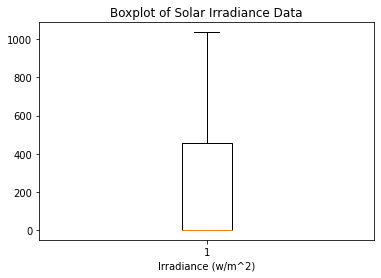

Stnadard Deviation :- 300.776681824732
Inter-quartile Range :- 455.0
Mean :- 220.87882733585857


In [ ]:
sm=SolarIrradianceMetrics(bh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

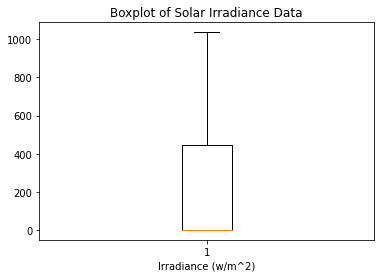

Stnadard Deviation :- 299.4462966874787
Inter-quartile Range :- 443.25
Mean :- 218.87026515151516


In [ ]:
sm=SolarIrradianceMetrics(ch)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

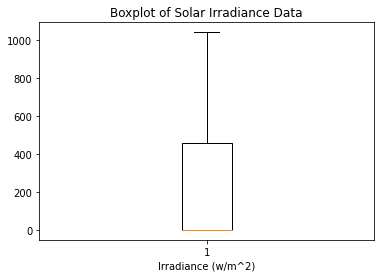

Stnadard Deviation :- 303.24702833181635
Inter-quartile Range :- 456.0
Mean :- 222.03224957912457


In [ ]:
sm=SolarIrradianceMetrics(dh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

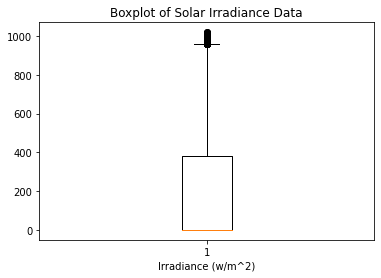

Stnadard Deviation :- 290.02785081617975
Inter-quartile Range :- 383.0
Mean :- 204.68711858164983


In [ ]:
sm=SolarIrradianceMetrics(kam)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

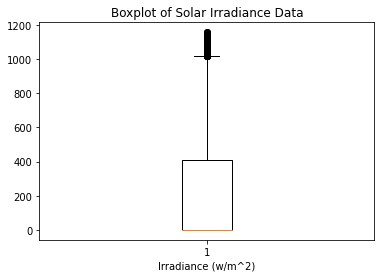

Stnadard Deviation :- 310.9372758982954
Inter-quartile Range :- 407.0
Mean :- 221.69787720959596


In [ ]:
sm=SolarIrradianceMetrics(kaz)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

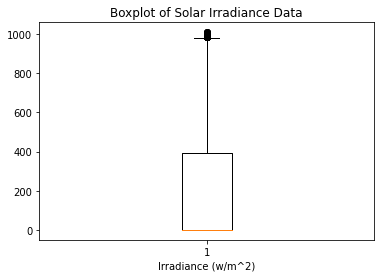

Stnadard Deviation :- 292.4554611962433
Inter-quartile Range :- 393.0
Mean :- 207.43233112373738


In [ ]:
sm=SolarIrradianceMetrics(kur)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

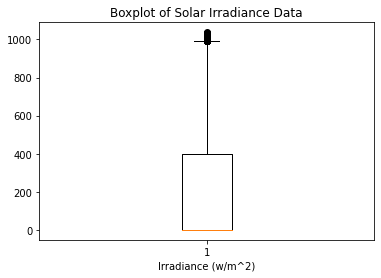

Stnadard Deviation :- 293.2598505729882
Inter-quartile Range :- 397.0
Mean :- 206.58691077441077


In [ ]:
sm=SolarIrradianceMetrics(man)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

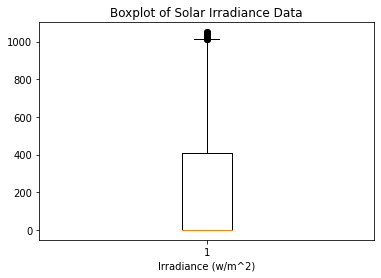

Stnadard Deviation :- 300.8688450373308
Inter-quartile Range :- 406.25
Mean :- 214.91398358585857


In [ ]:
sm=SolarIrradianceMetrics(pava)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

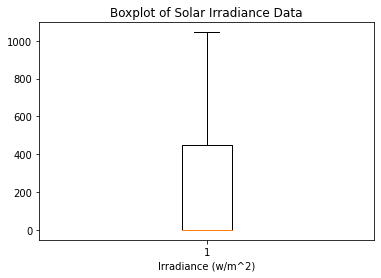

Stnadard Deviation :- 300.6777040313171
Inter-quartile Range :- 451.0
Mean :- 220.29261363636363


In [ ]:
sm=SolarIrradianceMetrics(pha)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

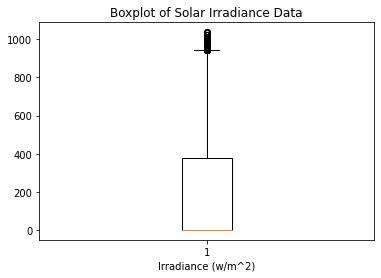

Stnadard Deviation :- 283.85183627053846
Inter-quartile Range :- 378.0
Mean :- 198.93054240319864


In [ ]:
sm=SolarIrradianceMetrics(rew)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

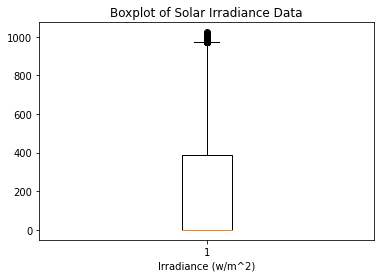

Stnadard Deviation :- 288.5697624045657
Inter-quartile Range :- 389.0
Mean :- 204.15330387205387


In [ ]:
sm=SolarIrradianceMetrics(sak)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

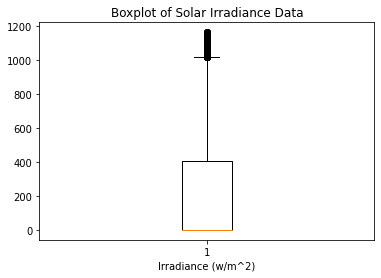

Stnadard Deviation :- 305.13550593345474
Inter-quartile Range :- 407.0
Mean :- 220.37240898569024


In [ ]:
sm=SolarIrradianceMetrics(tan)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

# Finding Optimal Time steps Lags

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

class AutocorrelationAnalyzer:
    def __init__(self, data, column_name):
        self.data = data
        self.column_name = column_name

    def calculate_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        acf_values = pd.Series(self.data[self.column_name]).autocorr(lag=lags)
        return acf_values

    def plot_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        fig, ax = plt.subplots(figsize=(10, 6))
        plot_acf(self.data[self.column_name], lags=lags, ax=ax)
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation Function')
        plt.show()

Autocorrelation at lag 4: 0.930416574132719


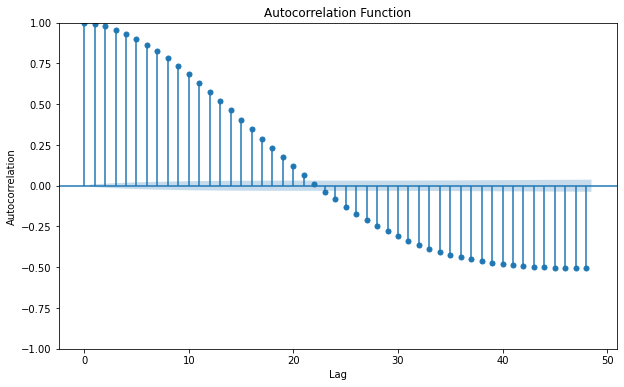

In [ ]:




# Replace 'irradiance' with the name of the column containing your irradiance data
column_name = 'Ghi'

# Create an AutocorrelationAnalyzer instance
analyzer = AutocorrelationAnalyzer(kaz, column_name)

# Calculate and print the autocorrelation for a specific lag (e.g., 4)
lag = 4
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

# Plot the autocorrelation function for the time series
lags_to_plot = 48  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

In [ ]:
lag = 96
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

Autocorrelation at lag 96: 0.9121131977606574


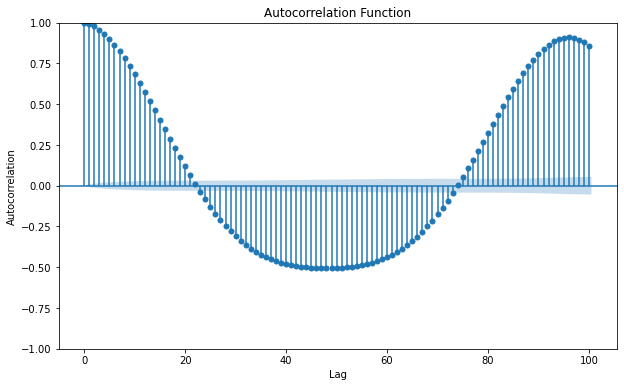

In [ ]:
# Plot the autocorrelation function for the time series
lags_to_plot = 100  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

# Data Spliting

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start_4 = "2022-07-31T00:00:00Z"
        train_end_4 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_8 = "2022-03-31T00:00:00Z"
        train_end_8 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_12 = "2021-12-31T00:00:00Z"
        train_end_12 = "2022-12-31T23:45:00Z"


        # Set the test data range
        test_start = "2022-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train_4 = self.df[(self.df['PeriodStart'] >= train_start_4) & (self.df['PeriodStart'] <= train_end_4)]
        self.train_8 = self.df[(self.df['PeriodStart'] >= train_start_8) & (self.df['PeriodStart'] <= train_end_8)]
        self.train_12 = self.df[(self.df['PeriodStart'] >= train_start_12) & (self.df['PeriodStart'] <= train_end_12)]
        self.test = self.df[self.df['PeriodStart'] >= test_start]

        self.x_train_4, self.y_train_4 = self.split_sequences(self.train_4.values)
        self.x_train_8, self.y_train_8 = self.split_sequences(self.train_8.values)
        self.x_train_12, self.y_train_12 = self.split_sequences(self.train_12.values)
        self.x_test, self.y_test = self.split_sequences(self.test.values)

        self.x_train_4, self.y_train_4 = self.unique_shapes(self.x_train_4, self.y_train_4, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_8, self.y_train_8 = self.unique_shapes(self.x_train_8, self.y_train_8, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_12, self.y_train_12 = self.unique_shapes(self.x_train_12, self.y_train_12, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_test, self.y_test   = self.unique_shapes(self.x_test,  self.y_test,  self.lag, self.n_features, self.num_of_outputs,self.only_production)

        return ((self.x_train_4[:, :, 1:],self.y_train_4),(self.x_train_8[:, :, 1:],self.y_train_8),(self.x_train_12[:, :, 1:],self.y_train_12),(self.x_test[:, :, 1:],self.y_test))

In [ ]:
len(bh.columns)-1

26

In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

## BH

In [ ]:
sd1=SplitData(bh,n_timesteps,n_outputs,only_production=False)
bh_train_4,bh_train_8,bh_train_12,bh_test=sd1.preprocess_data()
X_train_bh_4,y_train_bh_4=bh_train_4
X_train_bh_8,y_train_bh_8=bh_train_8
X_train_bh_12,y_train_bh_12=bh_train_12
X_test_bh,y_test_bh=bh_test

<ipython-input-10-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
df_bh=bh.copy()

df_train_4_date_bh=pd.DataFrame()
df_train_8_date_bh=pd.DataFrame()
df_train_12_date_bh=pd.DataFrame()
df_test_date_bh=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_bh['PeriodStart'] = pd.to_datetime(df_bh['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_bh['Date'] = df_bh[(df_bh['PeriodStart'] >= train_start_4) & (df_bh['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_bh['Date'] = df_bh[(df_bh['PeriodStart'] >= train_start_8) & (df_bh['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_bh['Date']= df_bh[(df_bh['PeriodStart'] >= train_start_12) & (df_bh['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_bh['Date']= df_bh[(df_bh['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_bh=df_train_4_date_bh.iloc[-len(X_train_bh_4):]
df_train_8_date_bh=df_train_8_date_bh.iloc[-len(X_train_bh_8):]
df_train_12_date_bh=df_train_12_date_bh.iloc[-len(X_train_bh_12):]
df_test_date_bh=df_test_date_bh.iloc[-len(X_test_bh):]

## DH

In [ ]:
sd2=SplitData(dh,n_timesteps,n_outputs,only_production=False)
dh_train_4,dh_train_8,dh_train_12,dh_test=sd2.preprocess_data()
X_train_dh_4,y_train_dh_4=dh_train_4
X_train_dh_8,y_train_dh_8=dh_train_8
X_train_dh_12,y_train_dh_12=dh_train_12
X_test_dh,y_test_dh=dh_test



df_dh=dh.copy()

df_train_4_date_dh=pd.DataFrame()
df_train_8_date_dh=pd.DataFrame()
df_train_12_date_dh=pd.DataFrame()
df_test_date_dh=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_dh['PeriodStart'] = pd.to_datetime(df_dh['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_dh['Date'] = df_dh[(df_dh['PeriodStart'] >= train_start_4) & (df_dh['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_dh['Date'] = df_dh[(df_dh['PeriodStart'] >= train_start_8) & (df_dh['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_dh['Date']= df_dh[(df_dh['PeriodStart'] >= train_start_12) & (df_dh['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_dh['Date']= df_dh[(df_dh['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_dh=df_train_4_date_dh.iloc[-len(X_train_dh_4):]
df_train_8_date_dh=df_train_8_date_dh.iloc[-len(X_train_dh_8):]
df_train_12_date_dh=df_train_12_date_dh.iloc[-len(X_train_dh_12):]
df_test_date_dh=df_test_date_dh.iloc[-len(X_test_dh):]

<ipython-input-8-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


## CH

In [ ]:
sd3=SplitData(ch,n_timesteps,n_outputs,only_production=False)
ch_train_4,ch_train_8,ch_train_12,ch_test=sd3.preprocess_data()
X_train_ch_4,y_train_ch_4=ch_train_4
X_train_ch_8,y_train_ch_8=ch_train_8
X_train_ch_12,y_train_ch_12=ch_train_12
X_test_ch,y_test_ch=ch_test



df_ch=ch.copy()

df_train_4_date_ch=pd.DataFrame()
df_train_8_date_ch=pd.DataFrame()
df_train_12_date_ch=pd.DataFrame()
df_test_date_ch=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_ch['PeriodStart'] = pd.to_datetime(df_ch['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_ch['Date'] = df_ch[(df_ch['PeriodStart'] >= train_start_4) & (df_ch['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_ch['Date'] = df_ch[(df_ch['PeriodStart'] >= train_start_8) & (df_ch['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_ch['Date']= df_ch[(df_ch['PeriodStart'] >= train_start_12) & (df_ch['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_ch['Date']= df_ch[(df_ch['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_ch=df_train_4_date_ch.iloc[-len(X_train_ch_4):]
df_train_8_date_ch=df_train_8_date_ch.iloc[-len(X_train_ch_8):]
df_train_12_date_ch=df_train_12_date_ch.iloc[-len(X_train_ch_12):]
df_test_date_ch=df_test_date_ch.iloc[-len(X_test_ch):]

<ipython-input-8-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


# Data Scaling

In [ ]:
X_train_bh_4 = X_train_bh_4.astype('float32')
y_train_bh_4 = y_train_bh_4.astype('float32')

X_train_bh_8 = X_train_bh_8.astype('float32')
y_train_bh_8 = y_train_bh_8.astype('float32')

X_train_bh_12 = X_train_bh_12.astype('float32')
y_train_bh_12 = y_train_bh_12.astype('float32')

X_test_bh = X_test_bh.astype('float32')
y_test_bh = y_test_bh.astype('float32')

In [ ]:
X_train_dh_4 = X_train_dh_4.astype('float32')
y_train_dh_4 = y_train_dh_4.astype('float32')

X_train_dh_8 = X_train_dh_8.astype('float32')
y_train_dh_8 = y_train_dh_8.astype('float32')

X_train_dh_12 = X_train_dh_12.astype('float32')
y_train_dh_12 = y_train_dh_12.astype('float32')

X_test_dh = X_test_dh.astype('float32')
y_test_dh = y_test_dh.astype('float32')

In [ ]:
X_train_ch_4 = X_train_ch_4.astype('float32')
y_train_ch_4 = y_train_ch_4.astype('float32')

X_train_ch_8 = X_train_ch_8.astype('float32')
y_train_ch_8 = y_train_ch_8.astype('float32')

X_train_ch_12 = X_train_ch_12.astype('float32')
y_train_ch_12 = y_train_ch_12.astype('float32')

X_test_ch = X_test_ch.astype('float32')
y_test_ch = y_test_ch.astype('float32')

## BH

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_bh_4 = X_train_bh_4.reshape(X_train_bh_4.shape[0], -1)
X_train_flat_bh_8= X_train_bh_8.reshape(X_train_bh_8.shape[0], -1)
X_train_flat_bh_12 = X_train_bh_12.reshape(X_train_bh_12.shape[0], -1)
X_test_flat_bh = X_test_bh.reshape(X_test_bh.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_bh = MinMaxScaler(feature_range=(0,1))
X_train_scaled_bh_4 = scaler_bh.fit_transform(X_train_flat_bh_4)
X_train_scaled_bh_8 = scaler_bh.fit_transform(X_train_flat_bh_8)
X_train_scaled_bh_12 = scaler_bh.fit_transform(X_train_flat_bh_12)
X_test_scaled_bh = scaler_bh.transform(X_test_flat_bh)

# Reshape back to original shape
X_train_bh_4= X_train_scaled_bh_4.reshape(X_train_bh_4.shape)
X_train_bh_8= X_train_scaled_bh_8.reshape(X_train_bh_8.shape)
X_train_bh_12= X_train_scaled_bh_12.reshape(X_train_bh_12.shape)
X_test_bh= X_test_scaled_bh.reshape(X_test_bh.shape)


scaler_y_bh = MinMaxScaler(feature_range=(0,1))
y_train_bh_4 = scaler_y_bh.fit_transform(y_train_bh_4)
y_train_bh_8 = scaler_y_bh.fit_transform(y_train_bh_8)
y_train_bh_12 = scaler_y_bh.fit_transform(y_train_bh_12)
y_test_bh=scaler_y_bh.transform(y_test_bh)

## DH

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_dh_4 = X_train_dh_4.reshape(X_train_dh_4.shape[0], -1)
X_train_flat_dh_8= X_train_dh_8.reshape(X_train_dh_8.shape[0], -1)
X_train_flat_dh_12 = X_train_dh_12.reshape(X_train_dh_12.shape[0], -1)
X_test_flat_dh = X_test_dh.reshape(X_test_dh.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_dh = MinMaxScaler(feature_range=(0,1))
X_train_scaled_dh_4 = scaler_dh.fit_transform(X_train_flat_dh_4)
X_train_scaled_dh_8 = scaler_dh.fit_transform(X_train_flat_dh_8)
X_train_scaled_dh_12 = scaler_dh.fit_transform(X_train_flat_dh_12)
X_test_scaled_dh = scaler_dh.transform(X_test_flat_dh)

# Reshape back to original shape
X_train_dh_4= X_train_scaled_dh_4.reshape(X_train_dh_4.shape)
X_train_dh_8= X_train_scaled_dh_8.reshape(X_train_dh_8.shape)
X_train_dh_12= X_train_scaled_dh_12.reshape(X_train_dh_12.shape)
X_test_dh= X_test_scaled_dh.reshape(X_test_dh.shape)


scaler_y_dh = MinMaxScaler(feature_range=(0,1))
y_train_dh_4 = scaler_y_dh.fit_transform(y_train_dh_4)
y_train_dh_8 = scaler_y_dh.fit_transform(y_train_dh_8)
y_train_dh_12 = scaler_y_dh.fit_transform(y_train_dh_12)
y_test_dh=scaler_y_dh.transform(y_test_dh)

## CH

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_ch_4 = X_train_ch_4.reshape(X_train_ch_4.shape[0], -1)
X_train_flat_ch_8= X_train_ch_8.reshape(X_train_ch_8.shape[0], -1)
X_train_flat_ch_12 = X_train_ch_12.reshape(X_train_ch_12.shape[0], -1)
X_test_flat_ch = X_test_ch.reshape(X_test_ch.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_ch = MinMaxScaler(feature_range=(0,1))
X_train_scaled_ch_4 = scaler_ch.fit_transform(X_train_flat_ch_4)
X_train_scaled_ch_8 = scaler_ch.fit_transform(X_train_flat_ch_8)
X_train_scaled_ch_12 = scaler_ch.fit_transform(X_train_flat_ch_12)
X_test_scaled_ch = scaler_ch.transform(X_test_flat_ch)

# Reshape back to original shape
X_train_ch_4= X_train_scaled_ch_4.reshape(X_train_ch_4.shape)
X_train_ch_8= X_train_scaled_ch_8.reshape(X_train_ch_8.shape)
X_train_ch_12= X_train_scaled_ch_12.reshape(X_train_ch_12.shape)
X_test_ch= X_test_scaled_ch.reshape(X_test_ch.shape)


scaler_y_ch = MinMaxScaler(feature_range=(0,1))
y_train_ch_4 = scaler_y_ch.fit_transform(y_train_ch_4)
y_train_ch_8 = scaler_y_ch.fit_transform(y_train_ch_8)
y_train_ch_12 = scaler_y_ch.fit_transform(y_train_ch_12)
y_test_ch=scaler_y_ch.transform(y_test_ch)

# Solar Irradiance Forecasting Transfer-Learning Model

In [ ]:
from keras.layers import Reshape
class TransferLearningModel:

    def __init__(self, base_model_path, target_regions, n_timesteps, n_features, n_outputs):
        self.base_model_path = base_model_path
        self.target_regions = target_regions
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = None
        self.history = None

    def build_model_strategy_1(self):
        # Load base model and freeze all layers except last one
        self.model = load_model(self.base_model_path)
        for layer in self.model.layers[:-1]:
            layer.trainable = False

    def build_model_strategy_2(self):
    # Load base model and use it as weight initialization for TL model
      self.model = load_model(self.base_model_path)
    def build_model_strategy_3(self):
    # Load base model and freeze initial layers, add new output layer
      self.model = load_model(self.base_model_path)
      for layer in self.model.layers[:-1]:
          layer.trainable = False
      self.model.layers[-2].trainable = True
      self.model.pop()
      x = self.model.layers[-1].output
      x = Dense(self.n_outputs)(x)
      self.model = Model(inputs=self.model.input, outputs=x)
    def compile_model(self, learning_rate=0.001):
        optimizer = Adam(learning_rate=learning_rate)
        self.model.compile(optimizer=optimizer, loss='mse')
        self.model.summary()

    def fit_model(self, train_data, train_labels, val_data, val_labels, batch_size=128 ,epochs=250, patience=10, verbose=1,
                checkpoint_path=None):
        # Define early stopping and model checkpoint callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=verbose, mode='min', restore_best_weights=True)
        if checkpoint_path is not None:
            model_checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=verbose, save_best_only=True, mode='min')

        # Fit the model
        if checkpoint_path is not None:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[ model_checkpoint,early_stopping], verbose=verbose)
        else:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[model_checkpoint,early_stopping], verbose=verbose)
    def load_trained_model(self, path):
      self.model = load_model(path)

    def plot_loss_history(self):
        train_loss = self.history.history['loss']
        val_loss = self.history.history['val_loss']
        epochs = range(1, len(train_loss) + 1)
        plt.plot(epochs, train_loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
    def save_trained(self,path):
      self.model.save(path)
    def predict(self, data):
        return self.model.predict(data)


# Bh

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_bh_4, y_train_bh_4, X_test_bh, y_test_bh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0457 - mae: 0.0970
Epoch 1: val_loss improved from inf to 0.00234, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 36s 159ms/step - loss: 0.0457 - mae: 0.0970 - val_loss: 0.0023 - val_mae: 0.0403
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0017 - mae: 0.0248
Epoch 2: val_loss did not improve from 0.00234
92/92 [==============================] - 12s 126ms/step - loss: 0.0017 - mae: 0.0248 - val_loss: 0.0031 - val_mae: 0.0464
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0014 - mae: 0.0208
Epoch 3: val_loss did not improve from 0.00234
92/92 [==============================] - 12s 129ms/step - loss: 0.0014 - mae: 0.0208 - val_loss: 0.0024 - val_mae: 0.0433
Epoch 4/250
92/92 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0182
Epoch 4: val_loss im

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

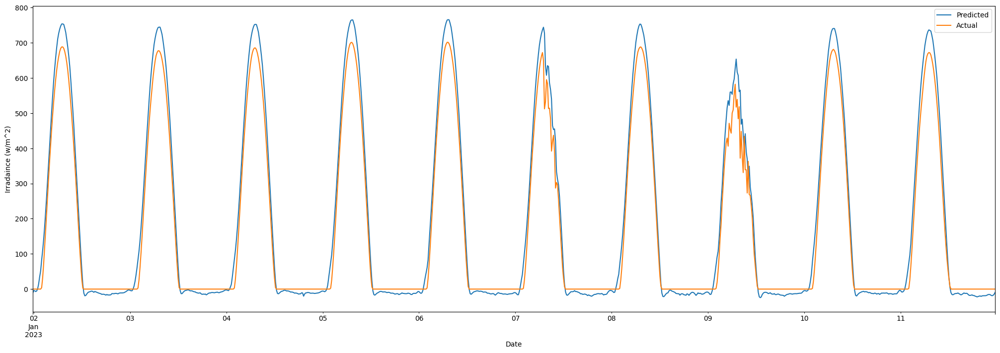

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(best_model.predict(X_test_bh))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))

181/181 [==============================] - 5s 26ms/step
r2_Score 0.9853042512861081
Root Mean Sqaured Error 35.820316
Mean Absolute Error 26.789097


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_bh_8, y_train_bh_8, X_test_bh, y_test_bh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0244 - mae: 0.0656
Epoch 1: val_loss improved from inf to 0.00135, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 35s 164ms/step - loss: 0.0244 - mae: 0.0656 - val_loss: 0.0014 - val_mae: 0.0302
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.0225
Epoch 2: val_loss improved from 0.00135 to 0.00084, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 24s 143ms/step - loss: 0.0016 - mae: 0.0225 - val_loss: 8.4147e-04 - val_mae: 0.0236
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0194
Epoch 3: val_loss improved from 0.00084 to 0.00064, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LS

181/181 [==============================] - 6s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

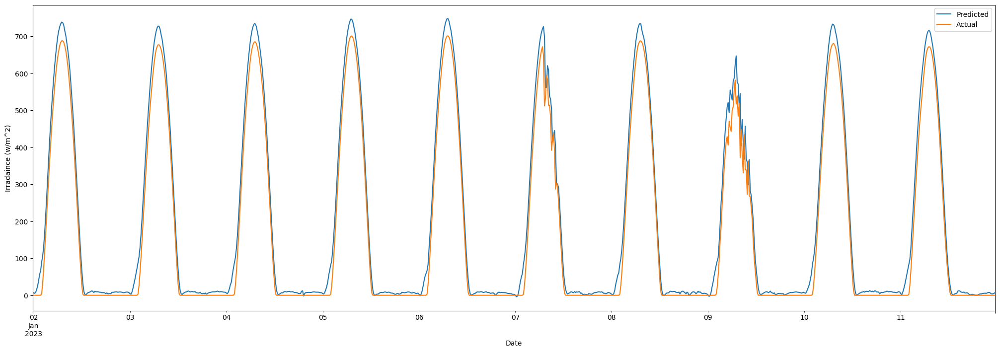

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(best_model.predict(X_test_bh))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9885269031624903
Root Mean Sqaured Error 30.312857
Mean Absolute Error 21.534626


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_bh_12, y_train_bh_12, X_test_bh, y_test_bh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.0504
Epoch 1: val_loss improved from inf to 0.00164, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 45s 168ms/step - loss: 0.0156 - mae: 0.0504 - val_loss: 0.0016 - val_mae: 0.0334
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0011 - mae: 0.0191
Epoch 2: val_loss improved from 0.00164 to 0.00116, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 30s 138ms/step - loss: 0.0011 - mae: 0.0191 - val_loss: 0.0012 - val_mae: 0.0276
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 8.3576e-04 - mae: 0.0158
Epoch 3: val_loss improved from 0.00116 to 0.00056, saving model to /content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/Bi-LS

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

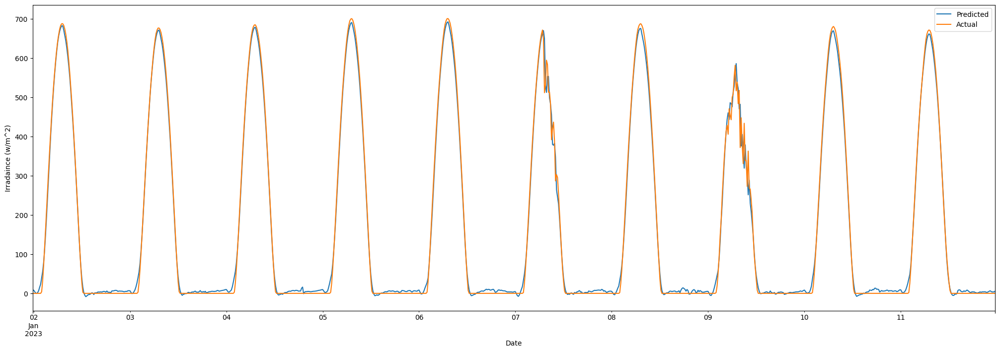

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(best_model.predict(X_test_bh))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9963492159064101
Root Mean Sqaured Error 16.23896
Mean Absolute Error 9.247374


## Persistance model

In [ ]:
bh

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,5.7,-104,3.9,6.7,80.3,994.8,61,3.1,115,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,5.7,-106,3.0,6.7,80.0,994.8,62,3.1,111,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,5.7,-107,2.6,6.7,79.8,994.8,63,3.0,108,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,5.7,-109,1.6,6.8,79.5,994.8,64,3.0,105,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,5.7,-110,1.5,6.8,79.4,994.9,65,3.0,102,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,20.0,-78,14.0,25.0,69.7,994.7,33,4.4,127,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,20.0,-80,8.6,25.0,69.9,994.8,32,4.4,124,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,19.8,-82,11.3,25.0,70.4,994.9,31,4.4,120,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,19.8,-84,0.0,25.0,70.8,995.0,30,4.3,117,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# bh['PeriodStart'] = pd.to_datetime(df_bh['PeriodStart'])
df_per_bh =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_bh = bh[bh['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_bh

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_bh
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_bh['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

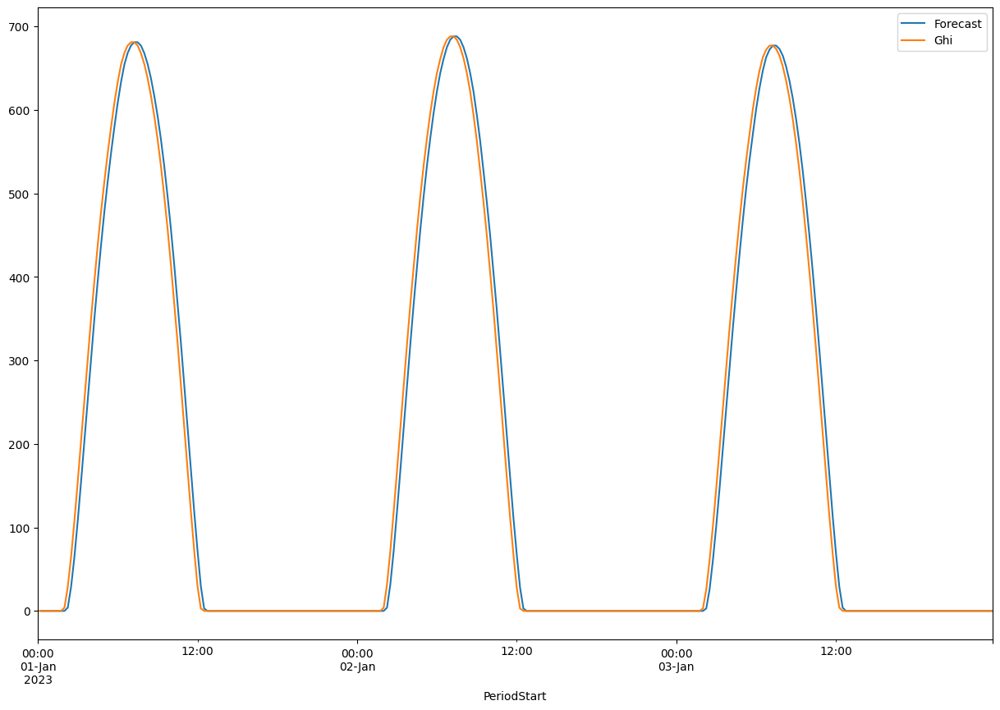

In [ ]:
df_per_bh.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_bh.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_bh['Forecast'],df_per_bh['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_bh['Forecast'],df_per_bh['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_bh['Forecast'],df_per_bh['Ghi']))

r2_Score 0.9896711949486058
Root Mean Sqaured Error 27.916950153847388
Mean Absolute Error 16.2199829205807


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_bh_4,y_train_bh_4,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
90/92 [============================>.] - ETA: 0s - loss: 5.6068e-04
Epoch 1: val_loss improved from inf to 0.00021, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9959252346507252
Root Mean Sqaured Error 17.395111
Mean Absolute Error 11.683685


Text(0, 0.5, 'Irradiance (W/m^2)')

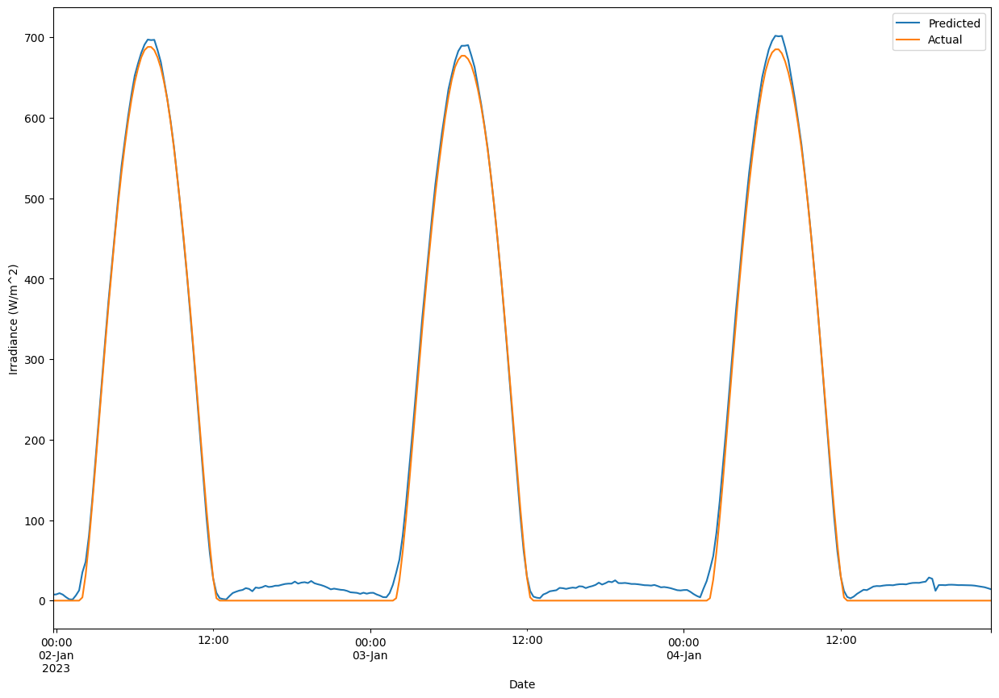

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_1.predict(X_test_bh))
print("r2_Score",r2_score(p3_1.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_bh_8,y_train_bh_8,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 6.0980e-04
Epoch 1: val_loss improved from inf to 0.00013, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9963666795621509
Root Mean Sqaured Error 16.376505
Mean Absolute Error 10.069593


Text(0, 0.5, 'Irradiance (W/m^2)')

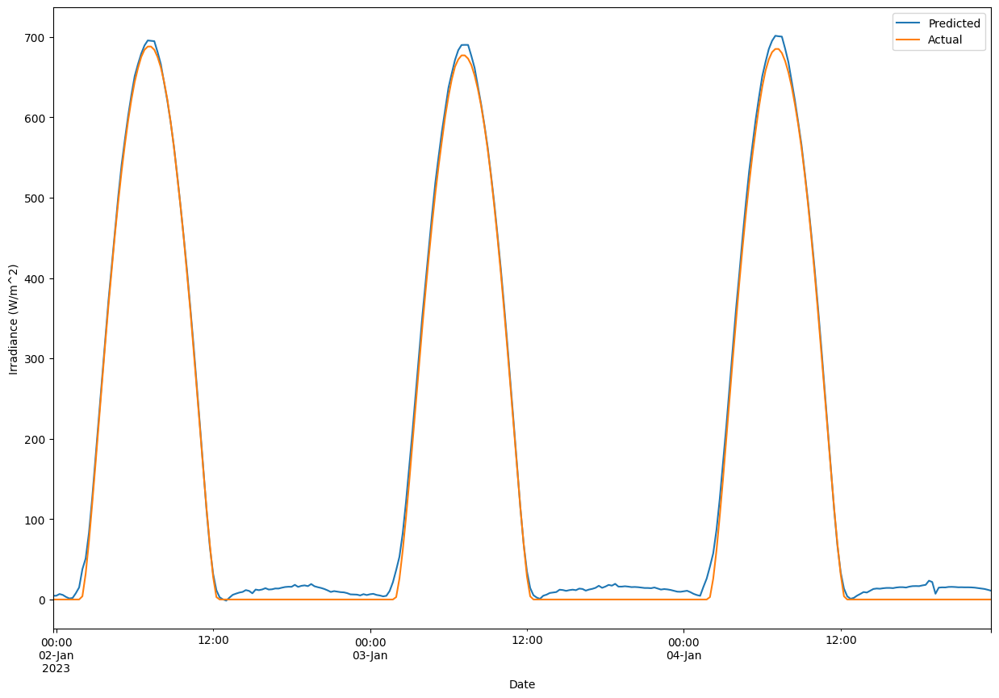

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_1.predict(X_test_bh))
print("r2_Score",r2_score(p3_1.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_bh_12,y_train_bh_12,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 5.0392e-04
Epoch 1: val_loss improved from inf to 0.00015, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9967370317720133
Root Mean Sqaured Error 15.438764
Mean Absolute Error 8.643132


Text(0, 0.5, 'Irradiance (W/m^2)')

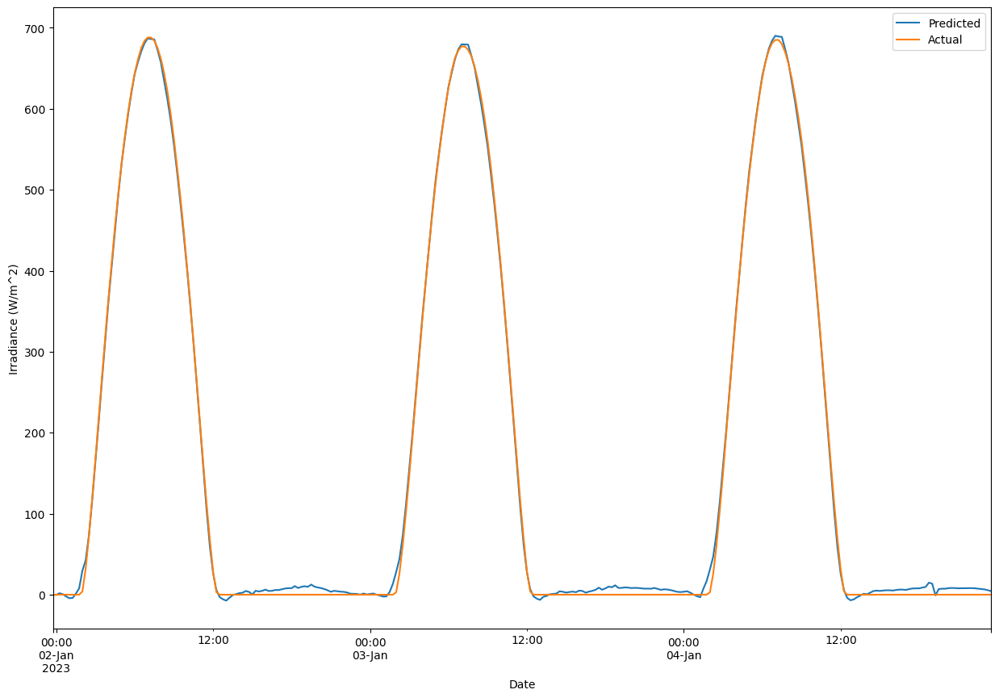

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_1.predict(X_test_bh))
print("r2_Score",r2_score(p3_1.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_bh_4,y_train_bh_4,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 7.8699e-04
Epoch 1: val_loss improved from inf to 0.00021, saving model to /content/drive/MyDrive/Generaliz

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9970407573173484
Root Mean Sqaured Error 14.799806
Mean Absolute Error 7.994938


Text(0, 0.5, 'Irradiance (W/m^2)')

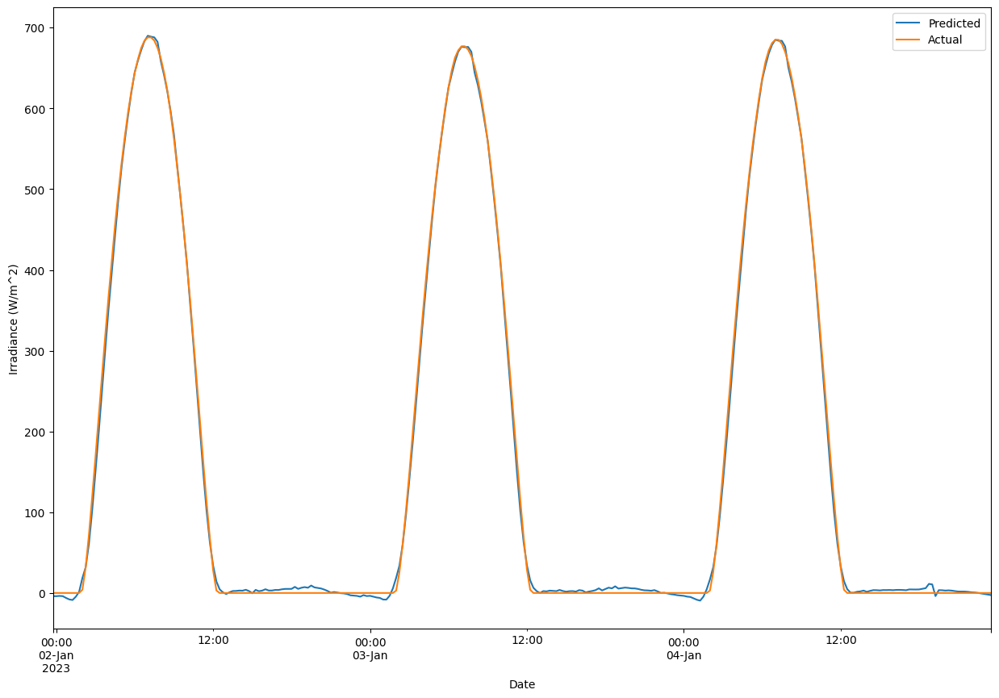

In [ ]:

df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_2.predict(X_test_bh))
print("r2_Score",r2_score(p3_2.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_bh_8,y_train_bh_8,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 6.9746e-04
Epoch 1: val_loss improved from inf to 0.00015, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9971767499189879
Root Mean Sqaured Error 14.358545
Mean Absolute Error 7.8867803


Text(0, 0.5, 'Irradiance (W/m^2)')

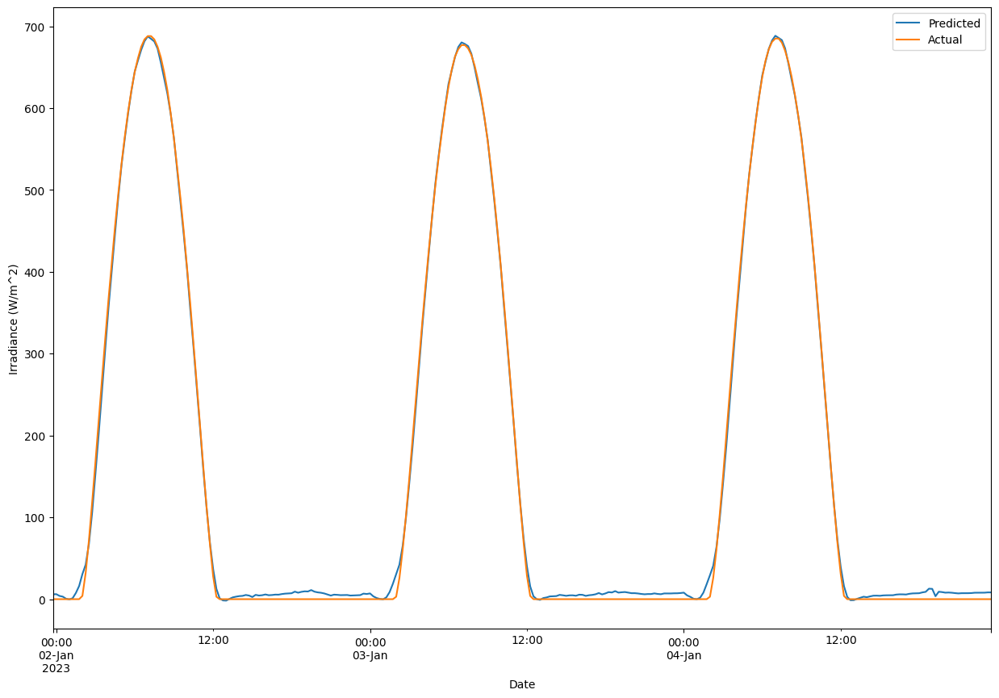

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_2.predict(X_test_bh))
print("r2_Score",r2_score(p3_2.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_bh_12,y_train_bh_12,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 5.6137e-04
Epoch 1: val_loss improved from inf to 0.00016, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9973876185373151
Root Mean Sqaured Error 14.1885605
Mean Absolute Error 7.052536


Text(0, 0.5, 'Irradiance (W/m^2)')

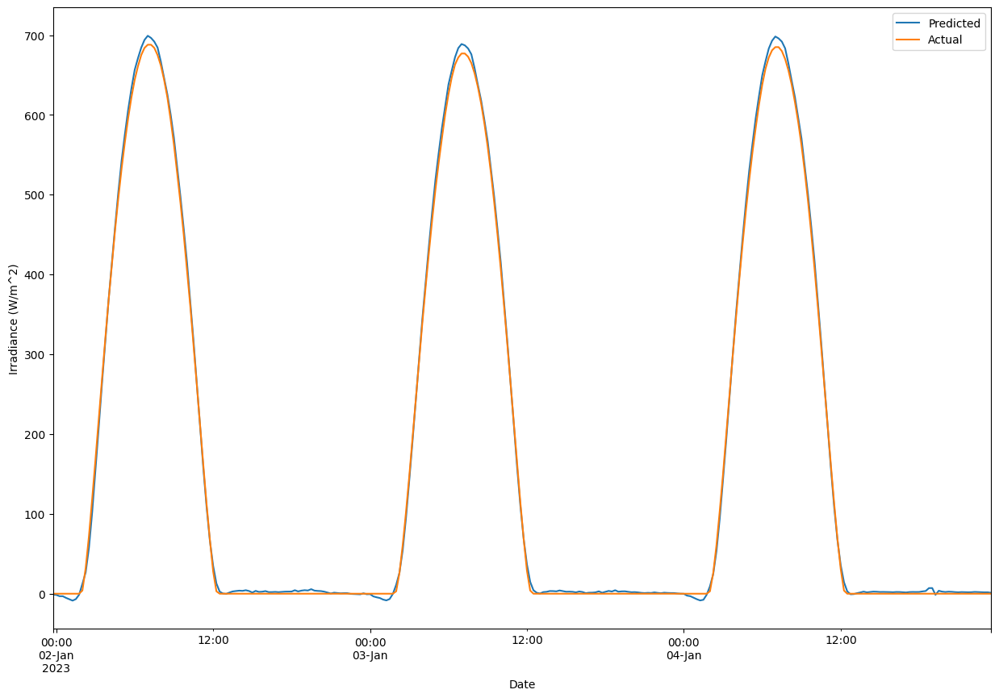

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_2.predict(X_test_bh))
print("r2_Score",r2_score(p3_2.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_bh_4,y_train_bh_4,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9948385778301562
Root Mean Sqaured Error 20.375898
Mean Absolute Error 13.687782


Text(0, 0.5, 'Irradiance (W/m^2)')

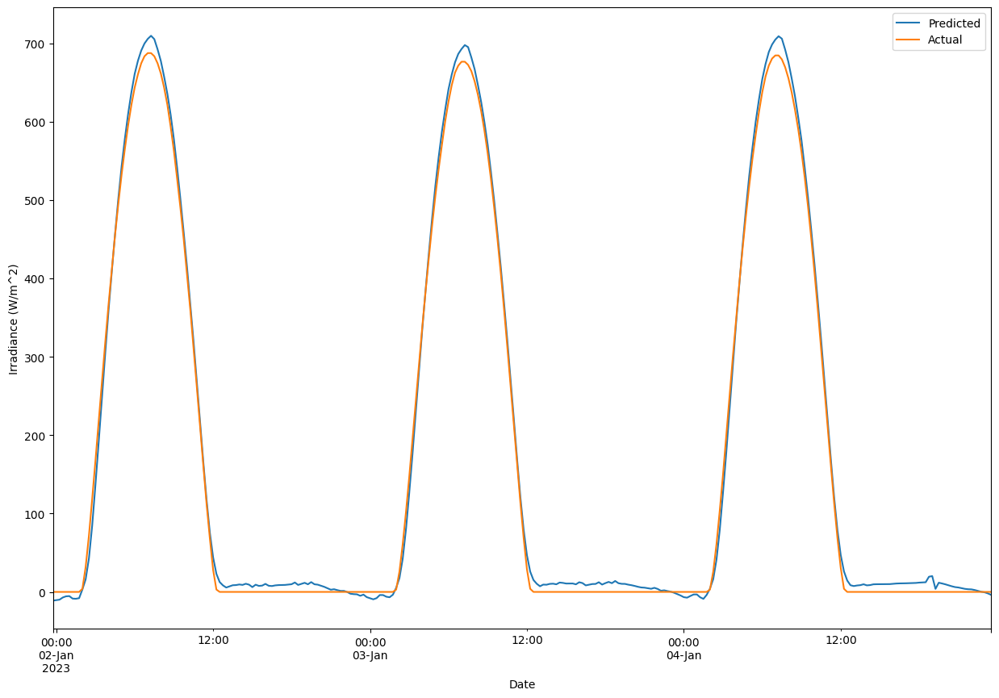

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_3.predict(X_test_bh))
print("r2_Score",r2_score(p3_3.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_bh_8,y_train_bh_8,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9914729683635695
Root Mean Sqaured Error 26.23337
Mean Absolute Error 19.617407


Text(0, 0.5, 'Irradiance (W/m^2)')

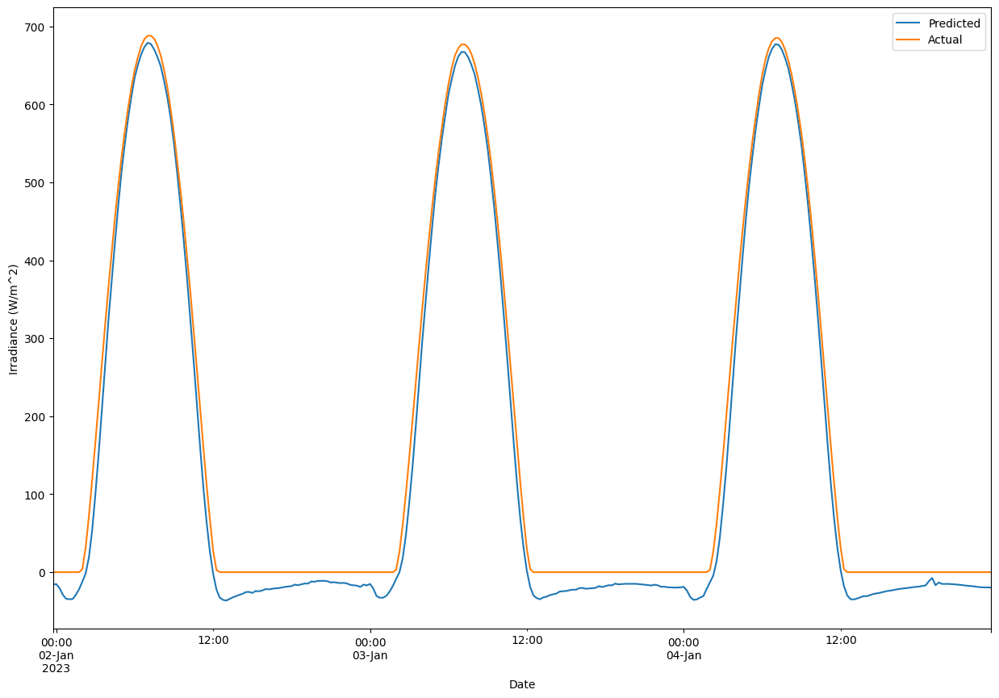

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_3.predict(X_test_bh))
print("r2_Score",r2_score(p3_3.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_bh_12,y_train_bh_12,X_test_bh,y_test_bh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9965391504992935
Root Mean Sqaured Error 16.157125
Mean Absolute Error 9.027065


Text(0, 0.5, 'Irradiance (W/m^2)')

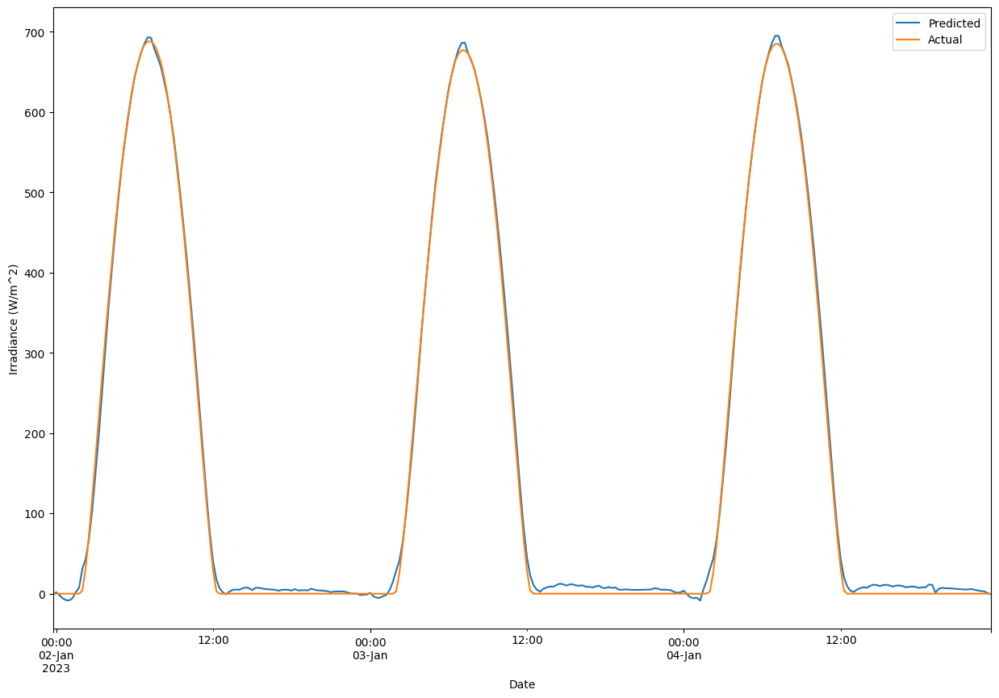

In [ ]:
df_test_date_bh['Actual']=scaler_y_bh.inverse_transform(y_test_bh)
df_test_date_bh['Predicted']=scaler_y_bh.inverse_transform(p3_3.predict(X_test_bh))
print("r2_Score",r2_score(p3_3.predict(X_test_bh),y_test_bh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_bh['Actual'],df_test_date_bh['Predicted']))
df_test_date_bh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Dh

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_dh_4, y_train_dh_4, X_test_dh, y_test_dh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0393 - mae: 0.0929
Epoch 1: val_loss improved from inf to 0.00115, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 27s 144ms/step - loss: 0.0393 - mae: 0.0929 - val_loss: 0.0011 - val_mae: 0.0241
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.0291
Epoch 2: val_loss did not improve from 0.00115
92/92 [==============================] - 12s 131ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0012 - val_mae: 0.0275
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0018 - mae: 0.0245
Epoch 3: val_loss did not improve from 0.00115
92/92 [==============================] - 12s 136ms/step - loss: 0.0018 - mae: 0.0245 - val_loss: 0.0015 - val_mae: 0.0315
Epoch 4/250
92/92 [==============================] - ETA: 0s - loss: 0.0015 - mae: 0.0224
Epoch 4: val_loss improv

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

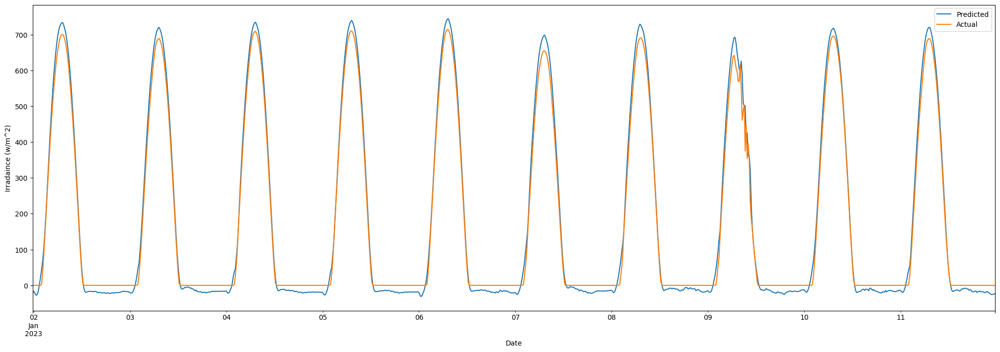

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(best_model.predict(X_test_dh))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))

181/181 [==============================] - 4s 19ms/step
r2_Score 0.98874229028879
Root Mean Sqaured Error 31.163713
Mean Absolute Error 26.59627


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_dh_8, y_train_dh_8, X_test_dh, y_test_dh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0309 - mae: 0.0709
Epoch 1: val_loss improved from inf to 0.00111, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 33s 159ms/step - loss: 0.0309 - mae: 0.0709 - val_loss: 0.0011 - val_mae: 0.0259
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0019 - mae: 0.0253
Epoch 2: val_loss improved from 0.00111 to 0.00074, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 24s 148ms/step - loss: 0.0019 - mae: 0.0253 - val_loss: 7.4382e-04 - val_mae: 0.0206
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0014 - mae: 0.0206
Epoch 3: val_loss improved from 0.00074 to 0.00064, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

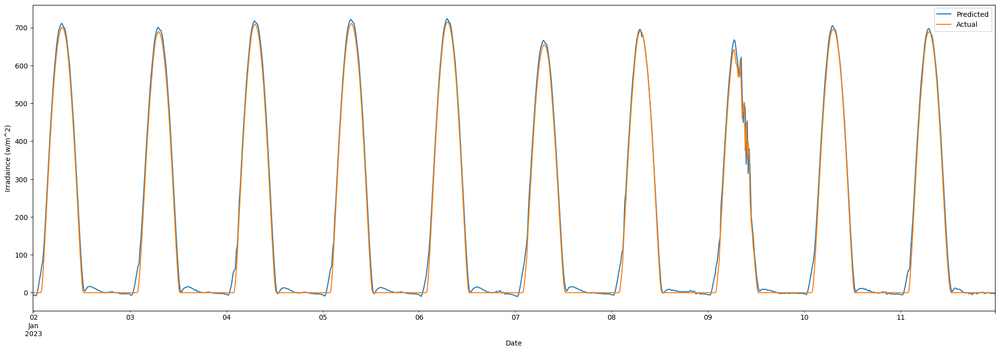

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(best_model.predict(X_test_dh))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9954728663441698
Root Mean Sqaured Error 19.158043
Mean Absolute Error 11.874714


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_dh_12, y_train_dh_12, X_test_dh, y_test_dh, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.0582
Epoch 1: val_loss improved from inf to 0.00097, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 41s 155ms/step - loss: 0.0210 - mae: 0.0582 - val_loss: 9.6729e-04 - val_mae: 0.0259
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0015 - mae: 0.0222
Epoch 2: val_loss improved from 0.00097 to 0.00078, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 30s 139ms/step - loss: 0.0015 - mae: 0.0222 - val_loss: 7.7614e-04 - val_mae: 0.0218
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0193
Epoch 3: val_loss improved from 0.00078 to 0.00074, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

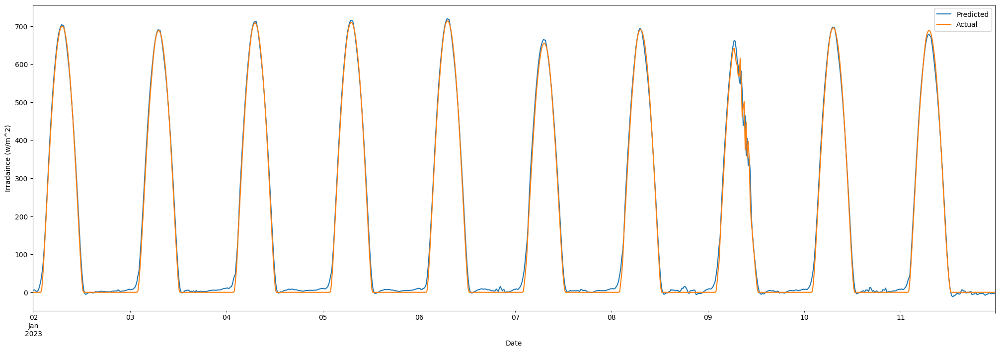

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(best_model.predict(X_test_dh))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9970241506103745
Root Mean Sqaured Error 15.360327
Mean Absolute Error 8.708325


## Persistance model

In [ ]:
dh

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,6.8,-105,28.2,5.5,70.0,990.8,55,4.1,114,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,6.8,-106,28.2,5.6,70.1,990.8,56,4.0,111,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,6.7,-107,28.2,5.6,70.3,990.9,57,3.9,108,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,6.7,-109,28.2,5.7,70.4,990.9,58,3.9,105,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,6.7,-110,28.9,5.7,70.5,991.0,59,3.8,102,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,20.6,-78,14.9,23.5,68.7,990.7,28,4.8,127,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,20.5,-81,3.6,23.5,69.2,990.7,27,4.7,124,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,20.3,-83,6.8,23.5,69.9,990.8,26,4.7,121,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,20.2,-85,11.3,23.5,70.6,990.9,25,4.7,117,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# dh['PeriodStart'] = pd.to_datetime(df_dh['PeriodStart'])
df_per_dh =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_dh = dh[dh['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_dh

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_dh
# Apply the Persistence model
forecast = persistence_model(data)

In [ ]:
df_per_dh['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

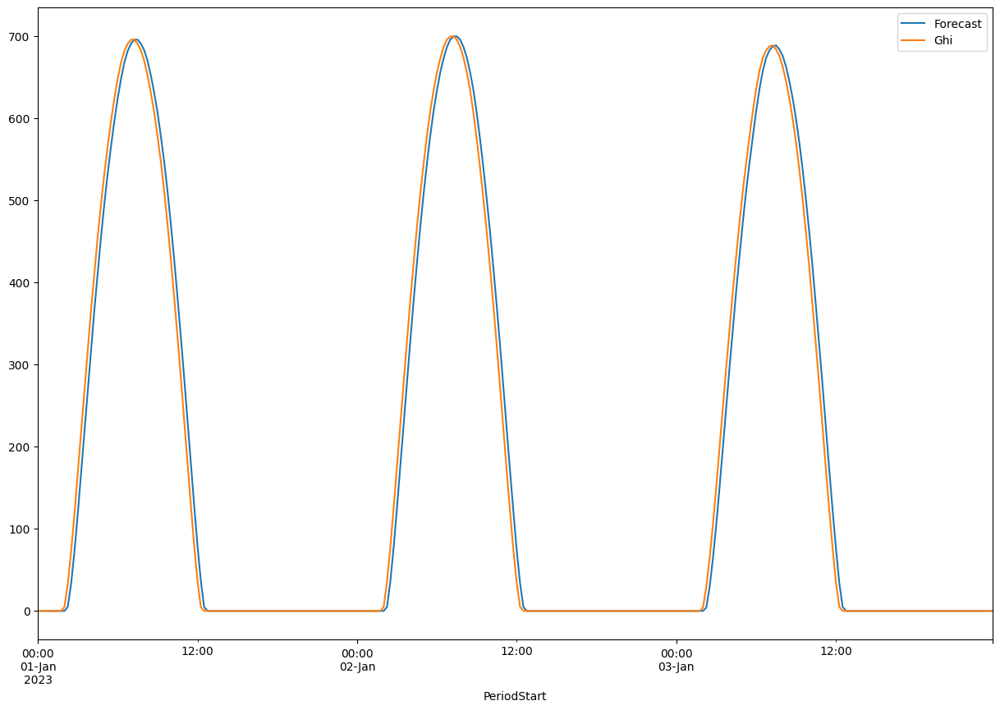

In [ ]:
df_per_dh.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_dh.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_dh['Forecast'],df_per_dh['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_dh['Forecast'],df_per_dh['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_dh['Forecast'],df_per_dh['Ghi']))

r2_Score 0.9897310279163231
Root Mean Sqaured Error 28.542457924209188
Mean Absolute Error 16.617591801878735


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_dh_4,y_train_dh_4,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 7.9447e-04
Epoch 1: val_loss improved from inf to 0.00016, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9961273144228495
Root Mean Sqaured Error 17.540167
Mean Absolute Error 11.482206


Text(0, 0.5, 'Irradiance (W/m^2)')

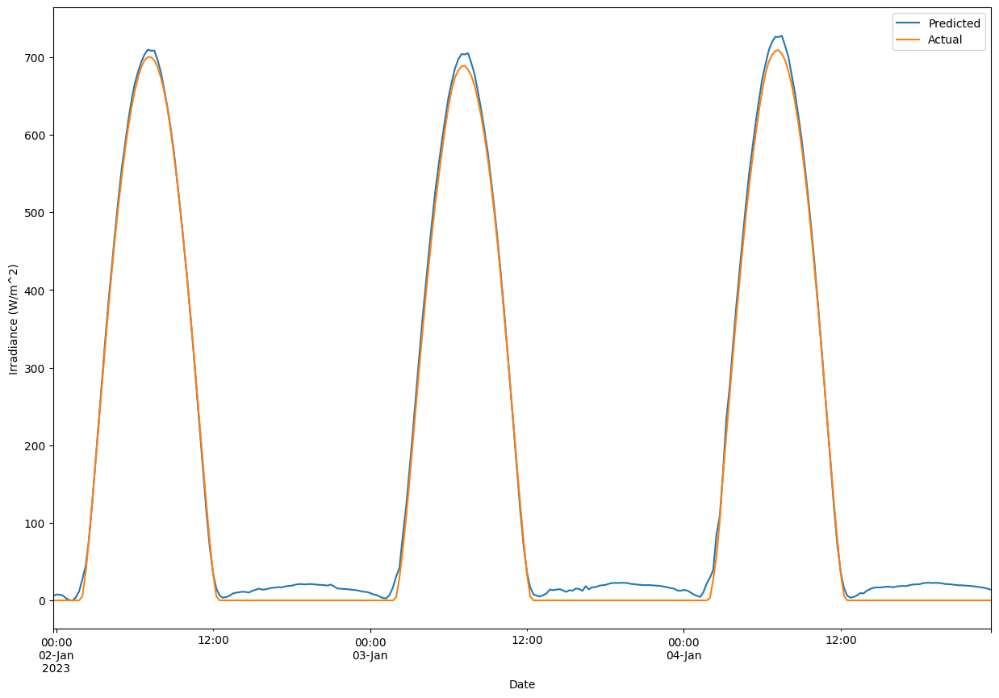

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_1.predict(X_test_dh))
print("r2_Score",r2_score(p3_1.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_dh_8,y_train_dh_8,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 7.8119e-04
Epoch 1: val_loss improved from inf to 0.00012, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 11ms/step
r2_Score 0.996612337653288
Root Mean Sqaured Error 16.297815
Mean Absolute Error 9.094132


Text(0, 0.5, 'Irradiance (W/m^2)')

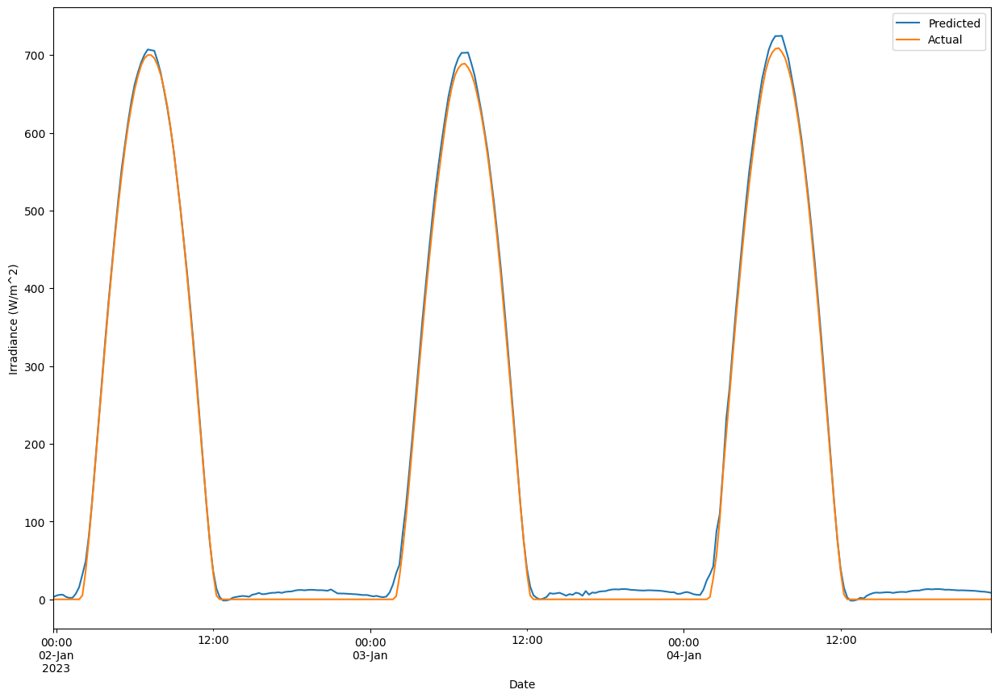

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_1.predict(X_test_dh))
print("r2_Score",r2_score(p3_1.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_dh_12,y_train_dh_12,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 6.3733e-04
Epoch 1: val_loss improved from inf to 0.00018, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 11ms/step
r2_Score 0.996932661462192
Root Mean Sqaured Error 15.468838
Mean Absolute Error 7.9696383


Text(0, 0.5, 'Irradiance (W/m^2)')

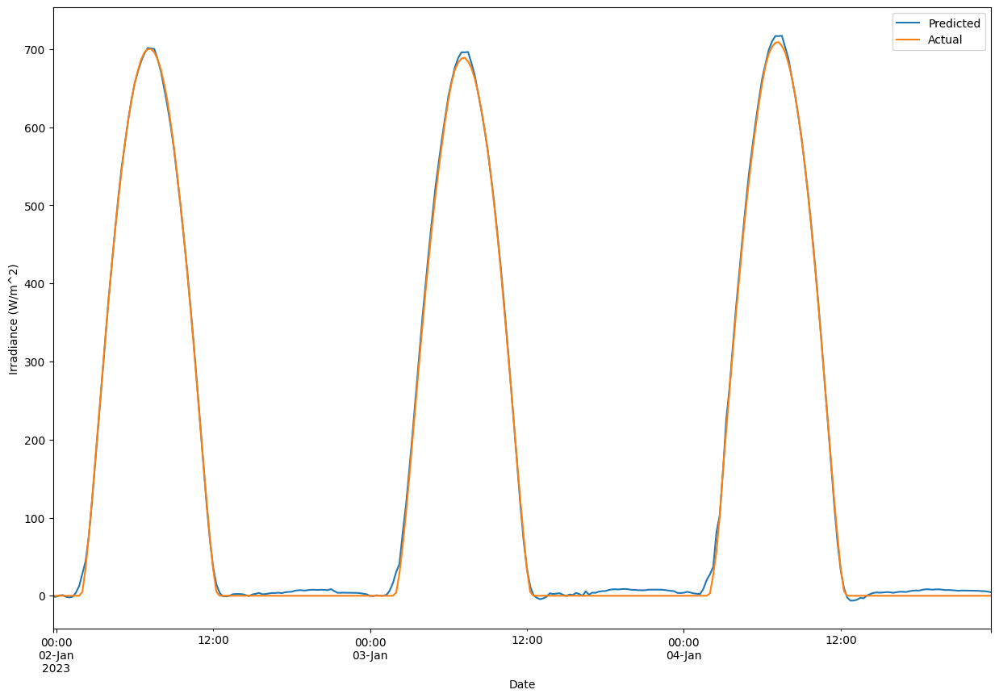

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_1.predict(X_test_dh))
print("r2_Score",r2_score(p3_1.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_dh_4,y_train_dh_4,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 0.0011
Epoch 1: val_loss improved from inf to 0.00024, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9972471211150102
Root Mean Sqaured Error 14.764004
Mean Absolute Error 7.334925


Text(0, 0.5, 'Irradiance (W/m^2)')

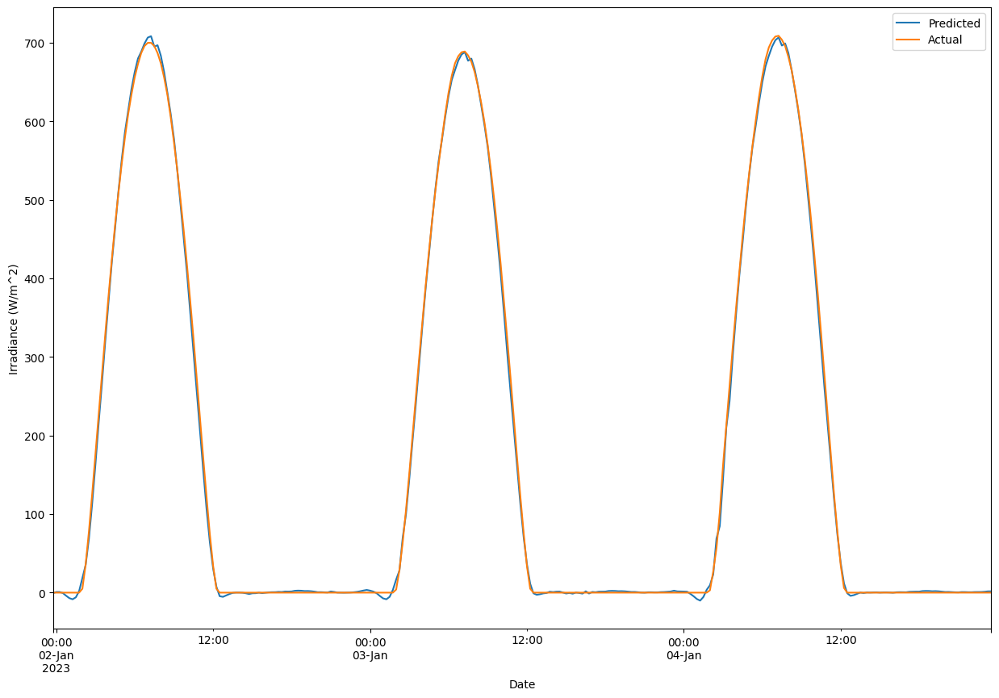

In [ ]:

df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_2.predict(X_test_dh))
print("r2_Score",r2_score(p3_2.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_dh_8,y_train_dh_8,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 8.5465e-04
Epoch 1: val_loss improved from inf to 0.00015, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9968832009995167
Root Mean Sqaured Error 15.550382
Mean Absolute Error 8.521601


Text(0, 0.5, 'Irradiance (W/m^2)')

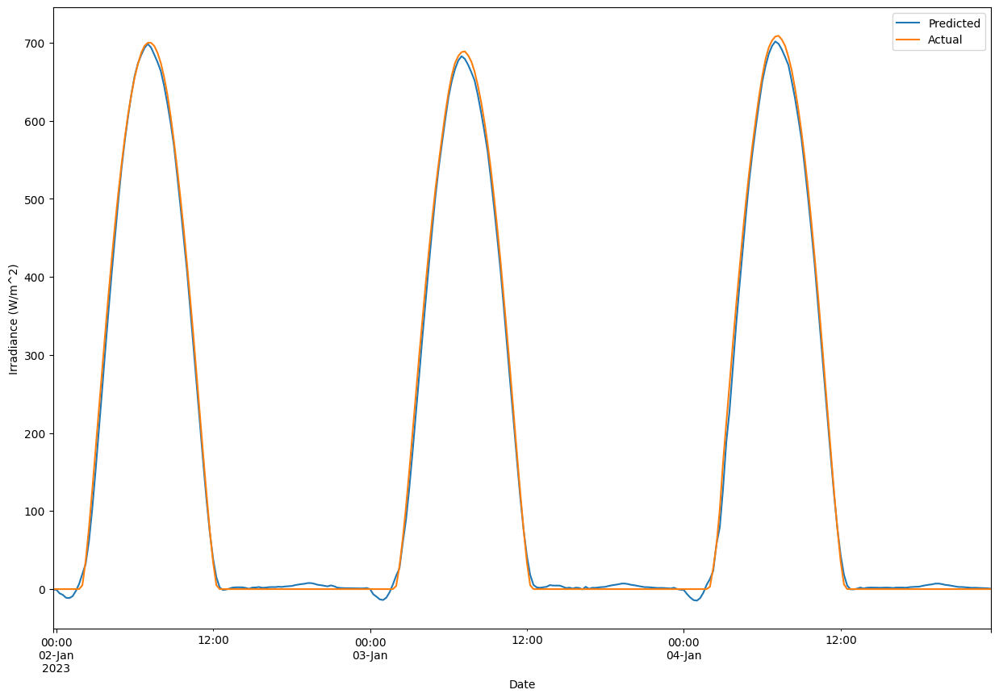

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_2.predict(X_test_dh))
print("r2_Score",r2_score(p3_2.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_dh_12,y_train_dh_12,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 7.3784e-04
Epoch 1: val_loss improved from inf to 0.00017, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9964956461914172
Root Mean Sqaured Error 17.06995
Mean Absolute Error 9.210819


Text(0, 0.5, 'Irradiance (W/m^2)')

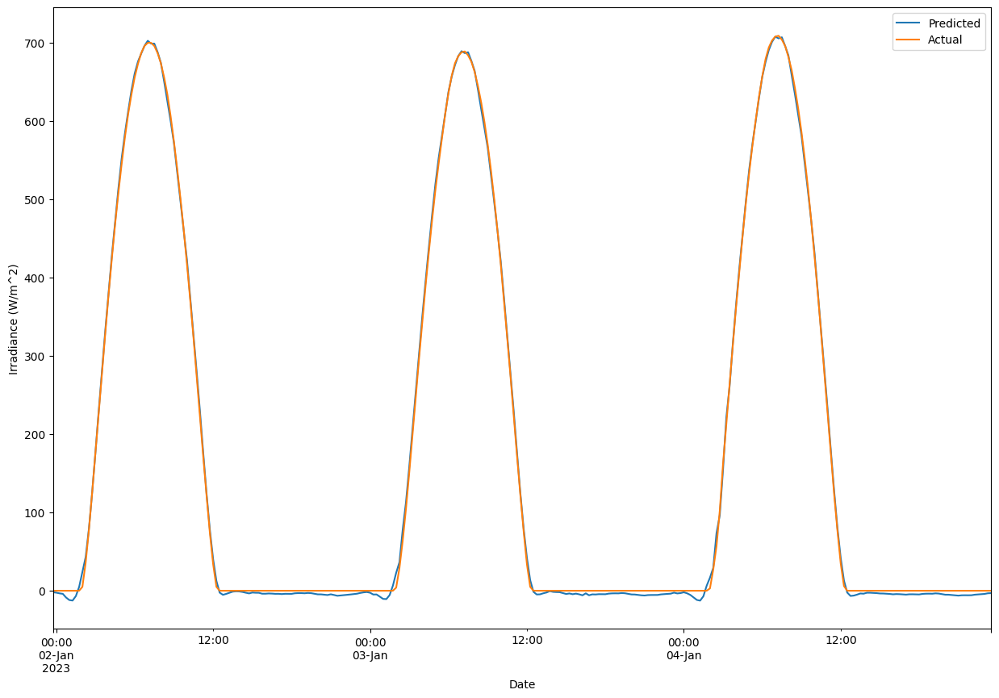

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_2.predict(X_test_dh))
print("r2_Score",r2_score(p3_2.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_dh_4,y_train_dh_4,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9910256784810123
Root Mean Sqaured Error 26.983477
Mean Absolute Error 20.724566


Text(0, 0.5, 'Irradiance (W/m^2)')

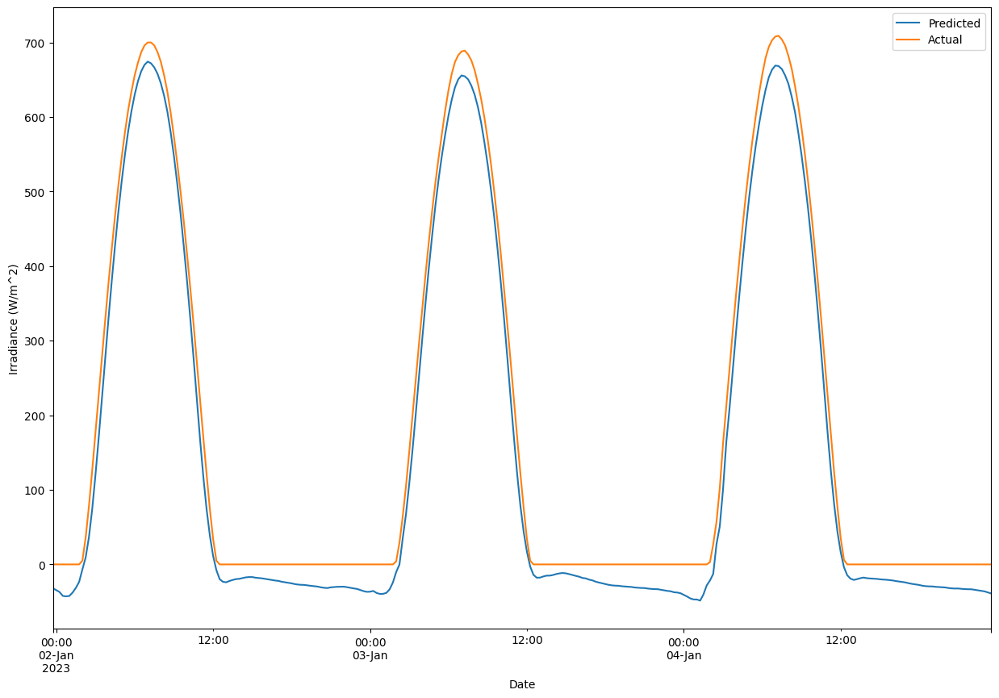

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_3.predict(X_test_dh))
print("r2_Score",r2_score(p3_3.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_dh_8,y_train_dh_8,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9949741189768057
Root Mean Sqaured Error 20.421799
Mean Absolute Error 14.513238


Text(0, 0.5, 'Irradiance (W/m^2)')

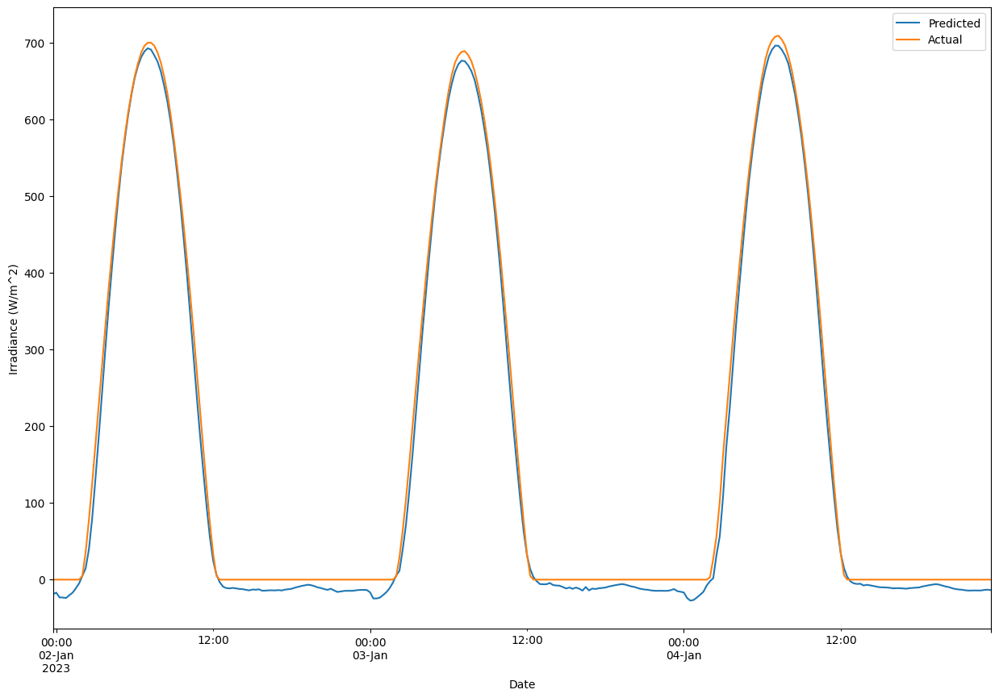

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_3.predict(X_test_dh))
print("r2_Score",r2_score(p3_3.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_dh_12,y_train_dh_12,X_test_dh,y_test_dh,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9973865775837539
Root Mean Sqaured Error 14.485409
Mean Absolute Error 7.160709


Text(0, 0.5, 'Irradiance (W/m^2)')

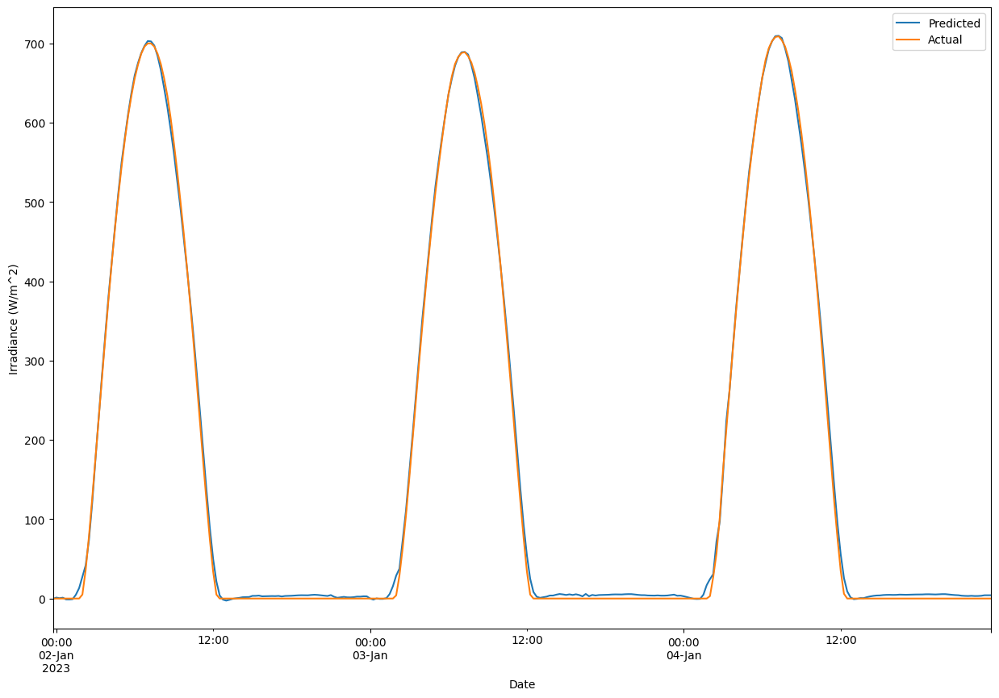

In [ ]:
df_test_date_dh['Actual']=scaler_y_dh.inverse_transform(y_test_dh)
df_test_date_dh['Predicted']=scaler_y_dh.inverse_transform(p3_3.predict(X_test_dh))
print("r2_Score",r2_score(p3_3.predict(X_test_dh),y_test_dh))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_dh['Actual'],df_test_date_dh['Predicted']))
df_test_date_dh.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Ch

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_ch_4, y_train_ch_4, X_test_ch, y_test_ch, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0454 - mae: 0.0981
Epoch 1: val_loss improved from inf to 0.00108, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
92/92 [==============================] - 28s 154ms/step - loss: 0.0454 - mae: 0.0981 - val_loss: 0.0011 - val_mae: 0.0270
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.0305
Epoch 2: val_loss improved from 0.00108 to 0.00093, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
92/92 [==============================] - 12s 129ms/step - loss: 0.0026 - mae: 0.0305 - val_loss: 9.2534e-04 - val_mae: 0.0259
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0020 - mae: 0.0259
Epoch 3: val_loss improved from 0.00093 to 0.00071, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
92/92 [=============================

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

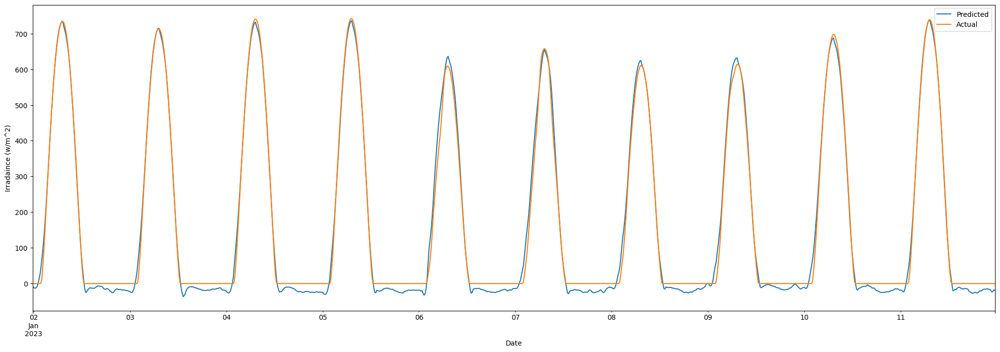

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(best_model.predict(X_test_ch))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9940237851297695
Root Mean Sqaured Error 23.357248
Mean Absolute Error 17.666452


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_ch_8, y_train_ch_8, X_test_ch, y_test_ch, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.0709
Epoch 1: val_loss improved from inf to 0.00073, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
165/165 [==============================] - 34s 156ms/step - loss: 0.0313 - mae: 0.0709 - val_loss: 7.3494e-04 - val_mae: 0.0198
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0019 - mae: 0.0249
Epoch 2: val_loss improved from 0.00073 to 0.00057, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
165/165 [==============================] - 23s 140ms/step - loss: 0.0019 - mae: 0.0249 - val_loss: 5.6843e-04 - val_mae: 0.0196
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0017 - mae: 0.0234
Epoch 3: val_loss improved from 0.00057 to 0.00029, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
165/165 [=============

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

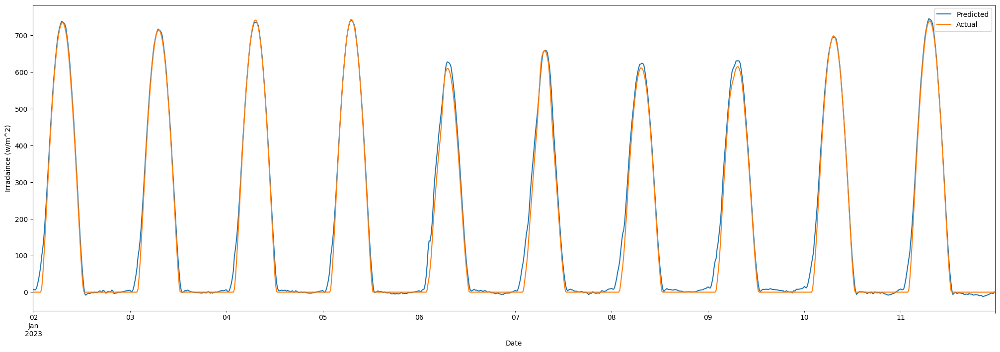

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(best_model.predict(X_test_ch))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9949219592091085
Root Mean Sqaured Error 20.79399
Mean Absolute Error 13.9521675


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_ch_12, y_train_ch_12, X_test_ch, y_test_ch, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.0598
Epoch 1: val_loss improved from inf to 0.00134, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
219/219 [==============================] - 41s 151ms/step - loss: 0.0234 - mae: 0.0598 - val_loss: 0.0013 - val_mae: 0.0290
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.0228
Epoch 2: val_loss improved from 0.00134 to 0.00112, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
219/219 [==============================] - 30s 137ms/step - loss: 0.0016 - mae: 0.0228 - val_loss: 0.0011 - val_mae: 0.0287
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0196
Epoch 3: val_loss improved from 0.00112 to 0.00080, saving model to /content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/Best_base.h5
219/219 [=====================

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

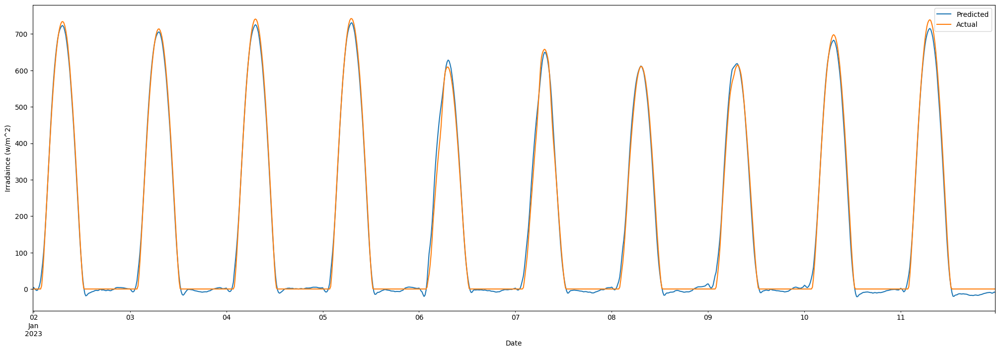

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(best_model.predict(X_test_ch))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.994986811269404
Root Mean Sqaured Error 20.645903
Mean Absolute Error 16.062017


## Persistance model

In [ ]:
ch

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,9.6,-106,41.9,8.9,58.3,1017.4,30,4.7,114,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,9.5,-107,41.9,9.1,58.2,1017.5,30,4.6,111,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,9.5,-108,40.9,9.2,58.2,1017.6,30,4.6,108,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,9.4,-109,37.8,9.3,58.2,1017.7,30,4.5,105,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,9.4,-110,34.2,9.4,58.1,1017.8,29,4.5,101,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,22.0,-80,19.7,18.1,52.1,1017.4,13,3.5,128,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,21.9,-82,19.7,18.1,52.4,1017.4,16,3.6,125,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,21.9,-84,20.2,18.1,52.5,1017.5,18,3.7,122,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,21.9,-86,19.3,18.0,52.6,1017.6,20,3.7,118,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# ch['PeriodStart'] = pd.to_datetime(df_ch['PeriodStart'])
df_per_ch =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_ch = ch[ch['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_ch

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_ch
# Apply the Persistence model
forecast = persistence_model(data)

In [ ]:
df_per_ch['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

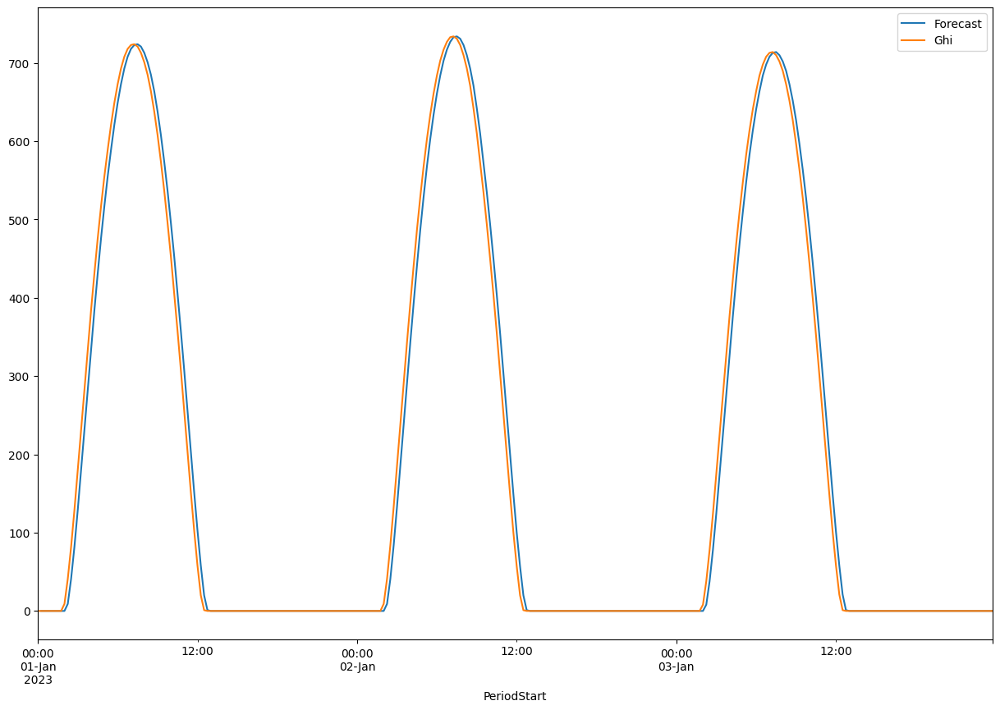

In [ ]:
df_per_ch.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_ch.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_ch['Forecast'],df_per_ch['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_ch['Forecast'],df_per_ch['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_ch['Forecast'],df_per_ch['Ghi']))

r2_Score 0.9914964705319789
Root Mean Sqaured Error 27.441987564111134
Mean Absolute Error 16.628181041844577


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_ch_4,y_train_ch_4,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 8.8300e-04
Epoch 1: val_loss improved from inf to 0.00012, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 9ms/step
r2_Score 0.998662579655931
Root Mean Sqaured Error 11.032863
Mean Absolute Error 7.3138833


Text(0, 0.5, 'Irradiance (W/m^2)')

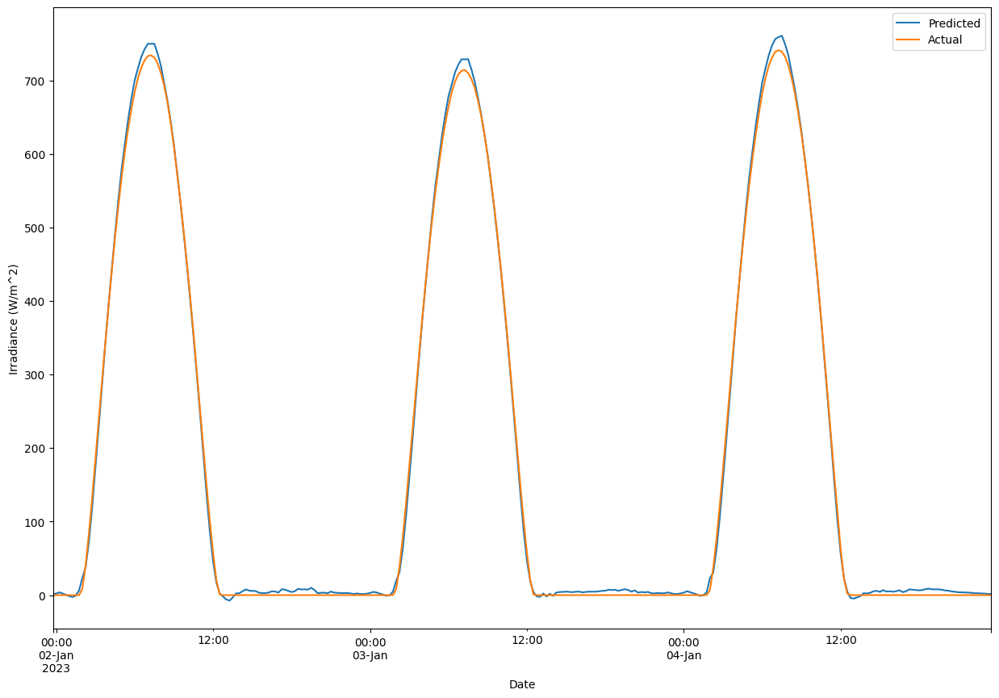

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_1.predict(X_test_ch))
print("r2_Score",r2_score(p3_1.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_ch_8,y_train_ch_8,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
163/165 [============================>.] - ETA: 0s - loss: 8.5952e-04
Epoch 1: val_loss improved from inf to 0.00009, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9978642546506811
Root Mean Sqaured Error 13.716397
Mean Absolute Error 11.388805


Text(0, 0.5, 'Irradiance (W/m^2)')

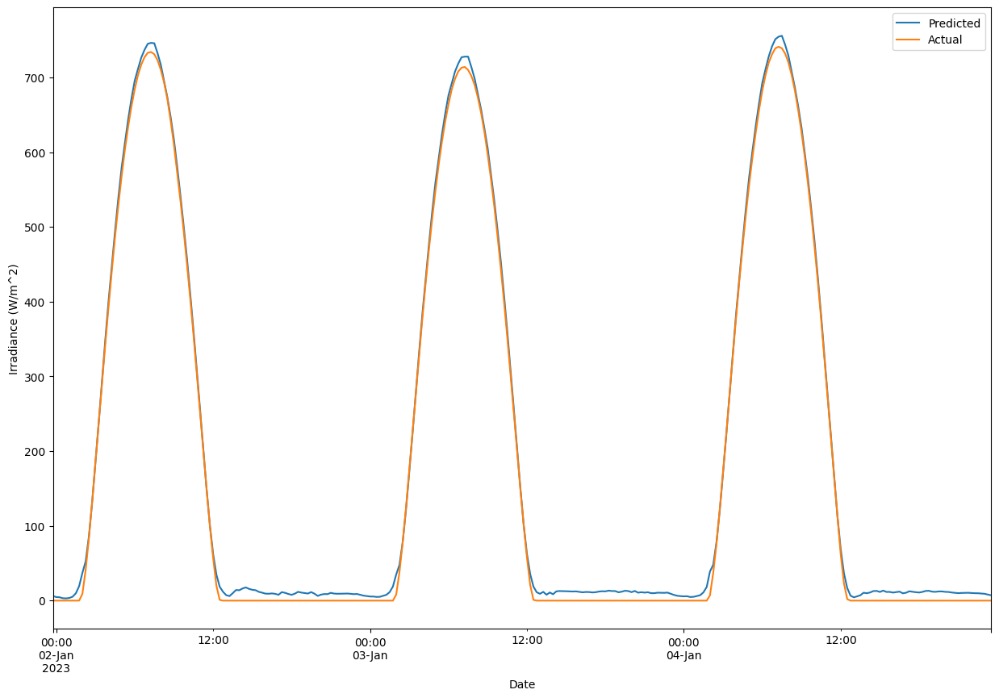

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_1.predict(X_test_ch))
print("r2_Score",r2_score(p3_1.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_ch_12,y_train_ch_12,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
217/219 [============================>.] - ETA: 0s - loss: 7.0925e-04
Epoch 1: val_loss improved from inf to 0.00010, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9989117540178689
Root Mean Sqaured Error 9.814494
Mean Absolute Error 6.136028


Text(0, 0.5, 'Irradiance (W/m^2)')

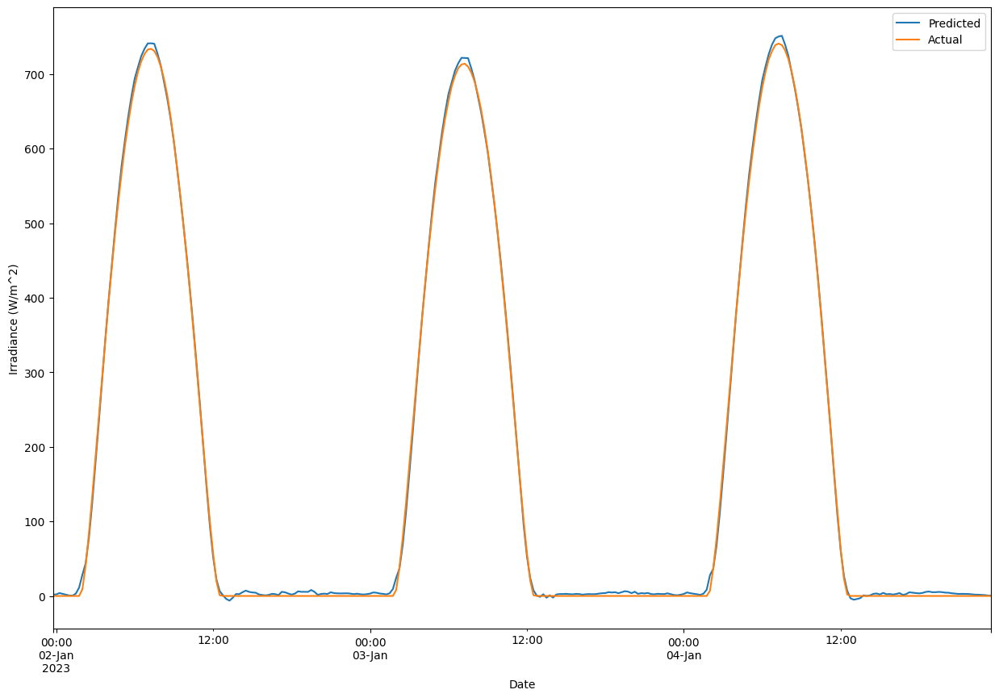

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_1.predict(X_test_ch))
print("r2_Score",r2_score(p3_1.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_ch_4,y_train_ch_4,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 0.0012
Epoch 1: val_loss improved from inf to 0.00009, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9986651462001299
Root Mean Sqaured Error 10.690474
Mean Absolute Error 7.1966443


Text(0, 0.5, 'Irradiance (W/m^2)')

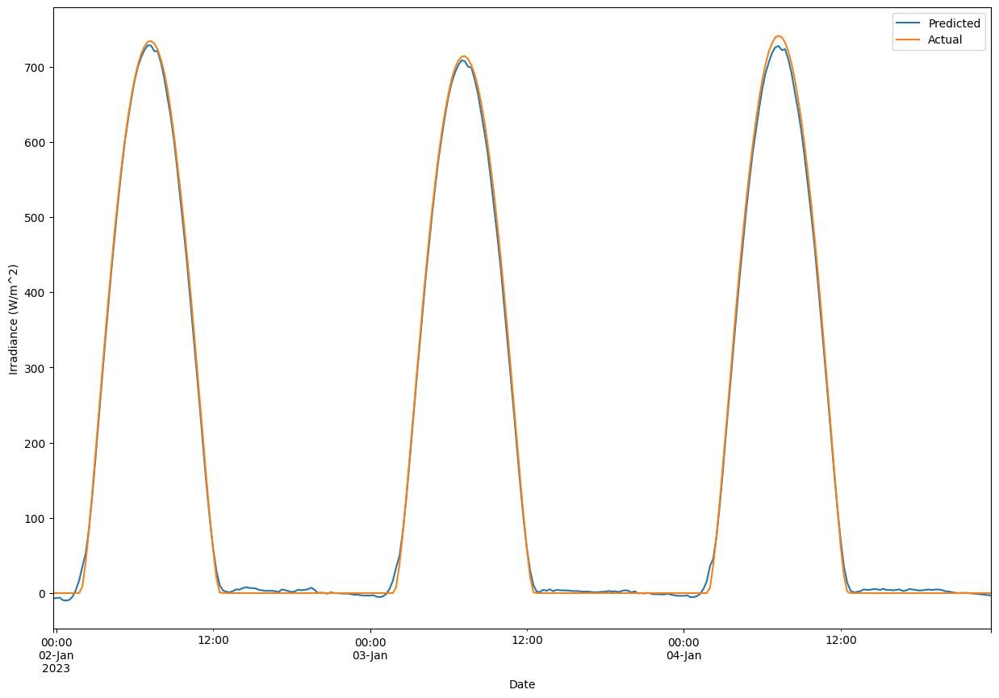

In [ ]:

df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_2.predict(X_test_ch))
print("r2_Score",r2_score(p3_2.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_ch_8,y_train_ch_8,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 0.0011
Epoch 1: val_loss improved from inf to 0.00016, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9980056871332298
Root Mean Sqaured Error 12.974442
Mean Absolute Error 8.333238


Text(0, 0.5, 'Irradiance (W/m^2)')

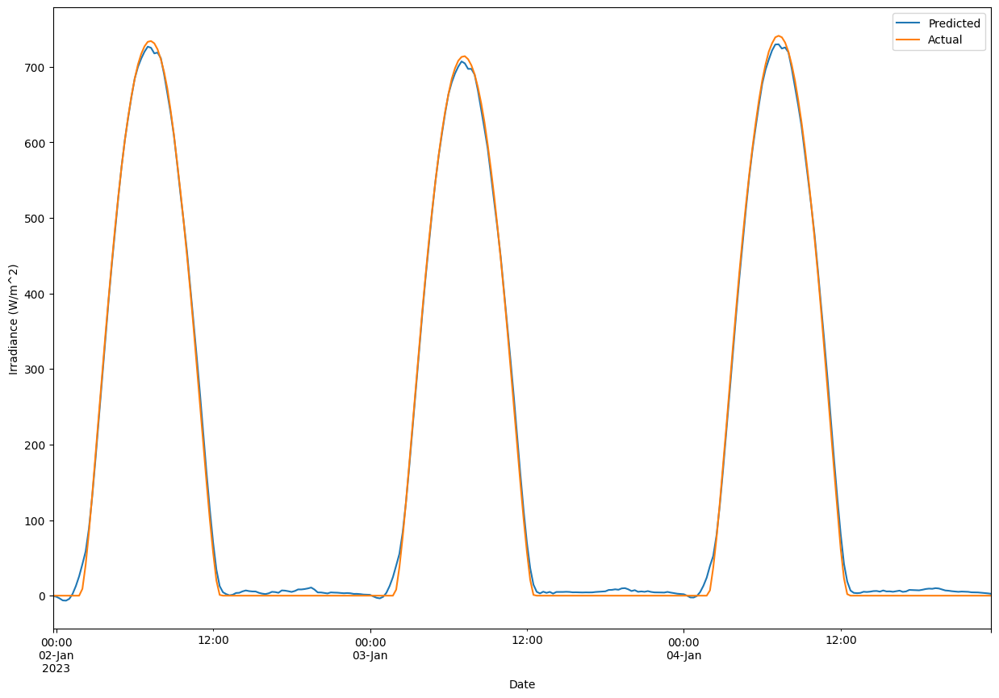

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_2.predict(X_test_ch))
print("r2_Score",r2_score(p3_2.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_ch_12,y_train_ch_12,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 8.1922e-04
Epoch 1: val_loss improved from inf to 0.00009, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9989706722959152
Root Mean Sqaured Error 9.613461
Mean Absolute Error 6.4610915


Text(0, 0.5, 'Irradiance (W/m^2)')

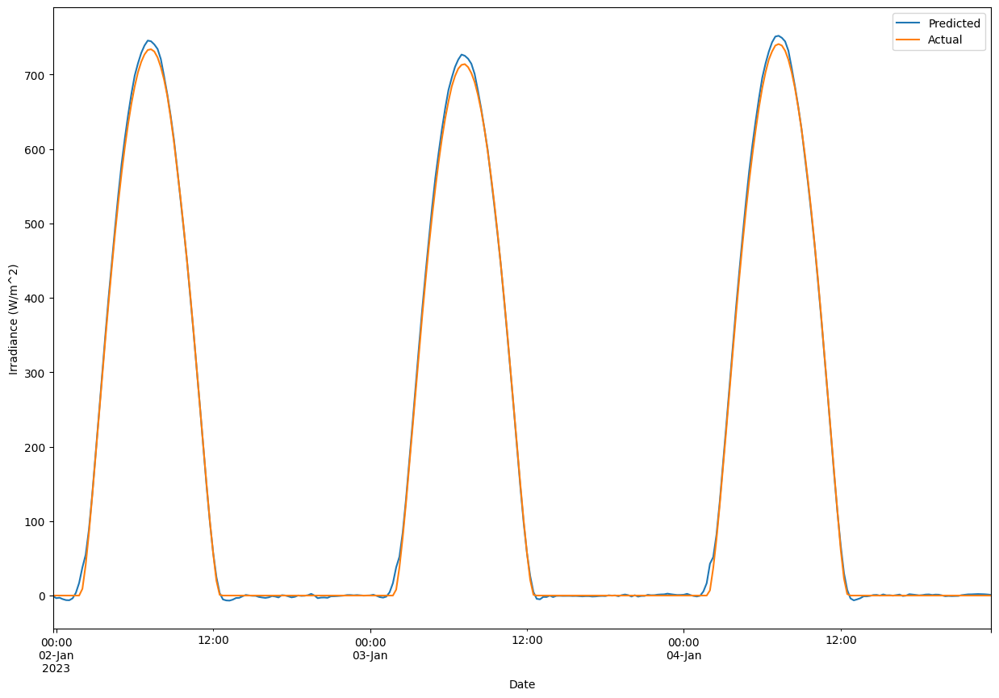

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_2.predict(X_test_ch))
print("r2_Score",r2_score(p3_2.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_ch_4,y_train_ch_4,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9883272602977226
Root Mean Sqaured Error 31.426355
Mean Absolute Error 27.838184


Text(0, 0.5, 'Irradiance (W/m^2)')

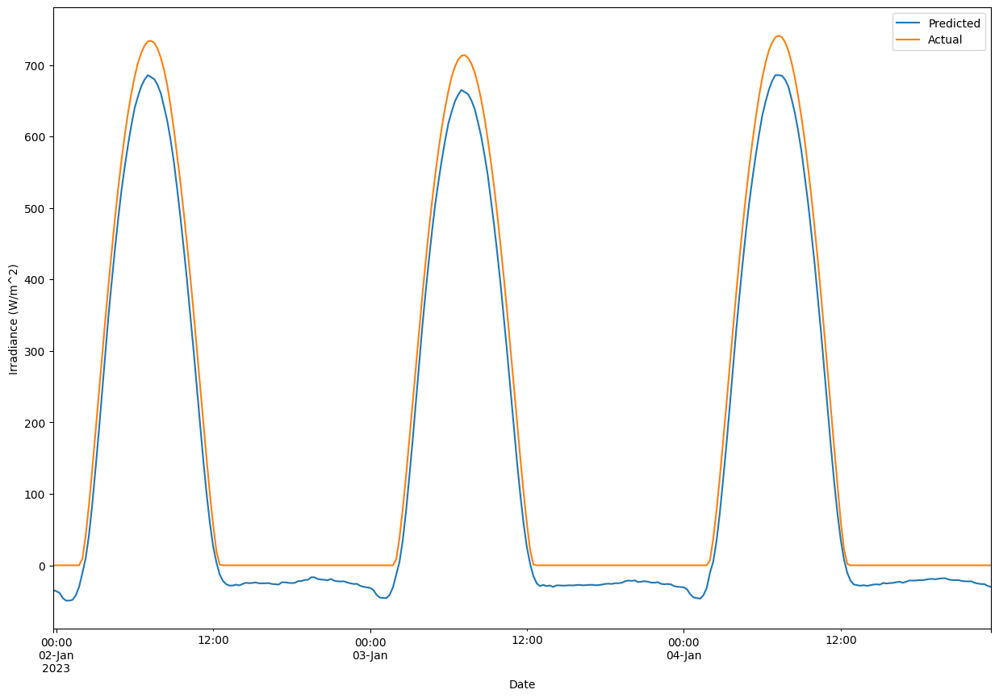

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_3.predict(X_test_ch))
print("r2_Score",r2_score(p3_3.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_ch_8,y_train_ch_8,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9957044790345116
Root Mean Sqaured Error 19.567242
Mean Absolute Error 14.284031


Text(0, 0.5, 'Irradiance (W/m^2)')

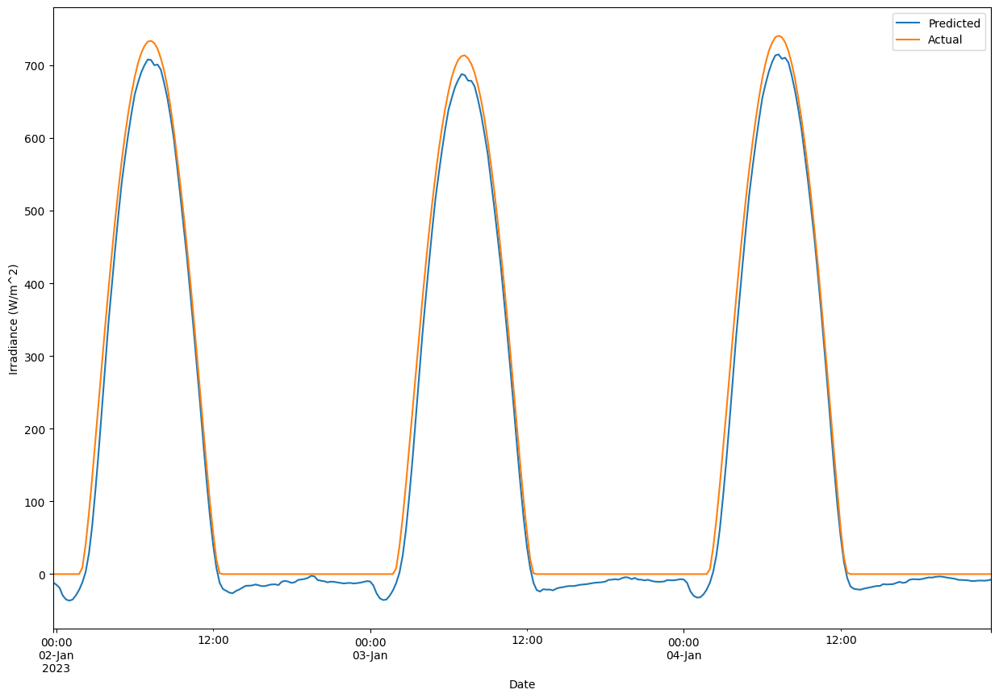

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_3.predict(X_test_ch))
print("r2_Score",r2_score(p3_3.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_ch_12,y_train_ch_12,X_test_ch,y_test_ch,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9988252771722119
Root Mean Sqaured Error 10.110316
Mean Absolute Error 6.445999


Text(0, 0.5, 'Irradiance (W/m^2)')

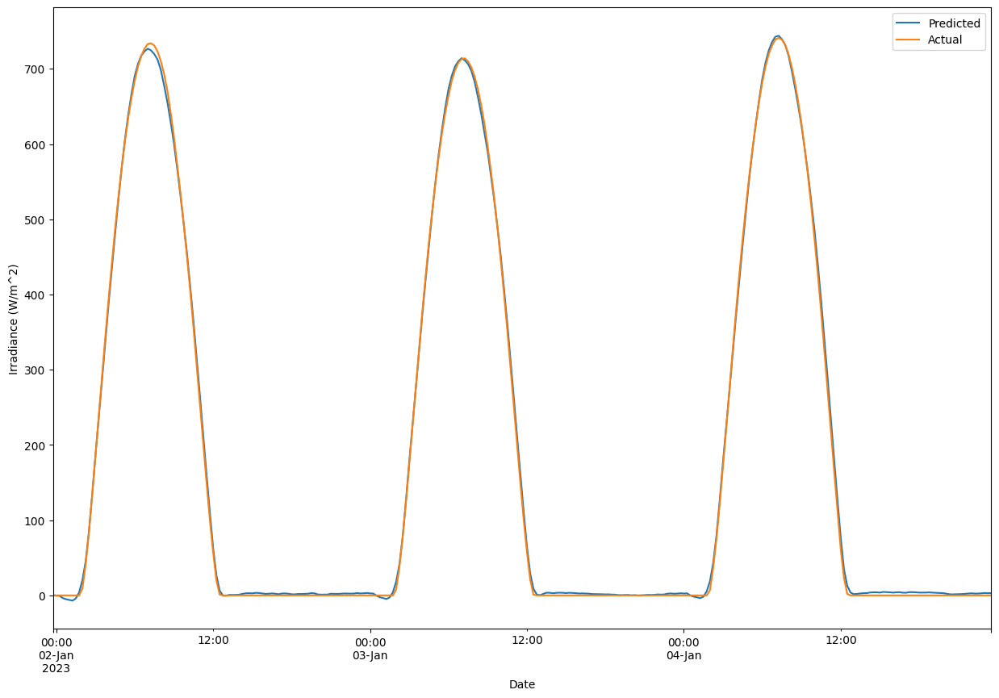

In [ ]:
df_test_date_ch['Actual']=scaler_y_ch.inverse_transform(y_test_ch)
df_test_date_ch['Predicted']=scaler_y_ch.inverse_transform(p3_3.predict(X_test_ch))
print("r2_Score",r2_score(p3_3.predict(X_test_ch),y_test_ch))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_ch['Actual'],df_test_date_ch['Predicted']))
df_test_date_ch.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Models Validation

In [ ]:
ch_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/Ch.csv',skiprows=[0,1])
bh_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/bh.csv',skiprows=[0,1])
dh_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/dh.csv',skiprows=[0,1])

In [ ]:
def combine_date(year, month, day, hour, minute):
    return datetime(year, month, day, hour, minute)


In [ ]:
ch_val_ns['Date'] = ch_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
bh_val_ns['Date'] = bh_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
dh_val_ns['Date'] = dh_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)

In [ ]:
cols = ch_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
ch_val_ns = ch_val_ns[cols]
ch_val_ns = ch_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = bh_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
bh_val_ns = bh_val_ns[cols]
bh_val_ns = bh_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = dh_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
dh_val_ns = dh_val_ns[cols]
dh_val_ns = dh_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start = "2018-12-31T00:00:00Z"
        train_end = "2019-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train = self.df[(self.df['PeriodStart'] >= train_start) & (self.df['PeriodStart'] <= train_end)]

        self.x, self.y = self.split_sequences(self.train.values)

        self.x, self.y = self.unique_shapes(self.x, self.y, self.lag, self.n_features, self.num_of_outputs, self.only_production)


        return (self.x[:, :, 1:],self.y)

In [ ]:
sd3=SplitData(ch_val,n_timesteps,n_outputs,only_production=False)
ch_val_x,ch_val_y=sd3.preprocess_data()

df_ch_val=ch_val.copy()

df_date_ch_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_ch_val['PeriodStart'] = pd.to_datetime(df_ch_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_ch_val['Date'] = df_ch_val[(df_ch_val['PeriodStart'] >= train_start) & (df_ch_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_ch_val=df_date_ch_val.iloc[-len(ch_val_x):]

<ipython-input-26-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
sd3=SplitData(bh_val,n_timesteps,n_outputs,only_production=False)
bh_val_x,bh_val_y=sd3.preprocess_data()

df_bh_val=bh_val.copy()

df_date_bh_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_bh_val['PeriodStart'] = pd.to_datetime(df_bh_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_bh_val['Date'] = df_bh_val[(df_bh_val['PeriodStart'] >= train_start) & (df_bh_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_bh_val=df_date_bh_val.iloc[-len(bh_val_x):]

<ipython-input-26-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
sd3=SplitData(dh_val,n_timesteps,n_outputs,only_production=False)
dh_val_x,dh_val_y=sd3.preprocess_data()

df_dh_val=dh_val.copy()

df_date_dh_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_dh_val['PeriodStart'] = pd.to_datetime(df_dh_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_dh_val['Date'] = df_dh_val[(df_dh_val['PeriodStart'] >= train_start) & (df_dh_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_dh_val=df_date_dh_val.iloc[-len(dh_val_x):]

<ipython-input-26-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
ch_val_x = ch_val_x.astype('float32')
ch_val_y = ch_val_y.astype('float32')


bh_val_x = bh_val_x.astype('float32')
bh_val_y = bh_val_y.astype('float32')


dh_val_x = dh_val_x.astype('float32')
dh_val_y = dh_val_y.astype('float32')


In [ ]:
# Flatten X_train and X_test to 2 dimensions
ch_val_x_flat = ch_val_x.reshape(ch_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
ch_val_x_scaled= scaler.fit_transform(ch_val_x_flat)


# Reshape back to original shape
ch_val_x= ch_val_x_scaled.reshape(ch_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
ch_val_y = scaler_y.fit_transform(ch_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
bh_val_x_flat = bh_val_x.reshape(bh_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
bh_val_x_scaled= scaler.fit_transform(bh_val_x_flat)


# Reshape back to original shape
bh_val_x= bh_val_x_scaled.reshape(bh_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
bh_val_y = scaler_y.fit_transform(bh_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
dh_val_x_flat = dh_val_x.reshape(dh_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
dh_val_x_scaled= scaler.fit_transform(dh_val_x_flat)


# Reshape back to original shape
dh_val_x= dh_val_x_scaled.reshape(dh_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
dh_val_y = scaler_y.fit_transform(dh_val_y)



# Ch

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_4.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9937350843017334
Root Mean Sqaured Error 23.243225
Mean Absolute Error 13.226578


Text(0, 0.5, 'Irradiance (W/m^2)')

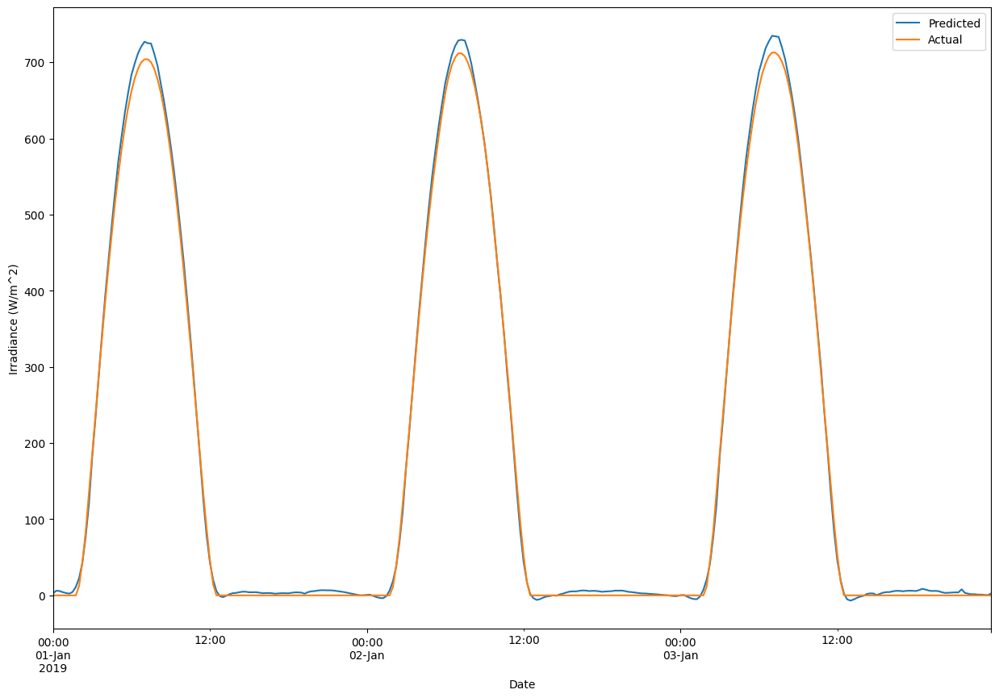

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(ch_val_x))
print("r2_Score",r2_score(s1_4.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

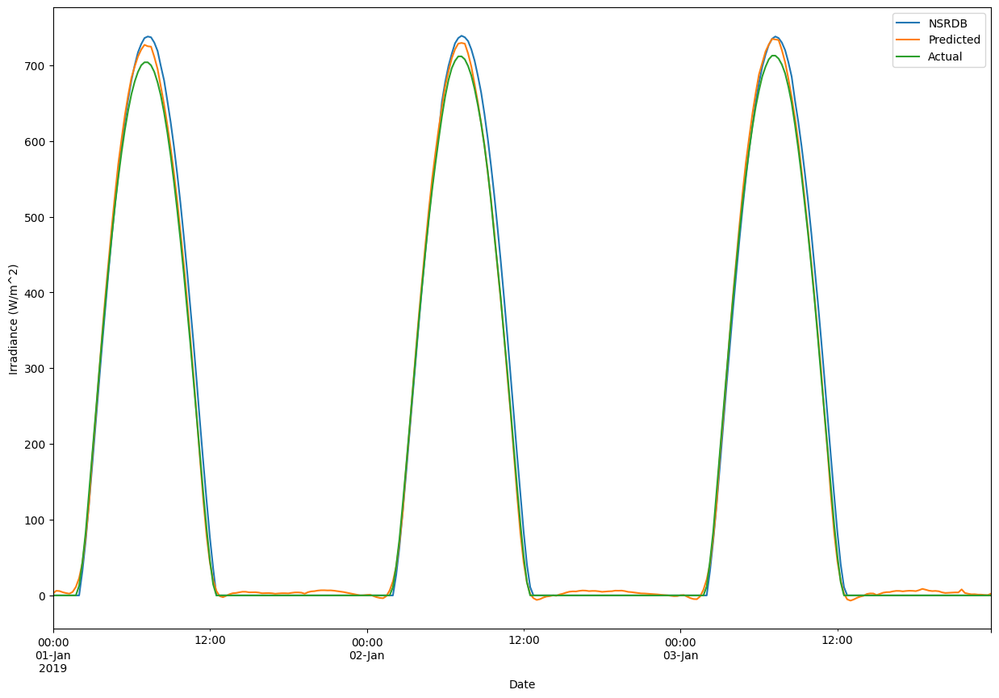

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9942800871175705
Root Mean Sqaured Error 23.24322493259475
Mean Absolute Error 13.226578259870449


Text(0, 0.5, 'Irradiance (W/m^2)')

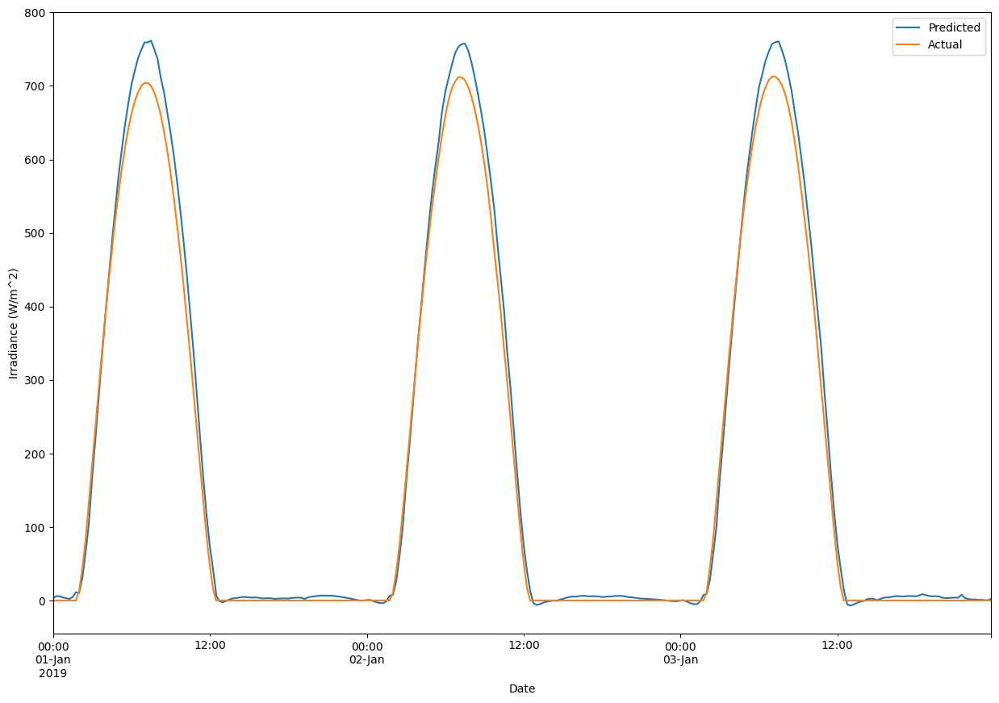

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

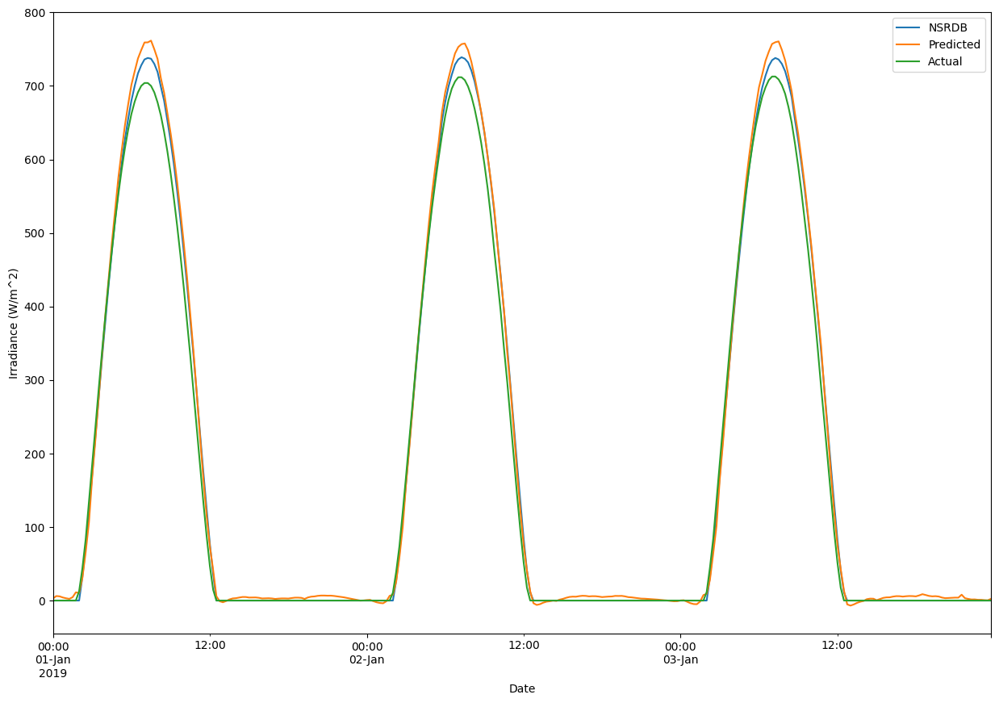

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_8.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9943942493062037
Root Mean Sqaured Error 21.698753
Mean Absolute Error 11.681662


Text(0, 0.5, 'Irradiance (W/m^2)')

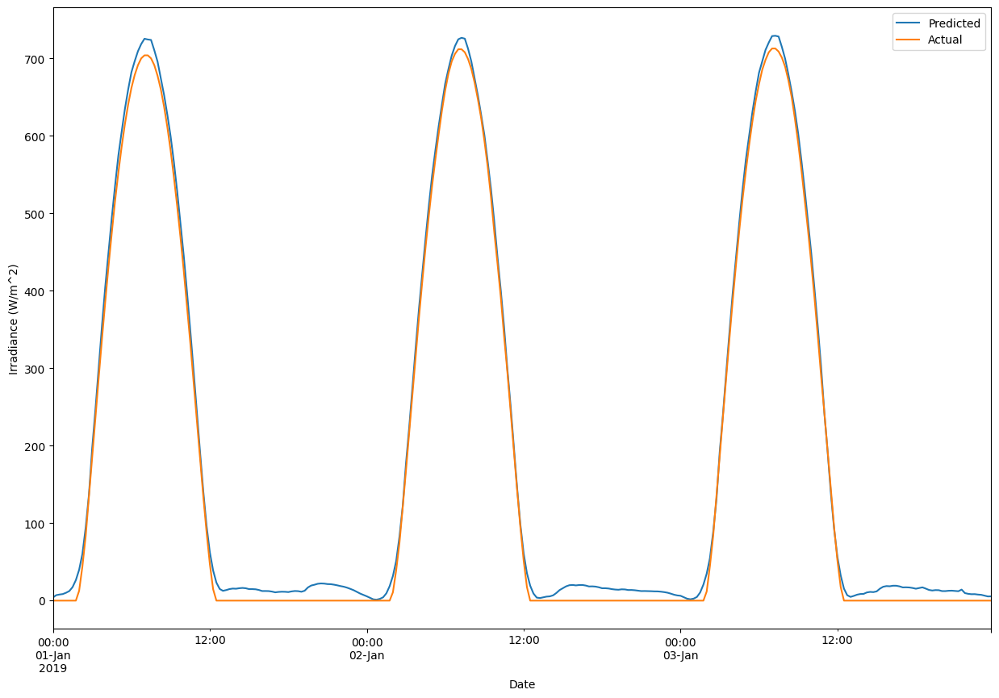

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(ch_val_x))
print("r2_Score",r2_score(s1_4.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

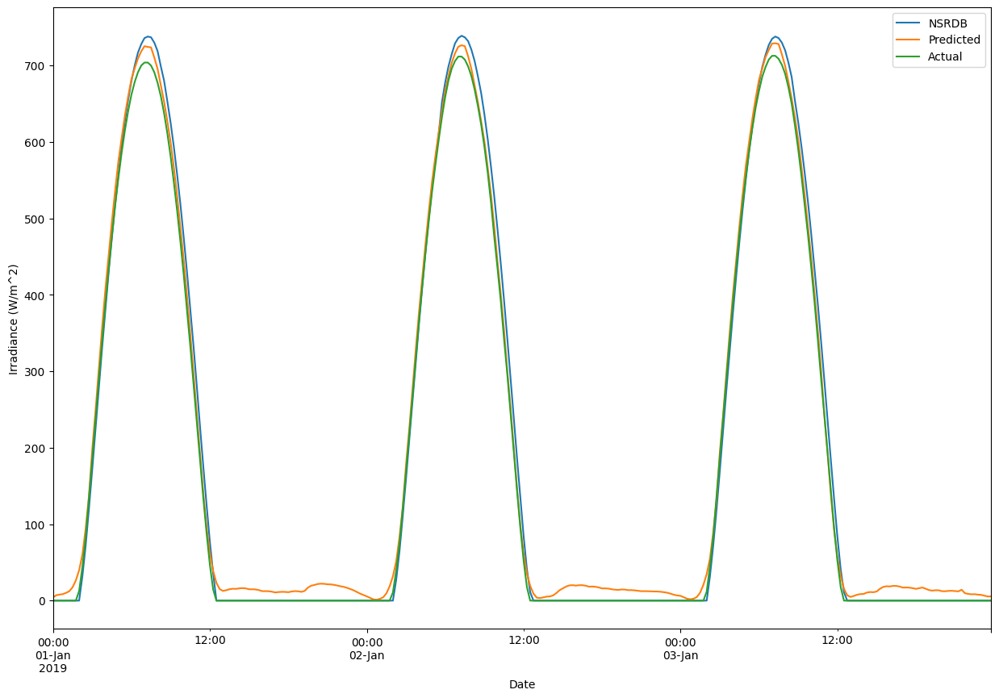

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9950149880543147
Root Mean Sqaured Error 21.69875316848558
Mean Absolute Error 11.681662440262883


Text(0, 0.5, 'Irradiance (W/m^2)')

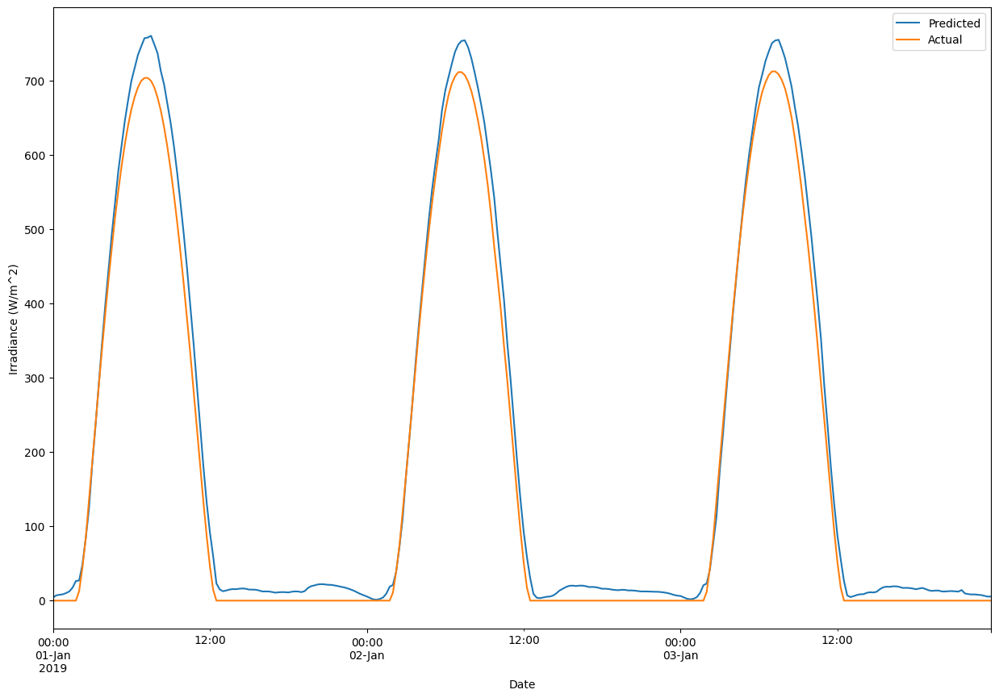

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

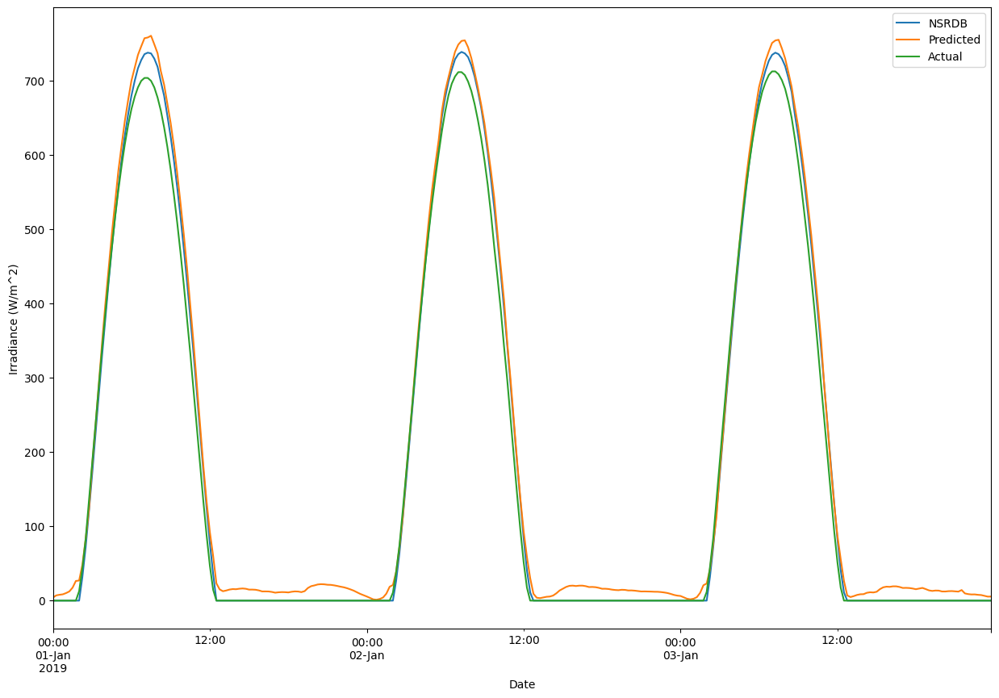

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S1_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9944690496423585
Root Mean Sqaured Error 21.455677
Mean Absolute Error 11.588777


Text(0, 0.5, 'Irradiance (W/m^2)')

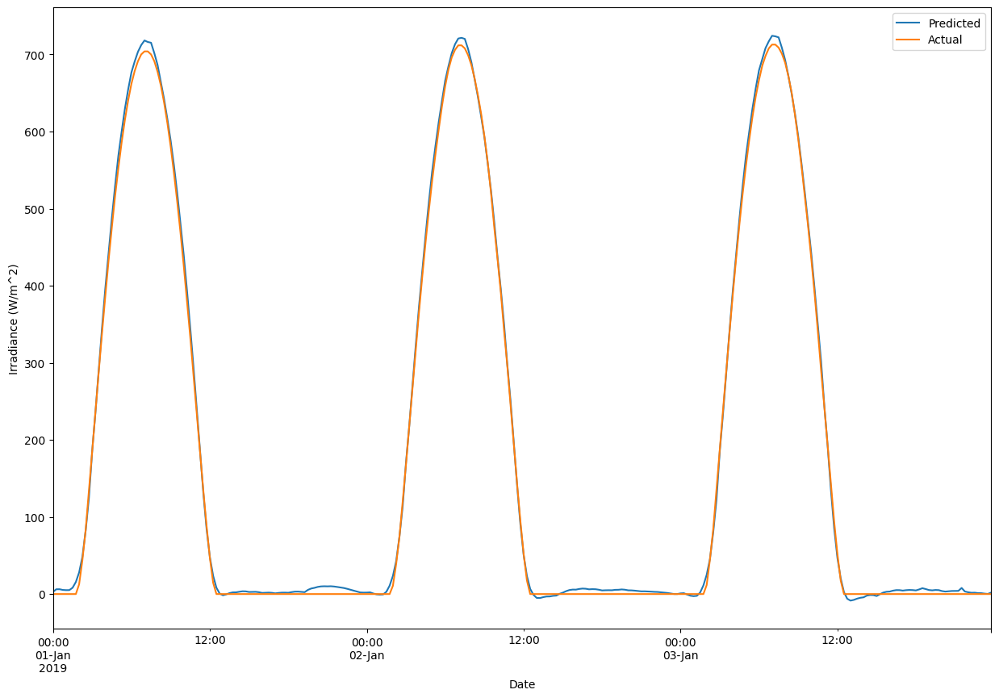

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(ch_val_x))
print("r2_Score",r2_score(s1_12.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

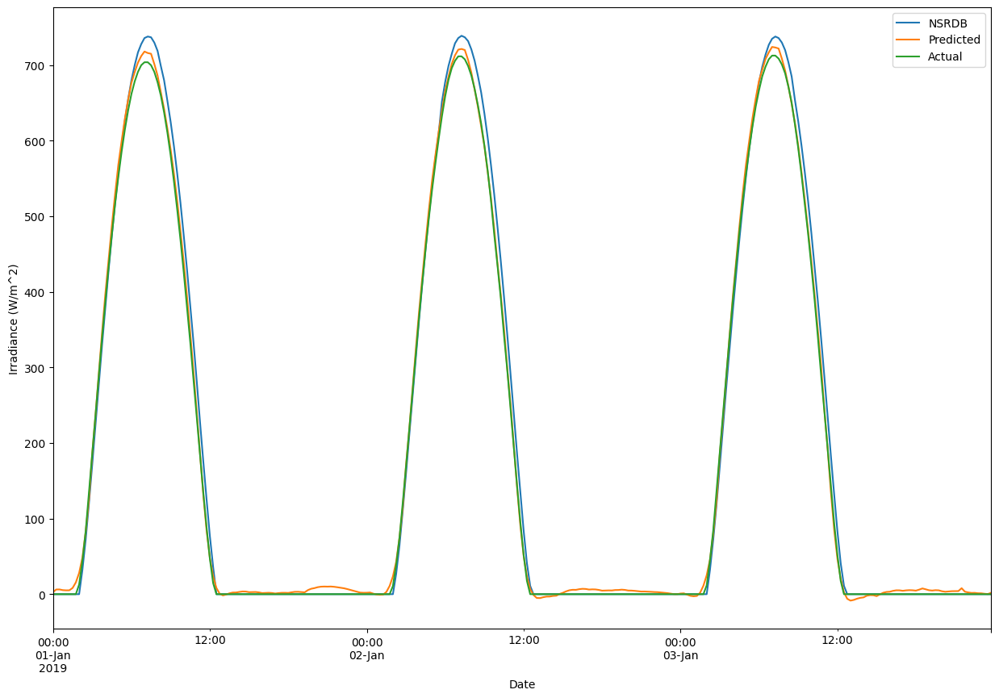

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9951260495419846
Root Mean Sqaured Error 21.455677521282738
Mean Absolute Error 11.588776610071577


Text(0, 0.5, 'Irradiance (W/m^2)')

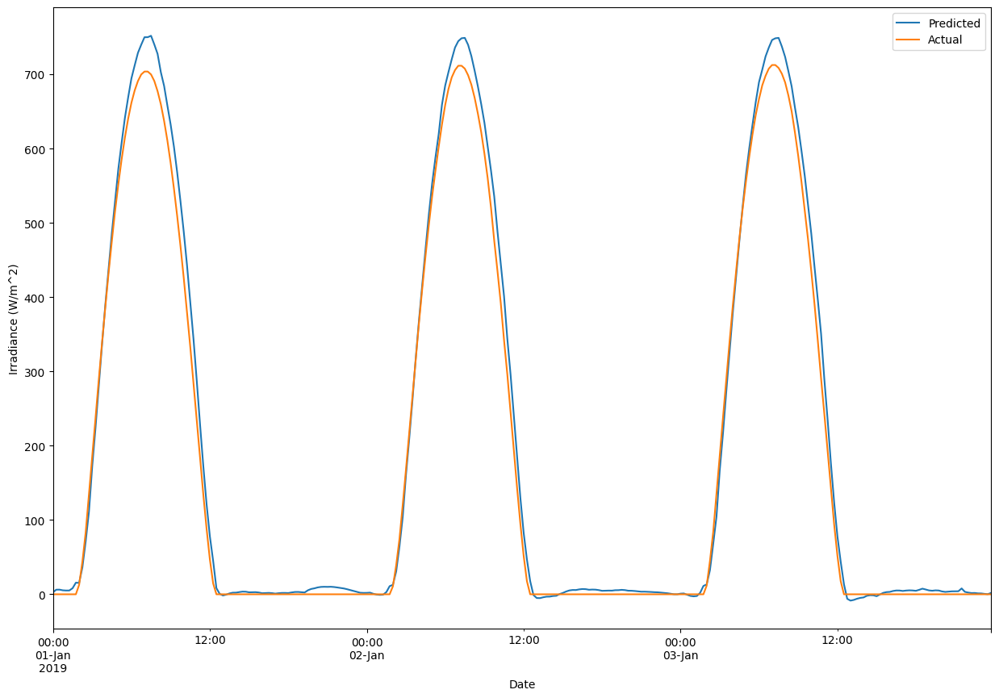

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

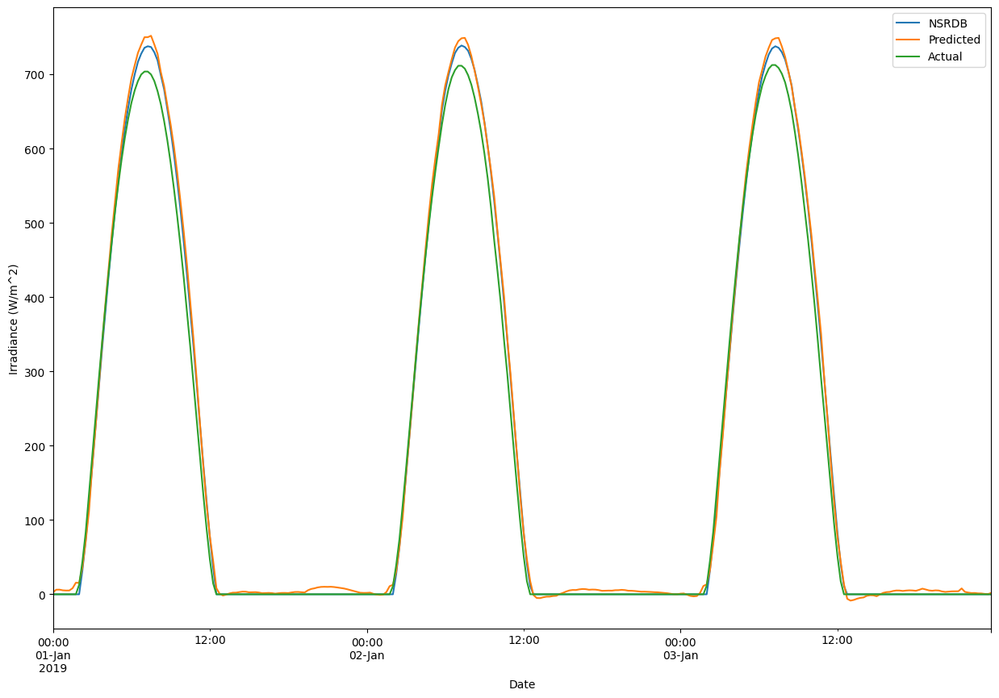

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_4.h5.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9946370732128653
Root Mean Sqaured Error 21.32091
Mean Absolute Error 10.747061


Text(0, 0.5, 'Irradiance (W/m^2)')

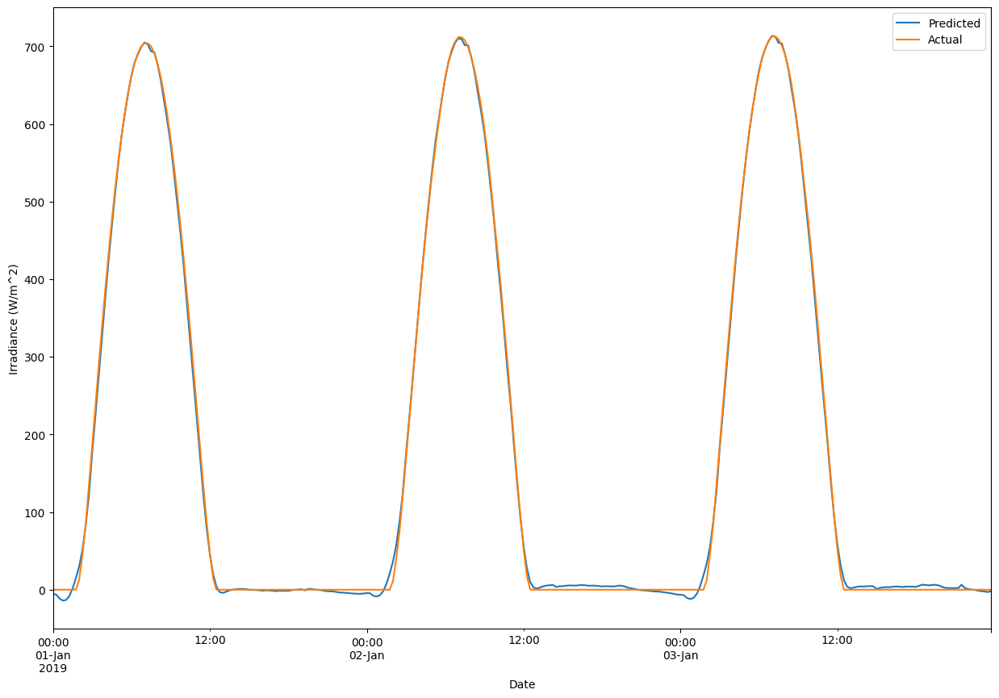

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(ch_val_x))
print("r2_Score",r2_score(s2_4.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

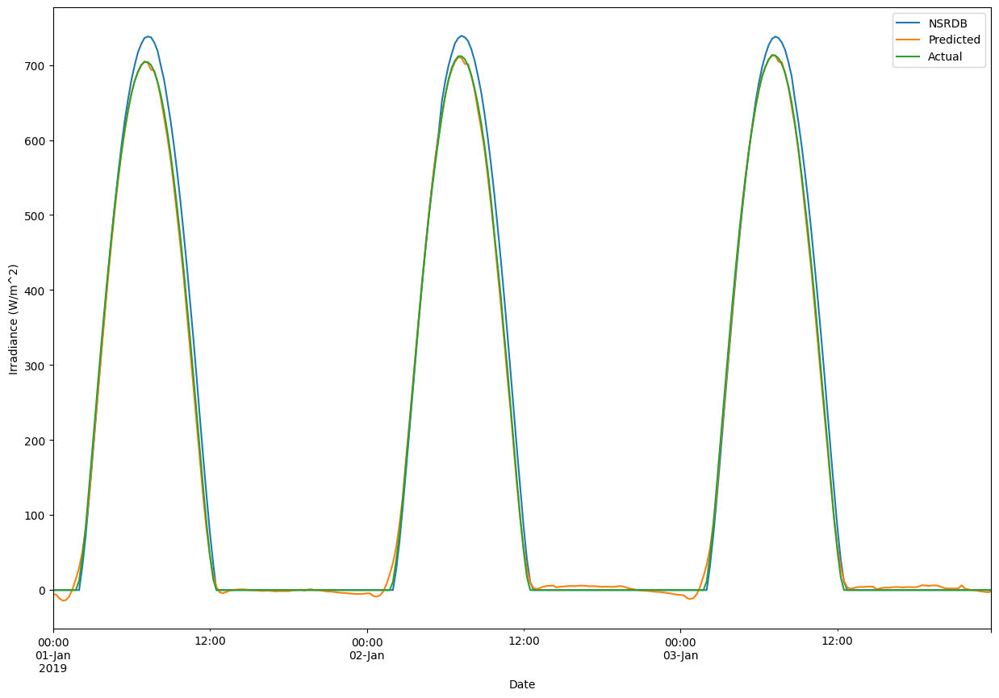

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9951870854329455
Root Mean Sqaured Error 21.320910850571078
Mean Absolute Error 10.747060099140247


Text(0, 0.5, 'Irradiance (W/m^2)')

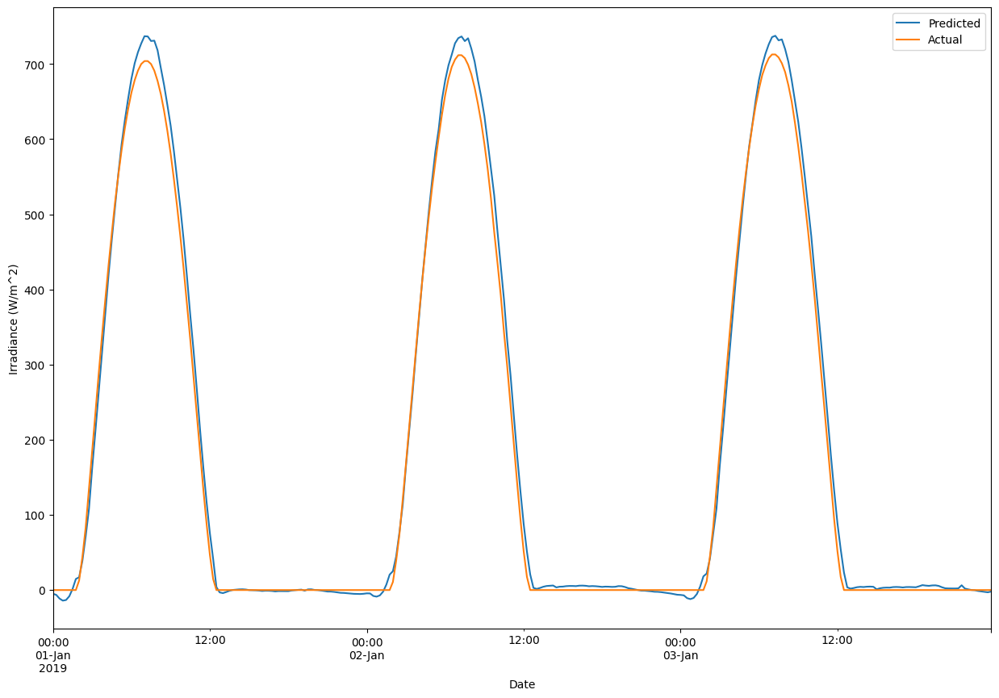

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

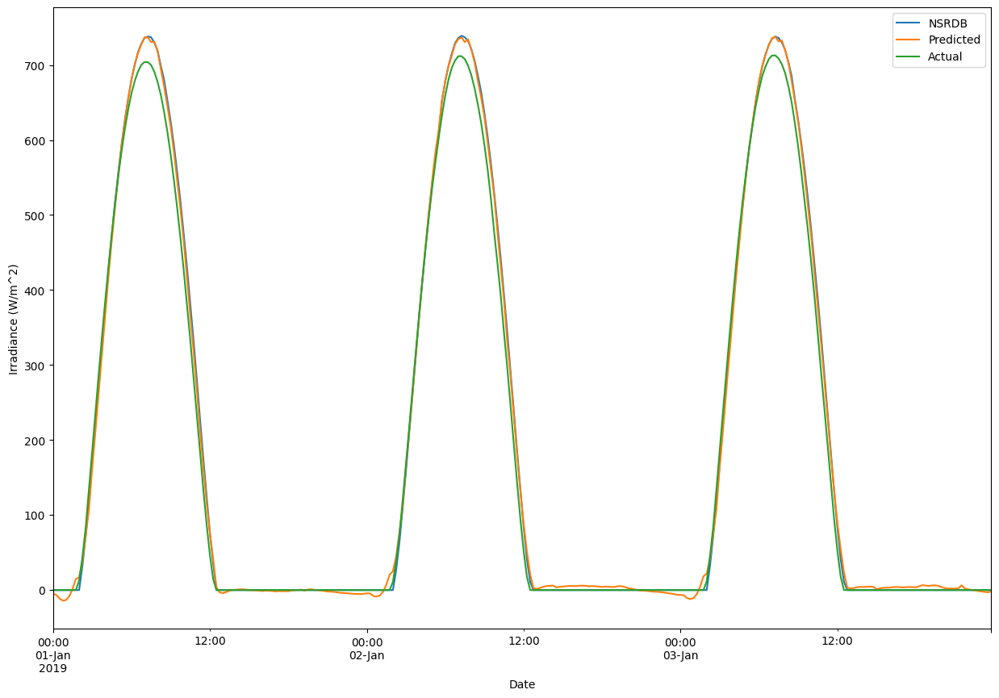

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9945911214432122
Root Mean Sqaured Error 21.231089
Mean Absolute Error 10.299132


Text(0, 0.5, 'Irradiance (W/m^2)')

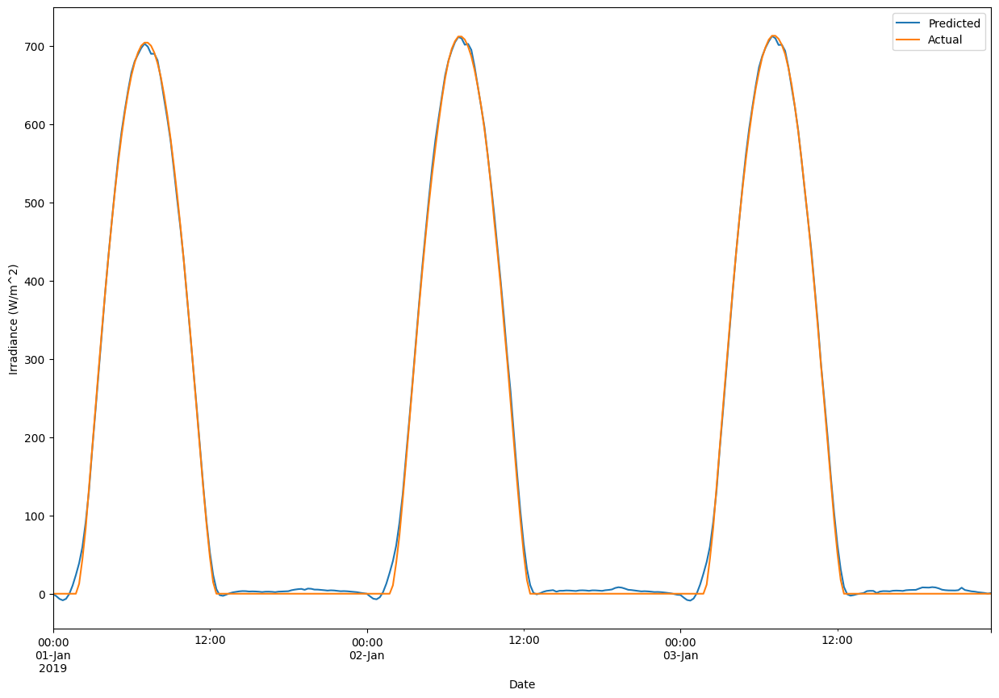

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(ch_val_x))
print("r2_Score",r2_score(s2_8.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

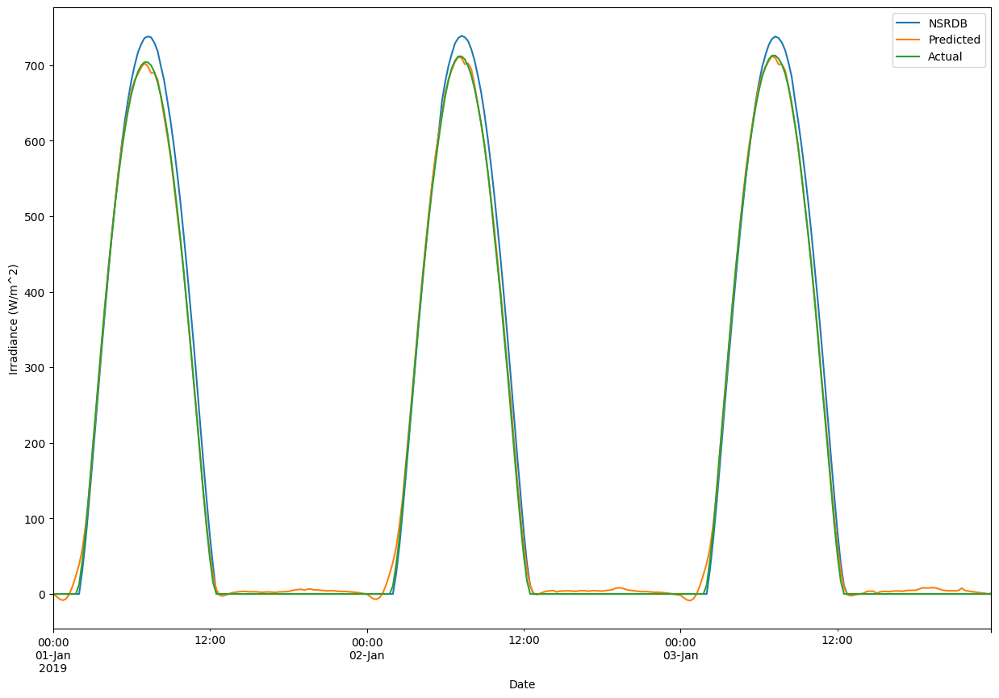

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9952275521775985
Root Mean Sqaured Error 21.231089072427594
Mean Absolute Error 10.299131892920848


Text(0, 0.5, 'Irradiance (W/m^2)')

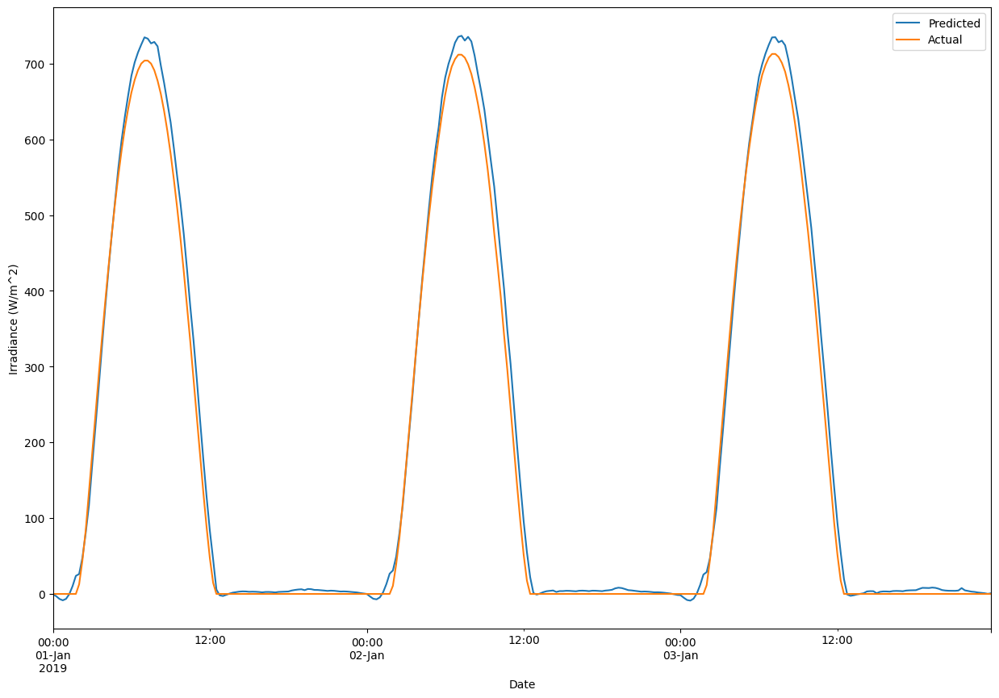

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

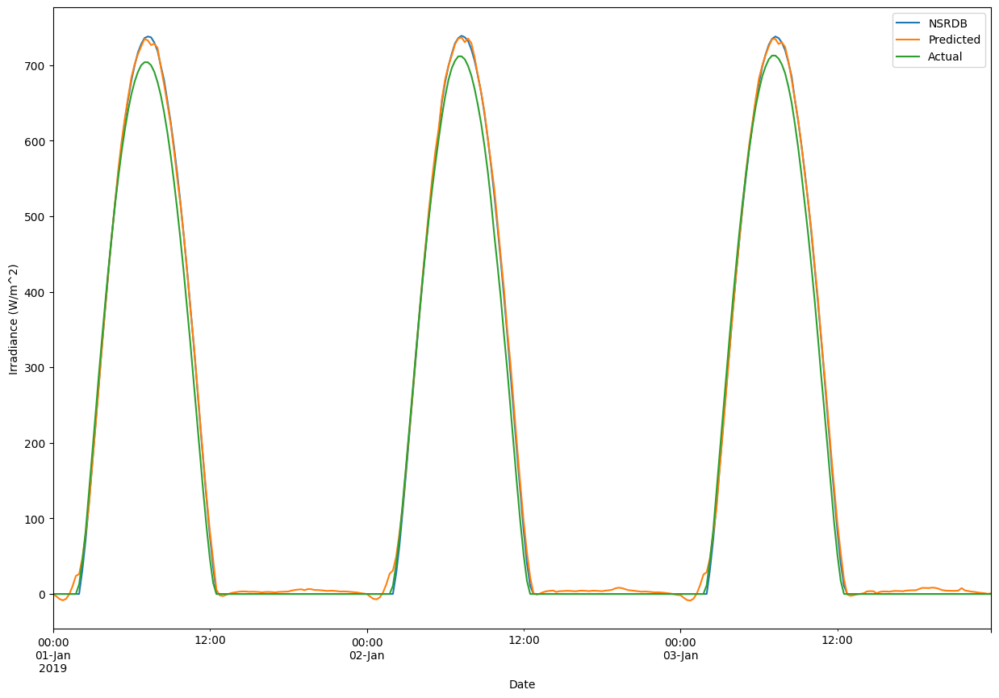

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s2_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S2_12.h5.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9940724160108118
Root Mean Sqaured Error 22.494528
Mean Absolute Error 12.061979


Text(0, 0.5, 'Irradiance (W/m^2)')

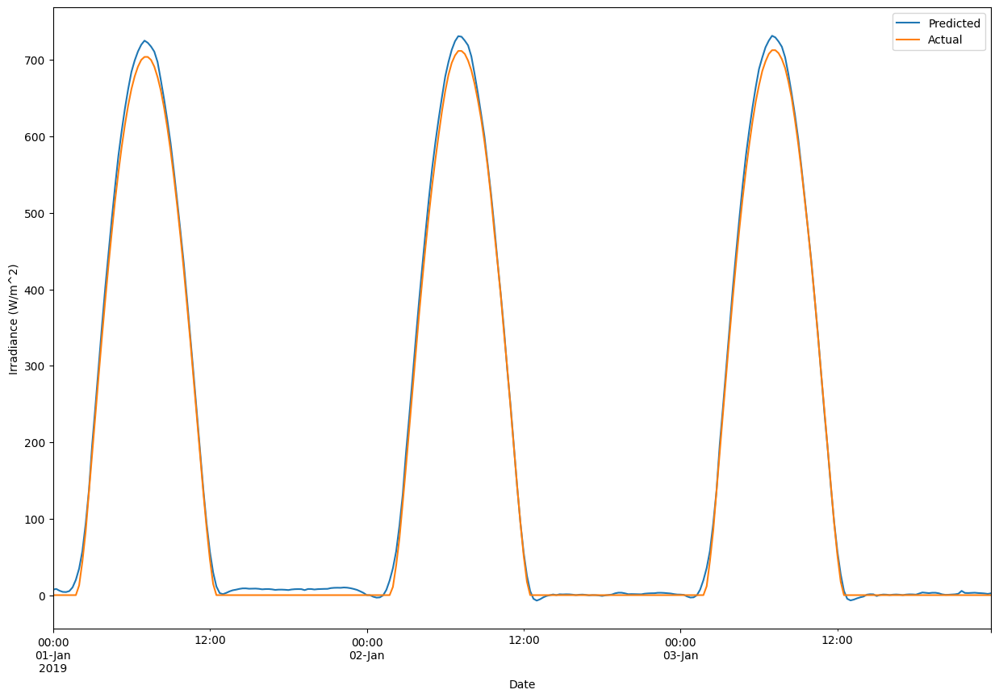

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(ch_val_x))
print("r2_Score",r2_score(s2_12.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

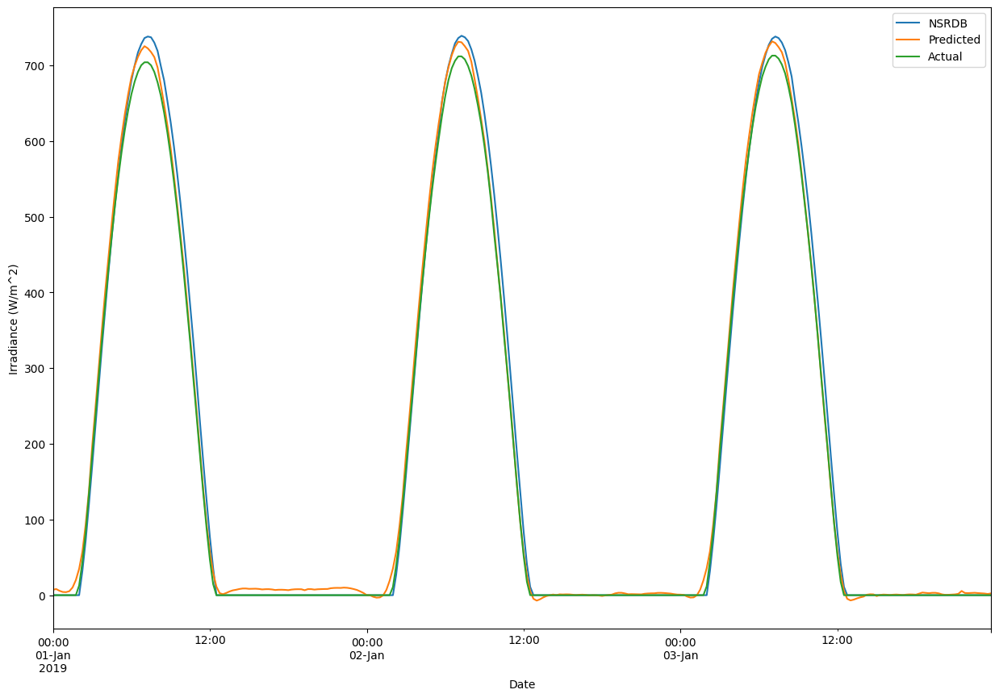

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9946426446489388
Root Mean Sqaured Error 22.494529035966387
Mean Absolute Error 12.061979547498415


Text(0, 0.5, 'Irradiance (W/m^2)')

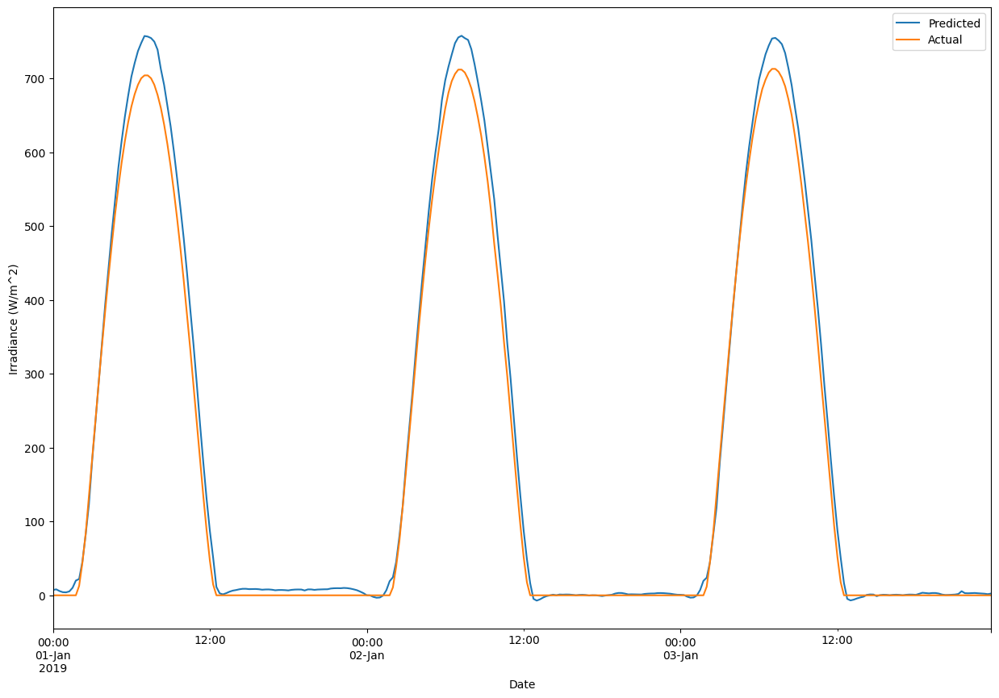

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

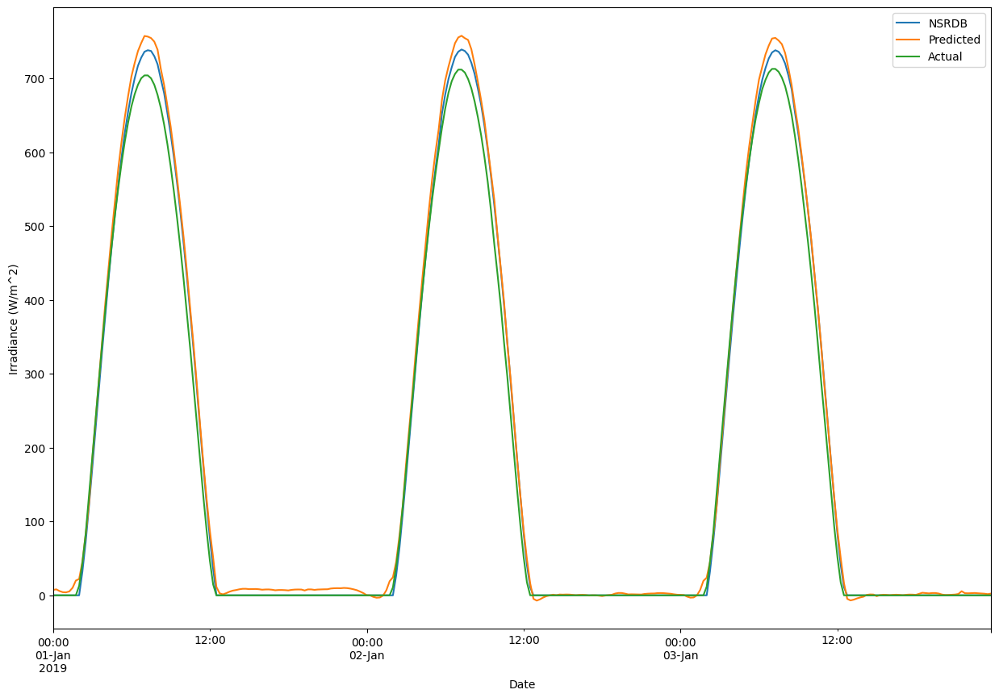

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_4.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9916821531990125
Root Mean Sqaured Error 26.254452
Mean Absolute Error 16.957294


Text(0, 0.5, 'Irradiance (W/m^2)')

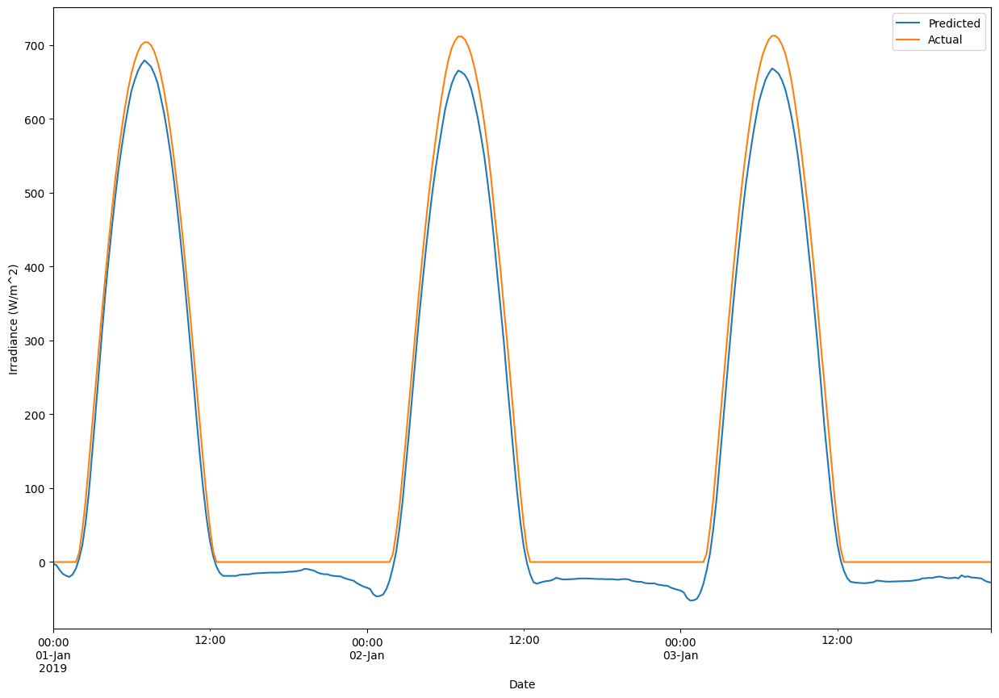

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(ch_val_x))
print("r2_Score",r2_score(s3_4.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

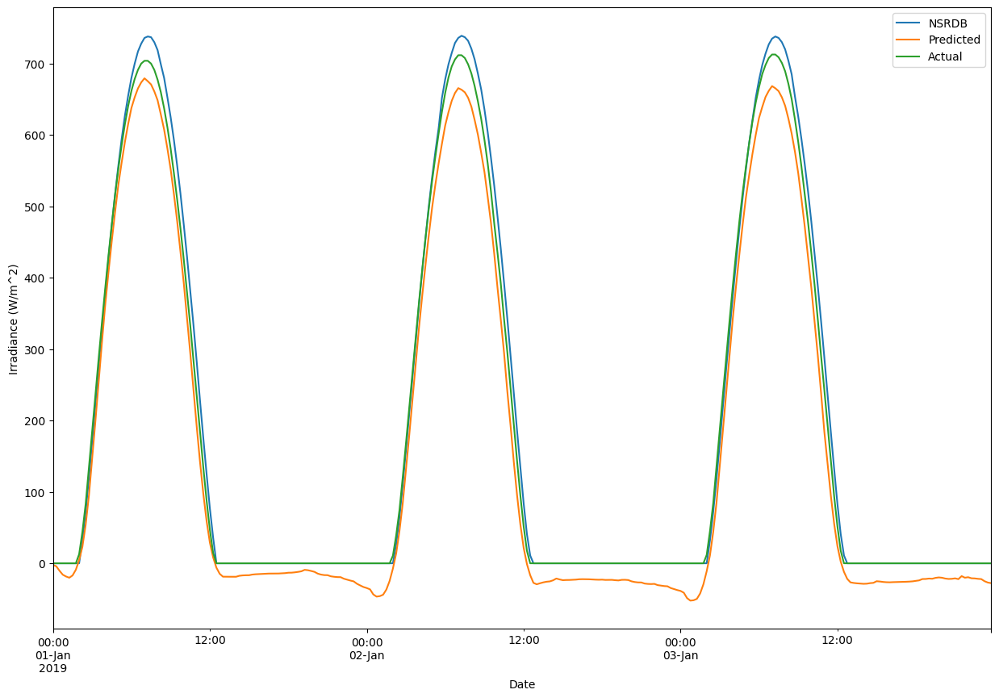

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9927020223968203
Root Mean Sqaured Error 26.254450982695296
Mean Absolute Error 16.957295986109006


Text(0, 0.5, 'Irradiance (W/m^2)')

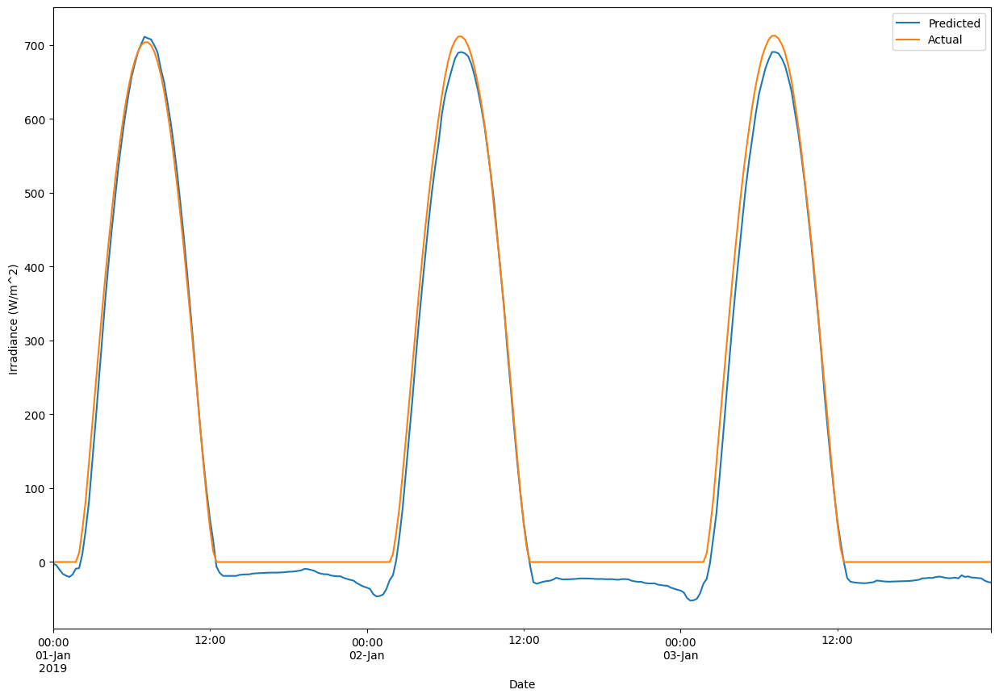

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

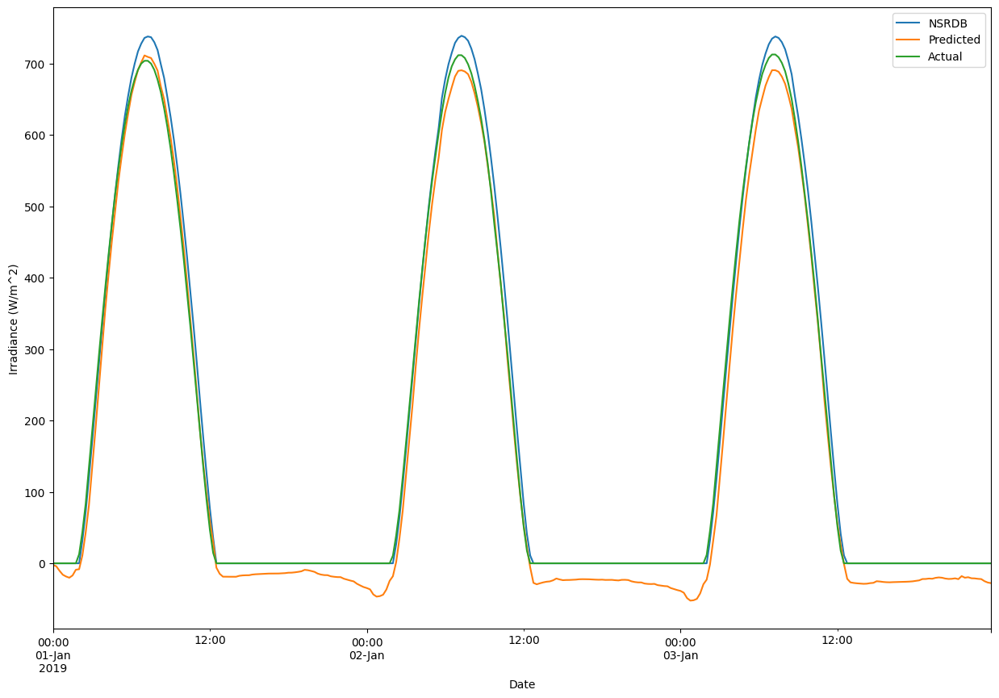

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_8.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9937215043749705
Root Mean Sqaured Error 23.065609
Mean Absolute Error 13.032034


Text(0, 0.5, 'Irradiance (W/m^2)')

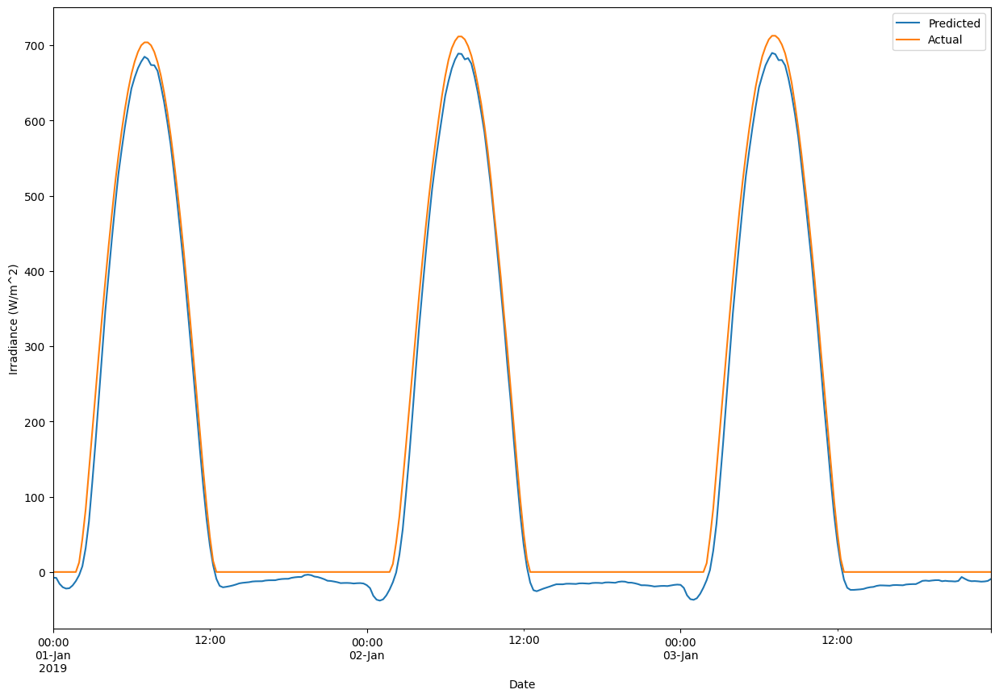

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(ch_val_x))
print("r2_Score",r2_score(s3_8.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

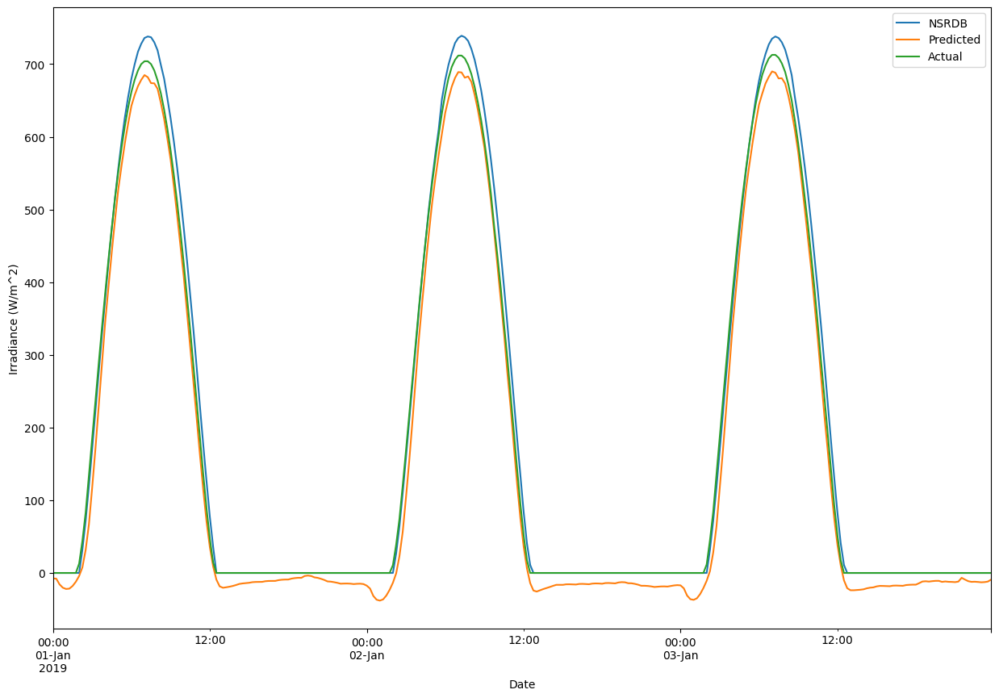

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9943671722709764
Root Mean Sqaured Error 23.065608297534787
Mean Absolute Error 13.03203401265838


Text(0, 0.5, 'Irradiance (W/m^2)')

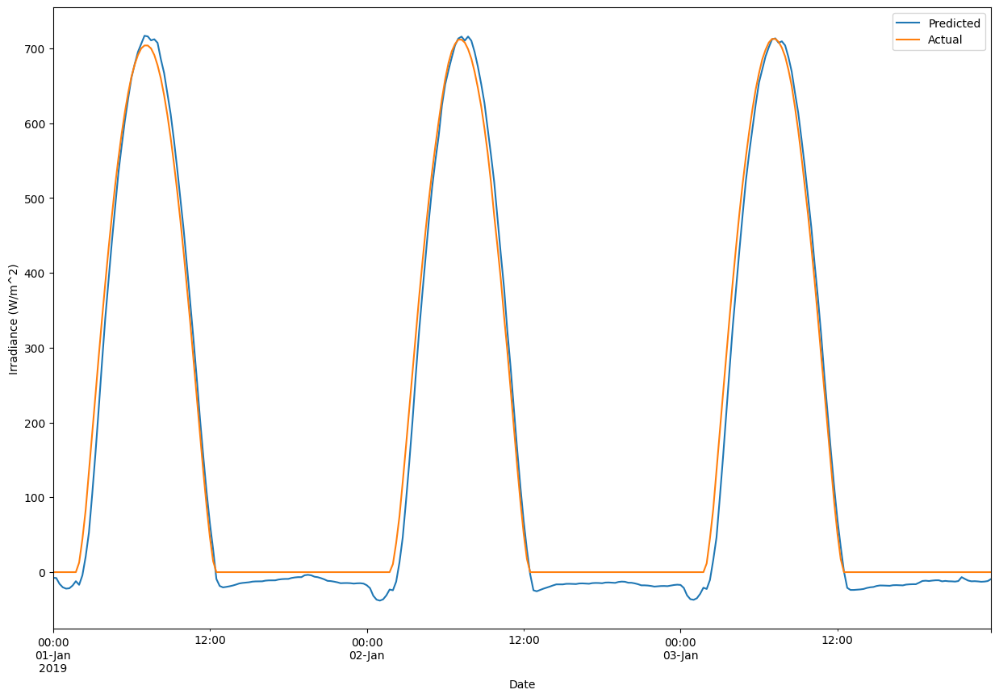

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

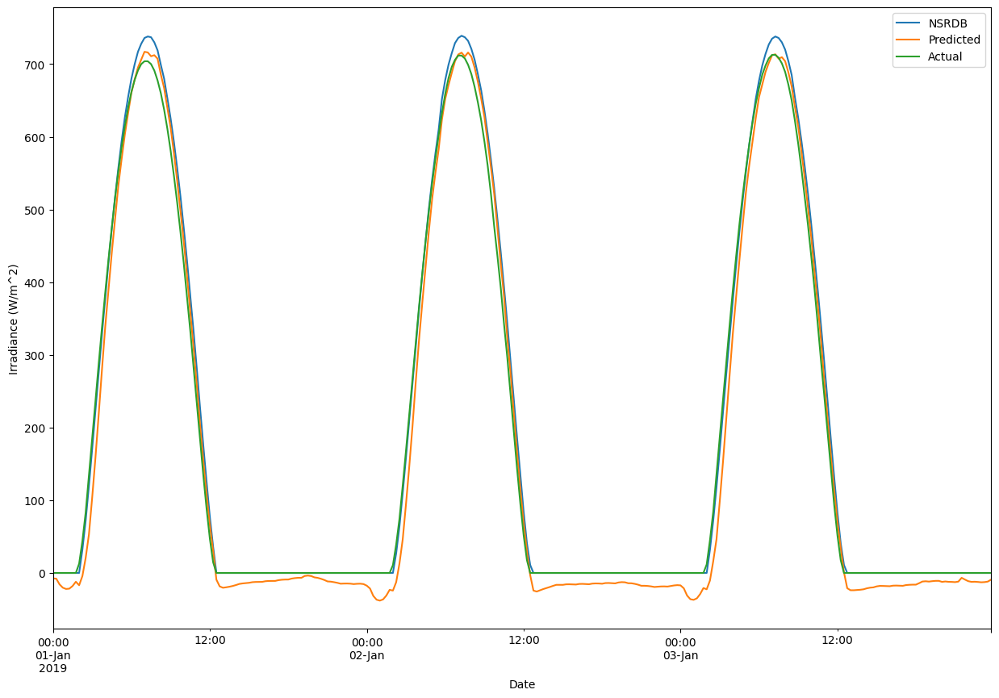

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9945205616287208
Root Mean Sqaured Error 21.232815
Mean Absolute Error 10.537914


Text(0, 0.5, 'Irradiance (W/m^2)')

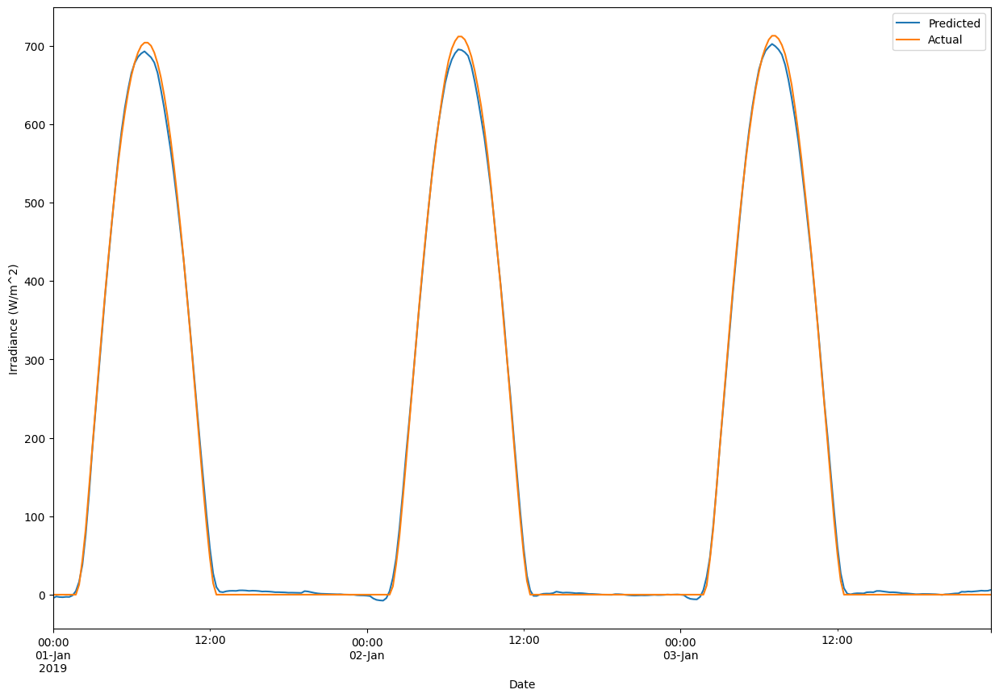

In [ ]:
df_date_ch_val['Actual']=scaler_y.inverse_transform(ch_val_y)
df_date_ch_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(ch_val_x))
print("r2_Score",r2_score(s3_12.predict(ch_val_x),ch_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['Actual'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['NSRDB']=ch_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

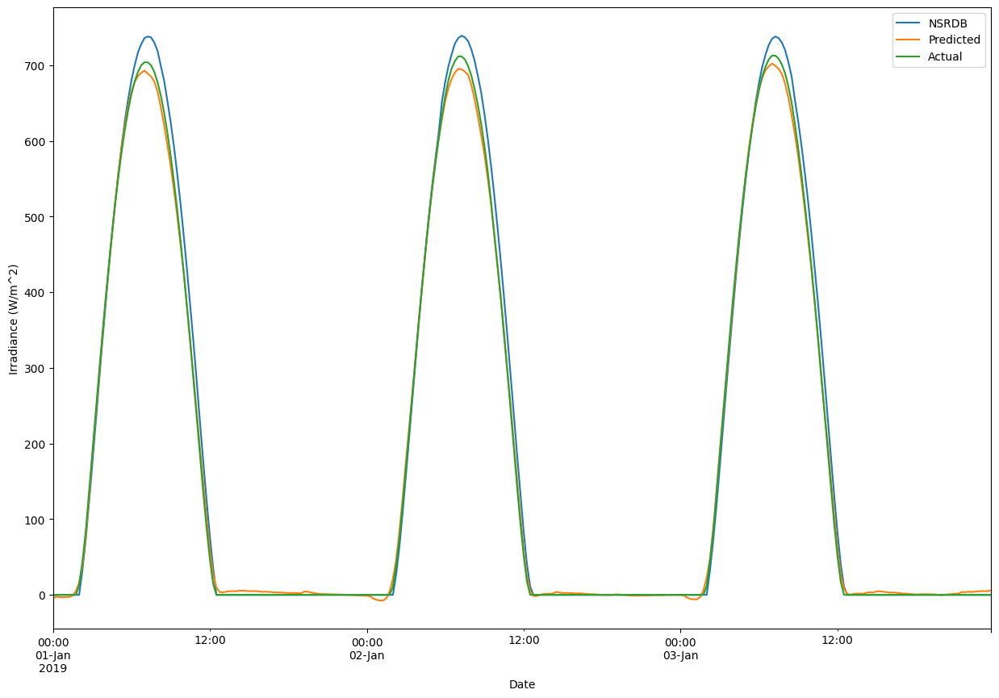

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_ch_val['Error']=df_date_ch_val['Actual']-df_date_ch_val['NSRDB']

In [ ]:
df_date_ch_val['Predicted']=df_date_ch_val['Predicted']- df_date_ch_val['Error']

r2_Score 0.9952267760482599
Root Mean Sqaured Error 21.23281537744341
Mean Absolute Error 10.537913116814567


Text(0, 0.5, 'Irradiance (W/m^2)')

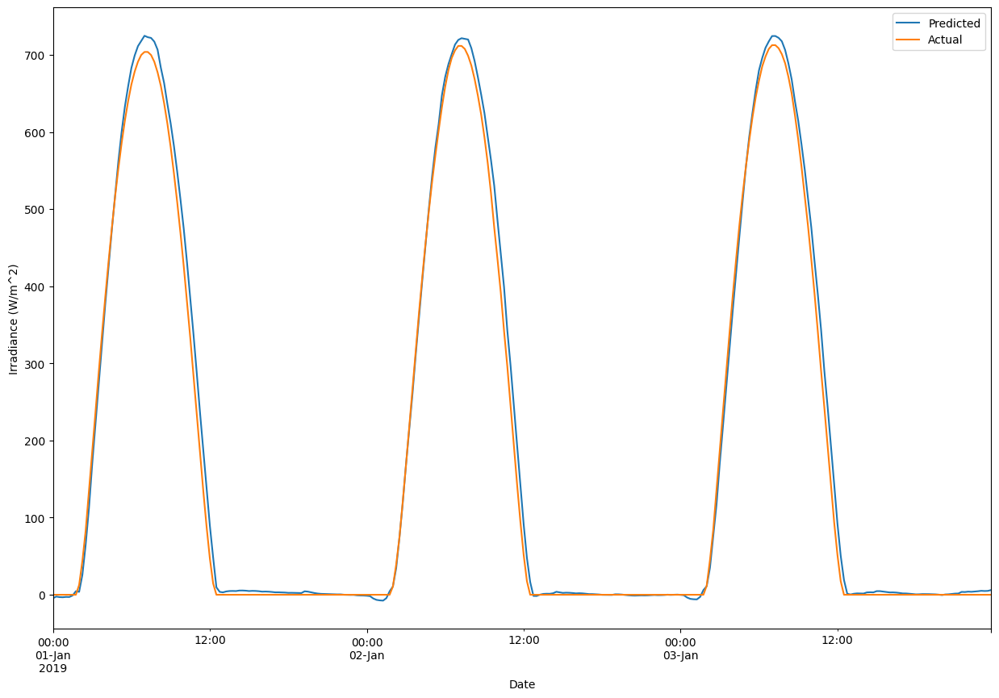

In [ ]:
print("r2_Score",r2_score(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_ch_val['NSRDB'],df_date_ch_val['Predicted']))
df_date_ch_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

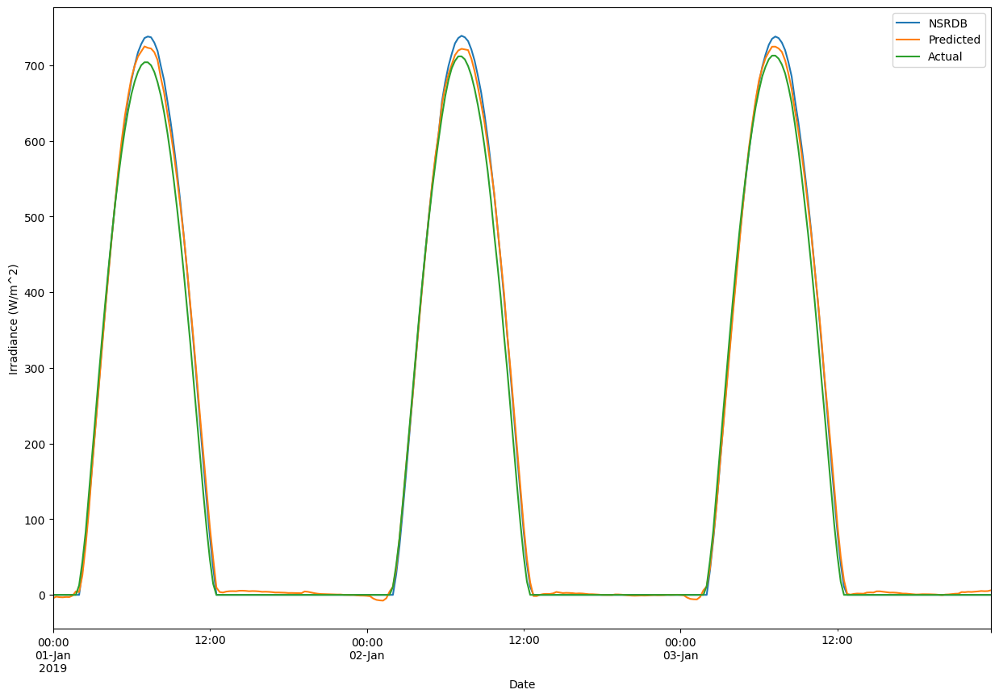

In [ ]:
df_date_ch_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# BH

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_4.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9946164415337398
Root Mean Sqaured Error 21.86364
Mean Absolute Error 13.102282


Text(0, 0.5, 'Irradiance (W/m^2)')

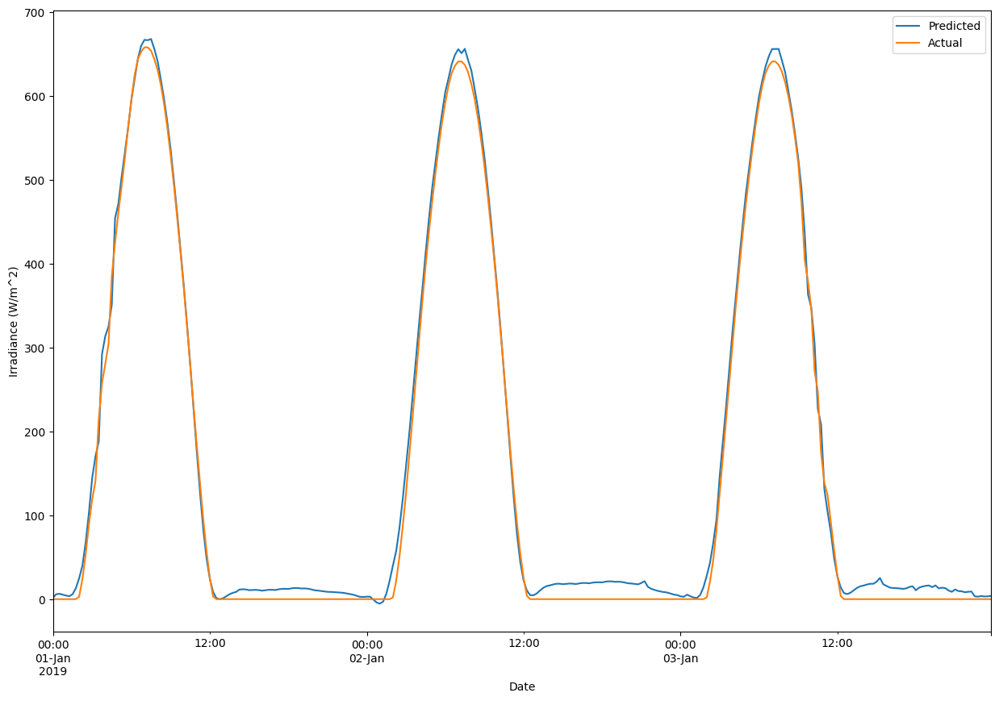

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(bh_val_x))
print("r2_Score",r2_score(s1_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

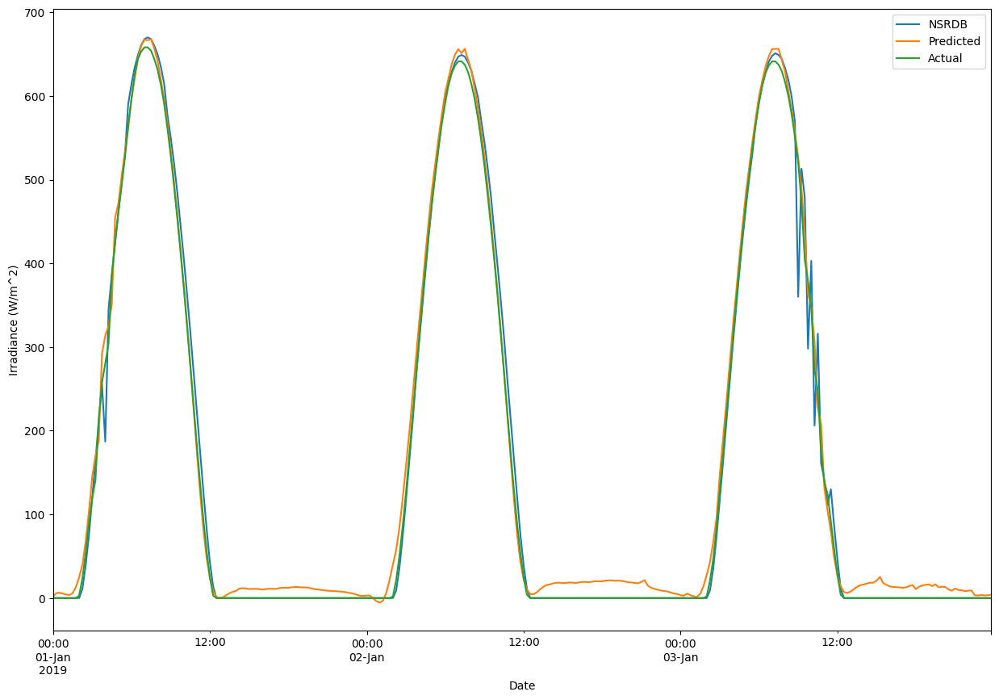

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9949371970224329
Root Mean Sqaured Error 21.86364085006174
Mean Absolute Error 13.102282102850914


Text(0, 0.5, 'Irradiance (W/m^2)')

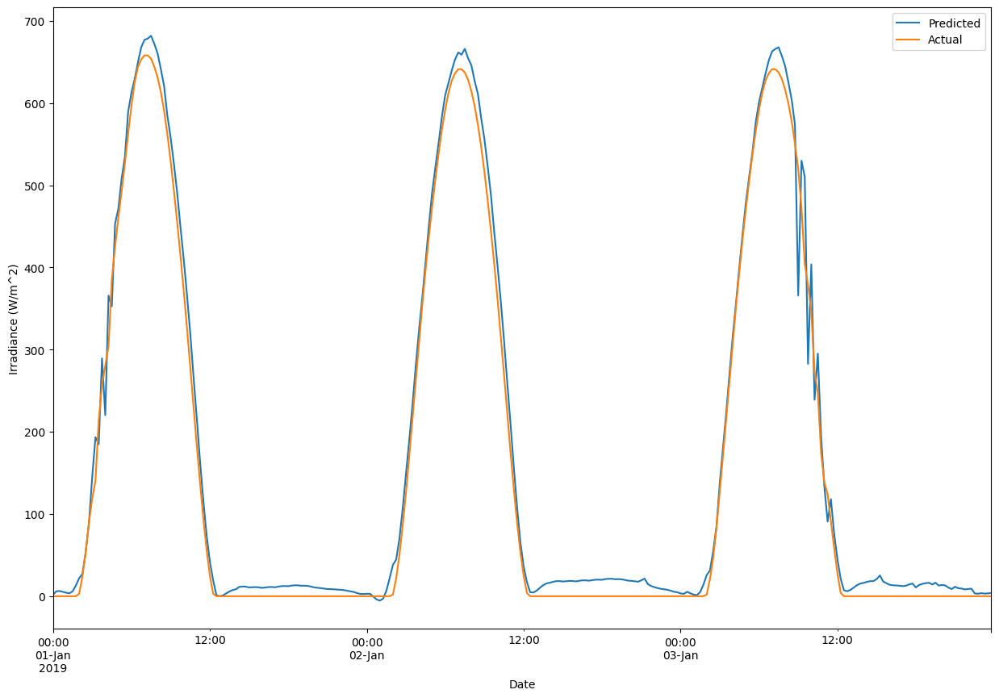

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

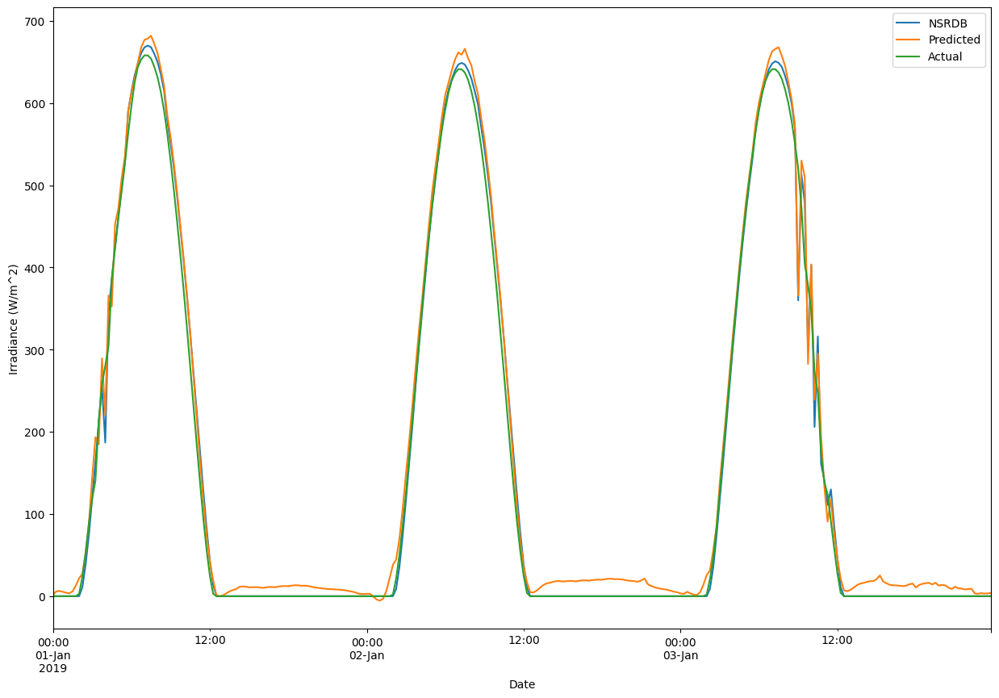

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_8.h5')

1095/1095 [==============================] - 15s 14ms/step
r2_Score 0.9950277621611968
Root Mean Sqaured Error 20.73607
Mean Absolute Error 12.193013


Text(0, 0.5, 'Irradiance (W/m^2)')

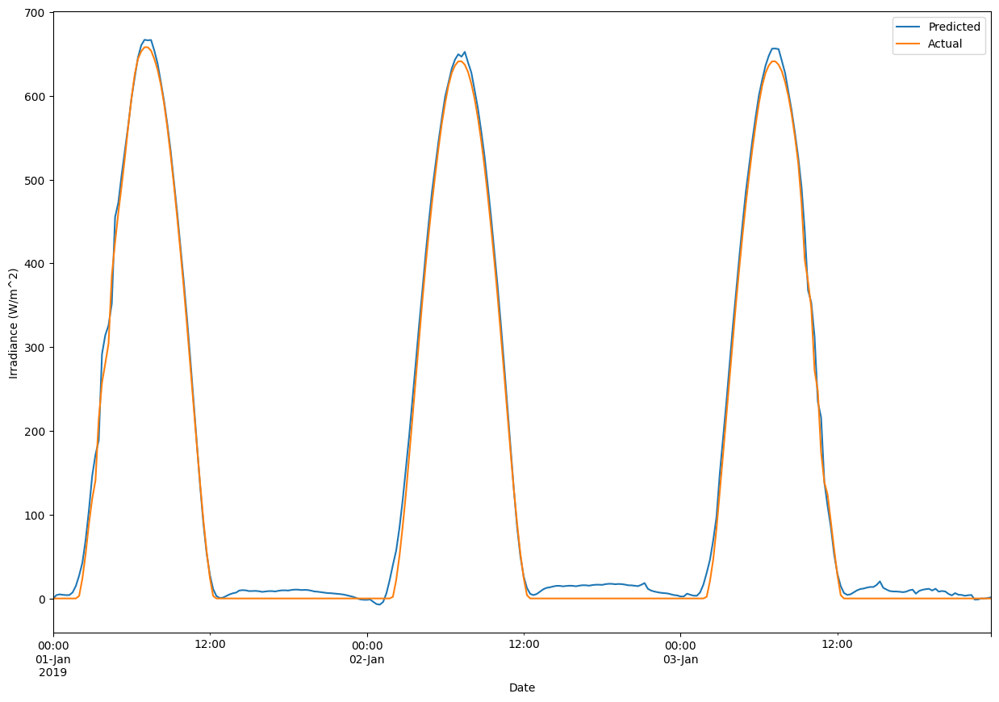

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(bh_val_x))
print("r2_Score",r2_score(s1_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

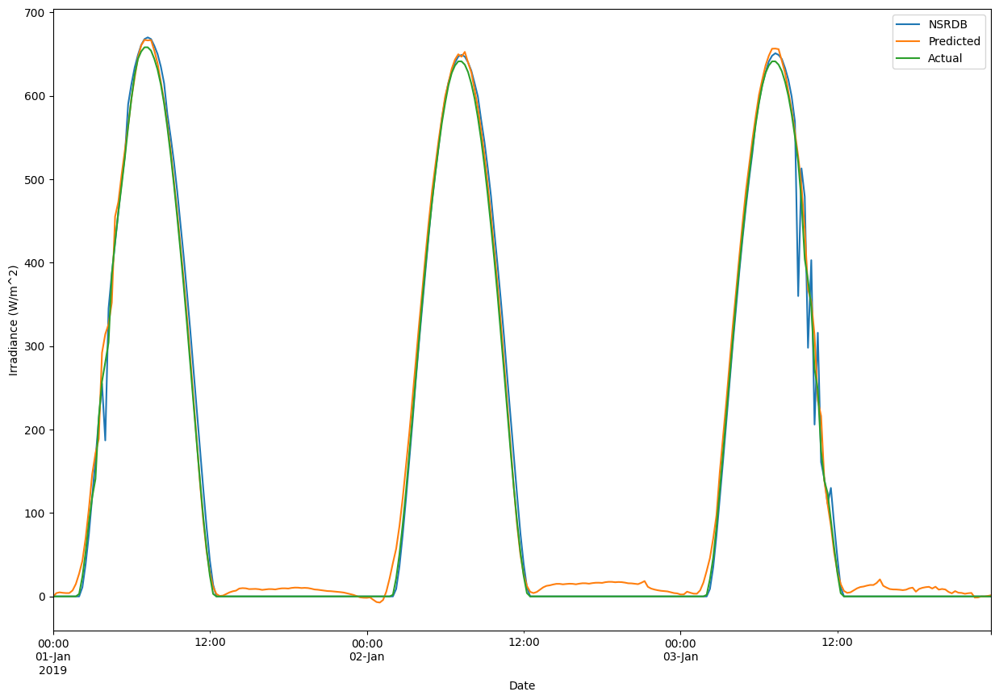

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.995445937088724
Root Mean Sqaured Error 20.736071617589996
Mean Absolute Error 12.19301372338913


Text(0, 0.5, 'Irradiance (W/m^2)')

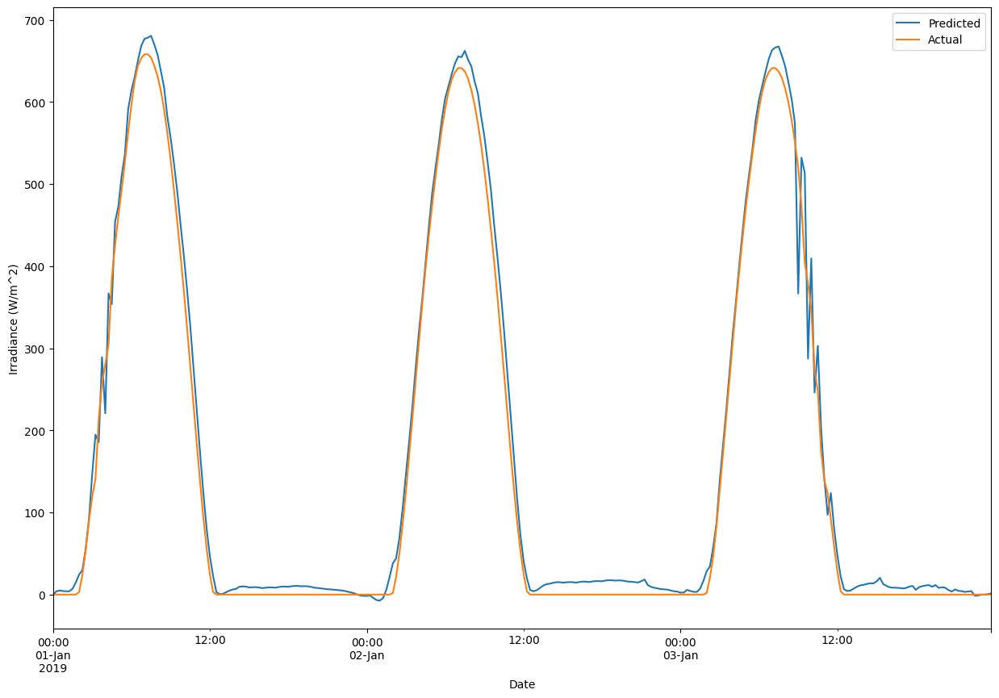

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

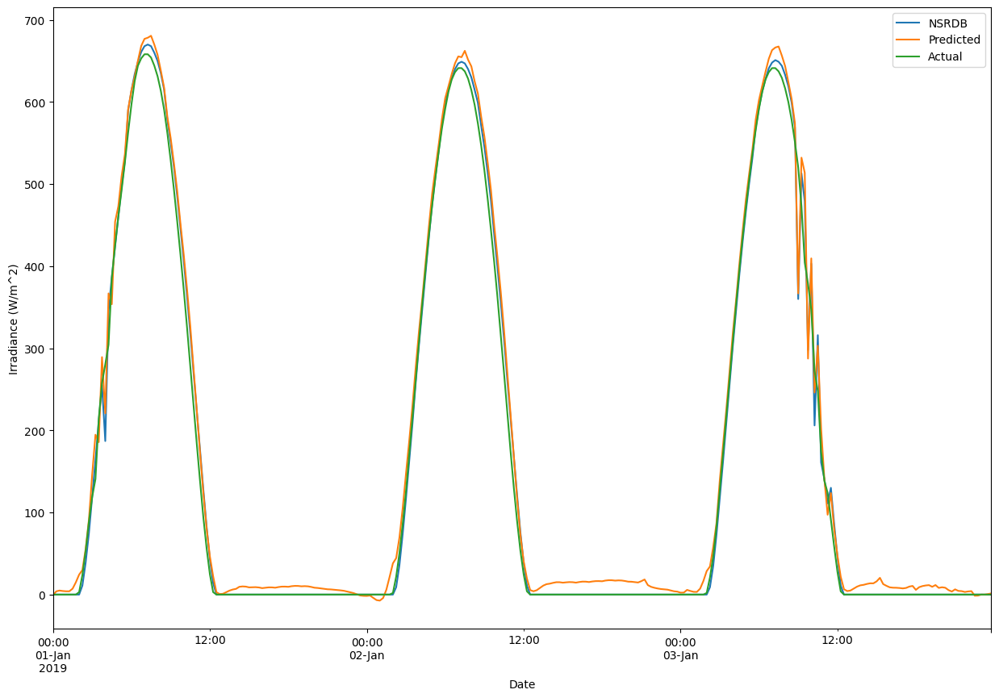

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9950560631343806
Root Mean Sqaured Error 20.559788
Mean Absolute Error 11.752455


Text(0, 0.5, 'Irradiance (W/m^2)')

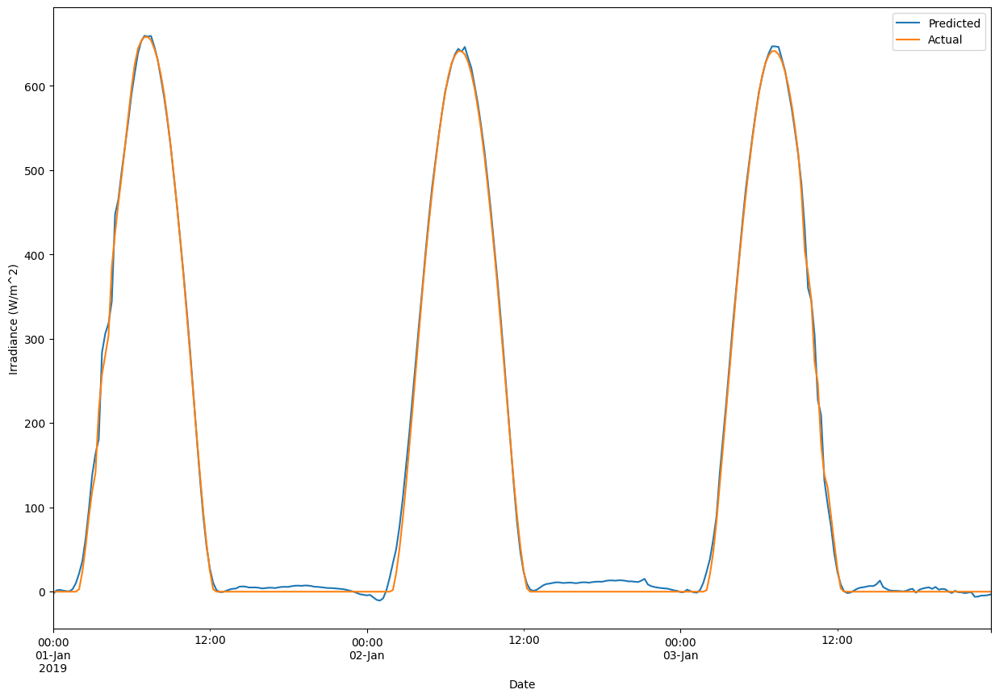

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(bh_val_x))
print("r2_Score",r2_score(s1_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

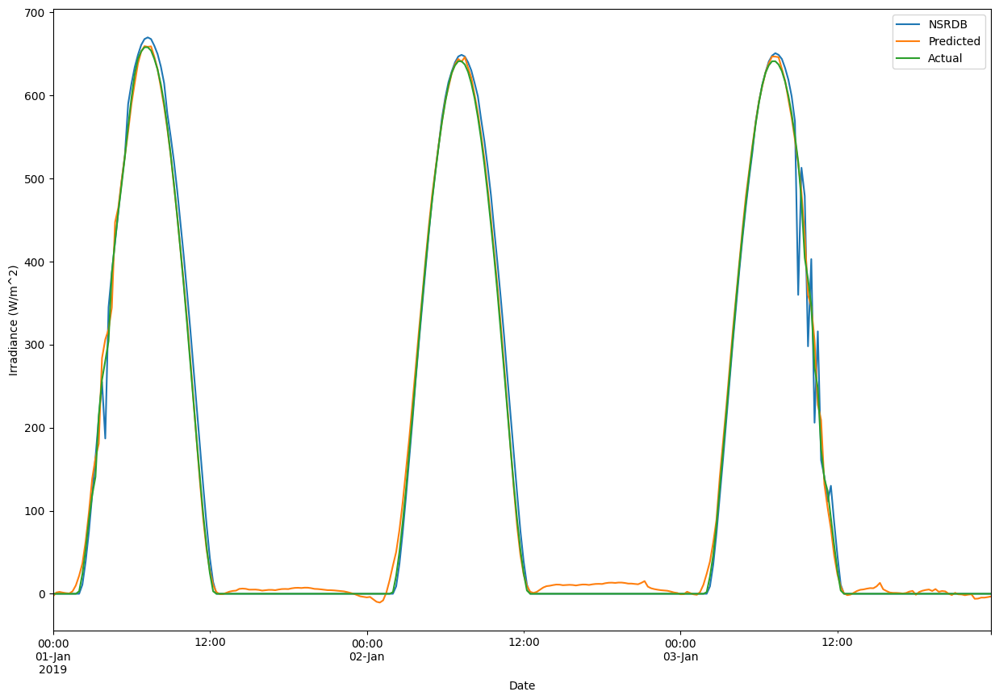

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9955230392814279
Root Mean Sqaured Error 20.559787100534283
Mean Absolute Error 11.752455026113662


Text(0, 0.5, 'Irradiance (W/m^2)')

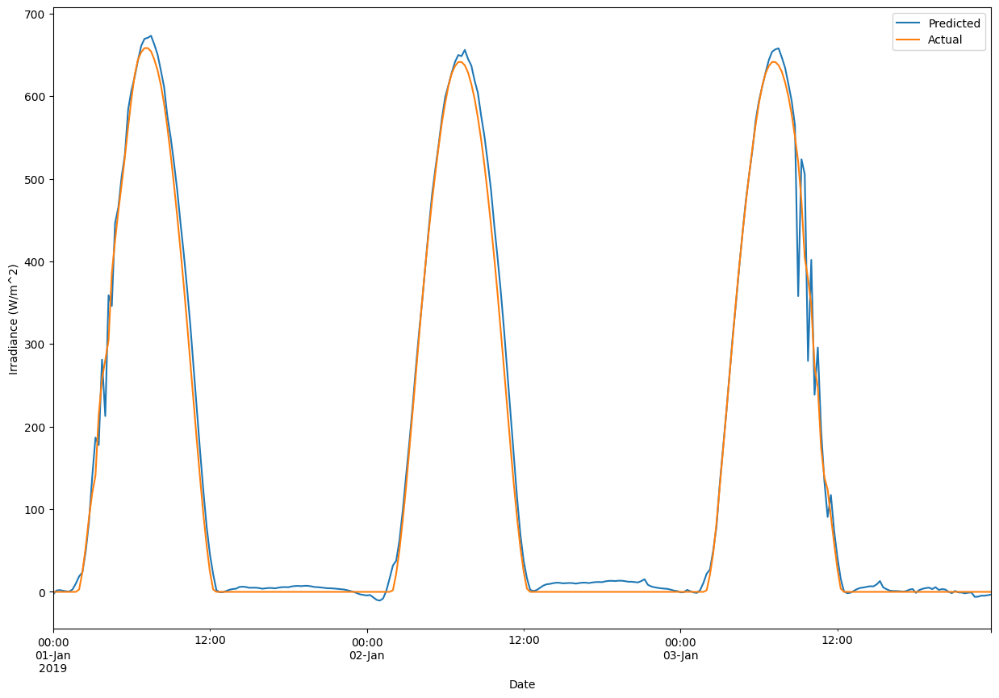

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

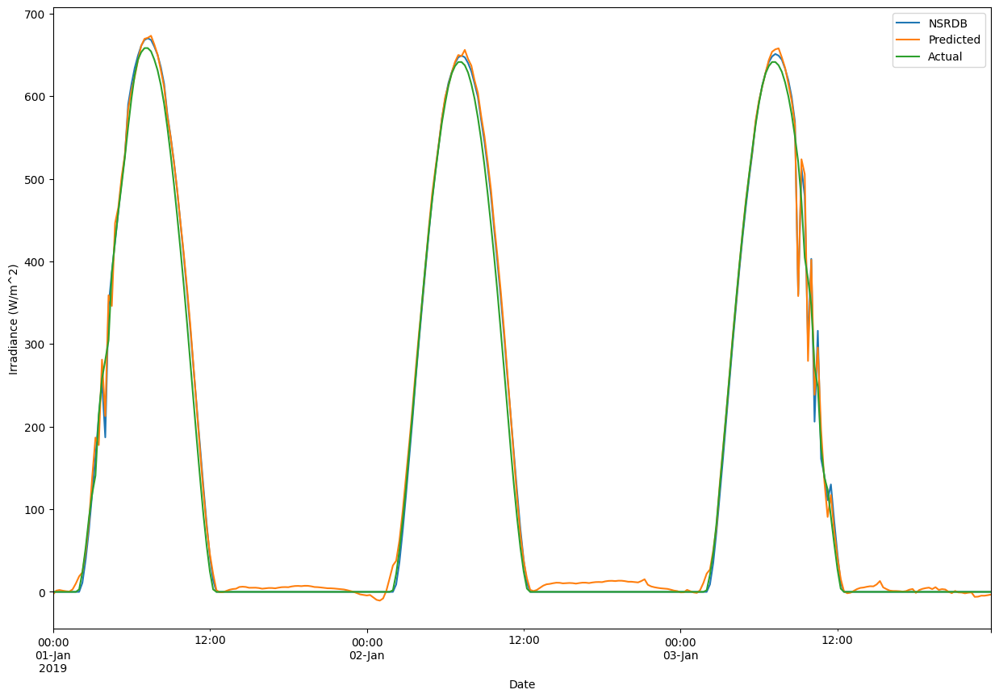

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S3_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_4.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9950442098408933
Root Mean Sqaured Error 21.110746
Mean Absolute Error 10.898089


Text(0, 0.5, 'Irradiance (W/m^2)')

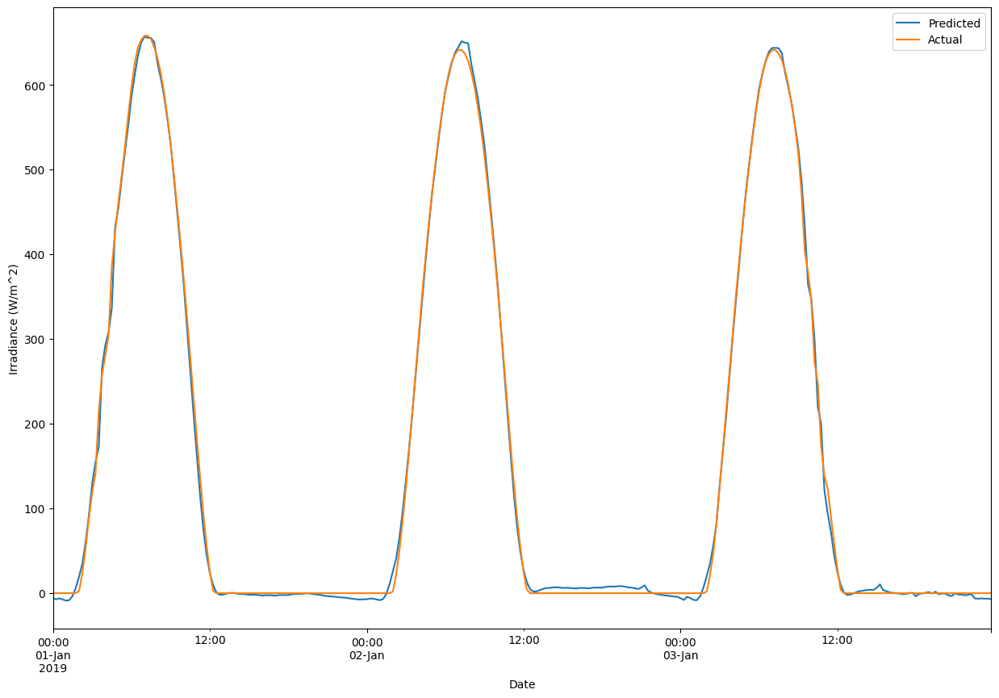

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(bh_val_x))
print("r2_Score",r2_score(s2_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

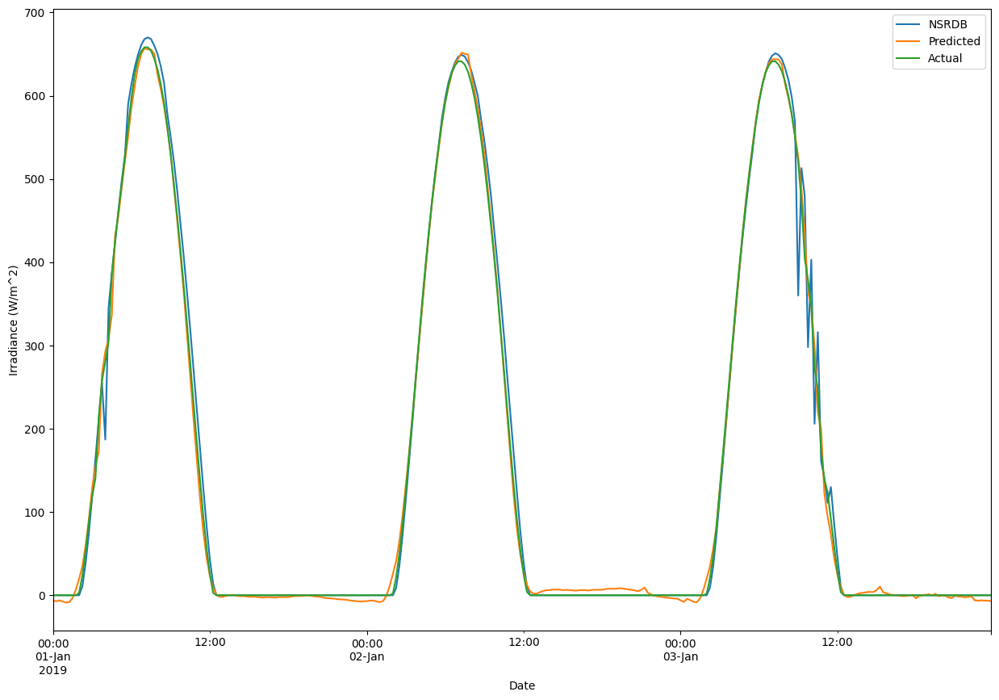

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9952798773367599
Root Mean Sqaured Error 21.110747616994743
Mean Absolute Error 10.898089187239002


Text(0, 0.5, 'Irradiance (W/m^2)')

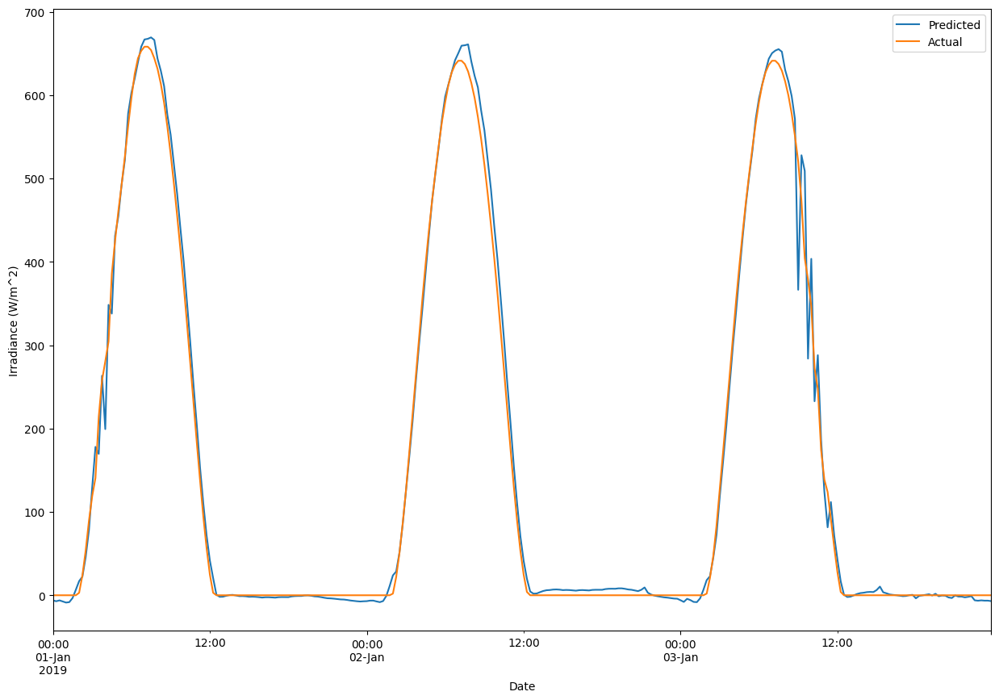

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

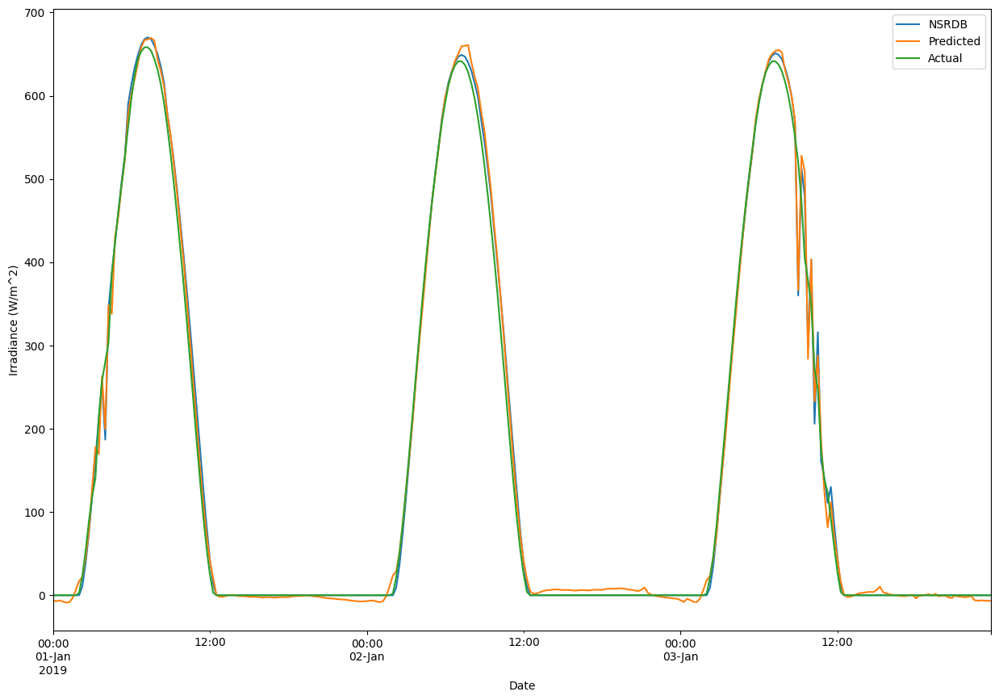

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9955196093195873
Root Mean Sqaured Error 19.569475
Mean Absolute Error 9.824611


Text(0, 0.5, 'Irradiance (W/m^2)')

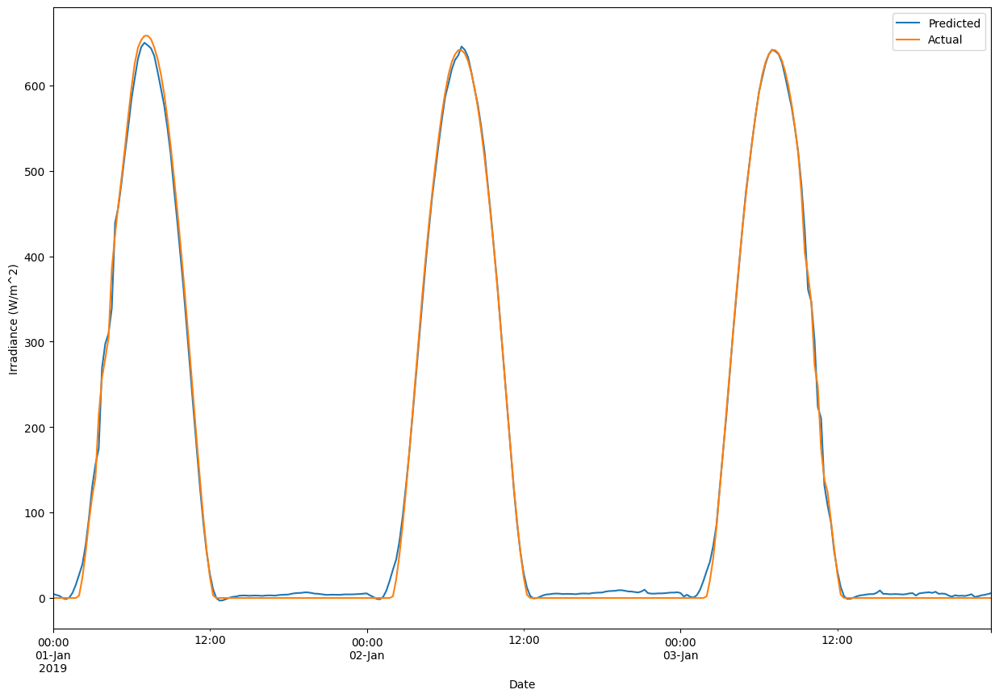

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(bh_val_x))
print("r2_Score",r2_score(s2_8.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

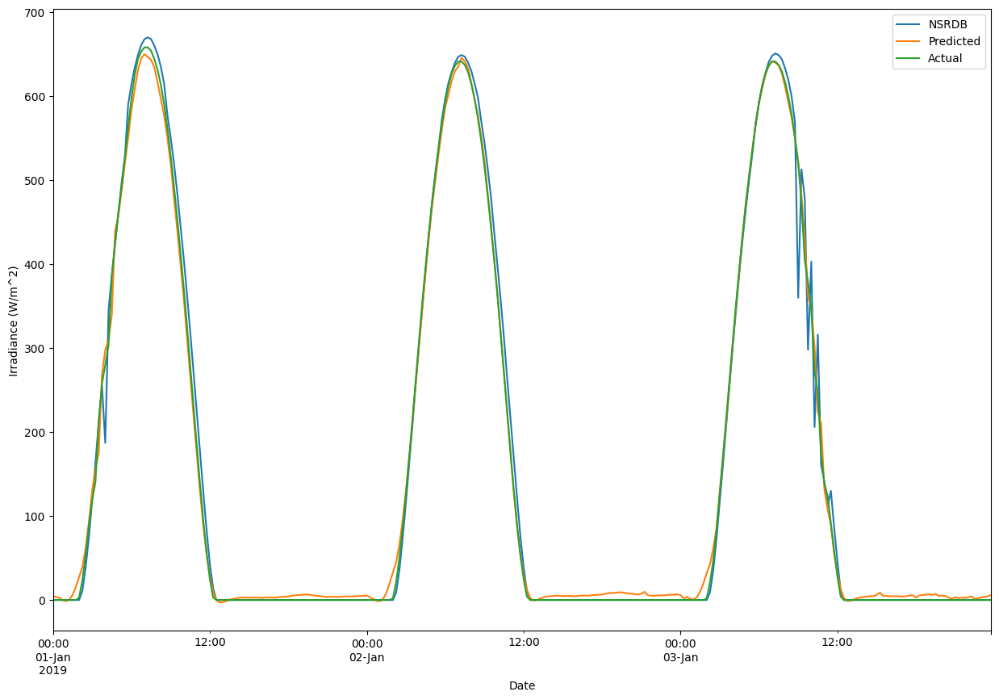

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9959439397144803
Root Mean Sqaured Error 19.56947487045313
Mean Absolute Error 9.824610657114127


Text(0, 0.5, 'Irradiance (W/m^2)')

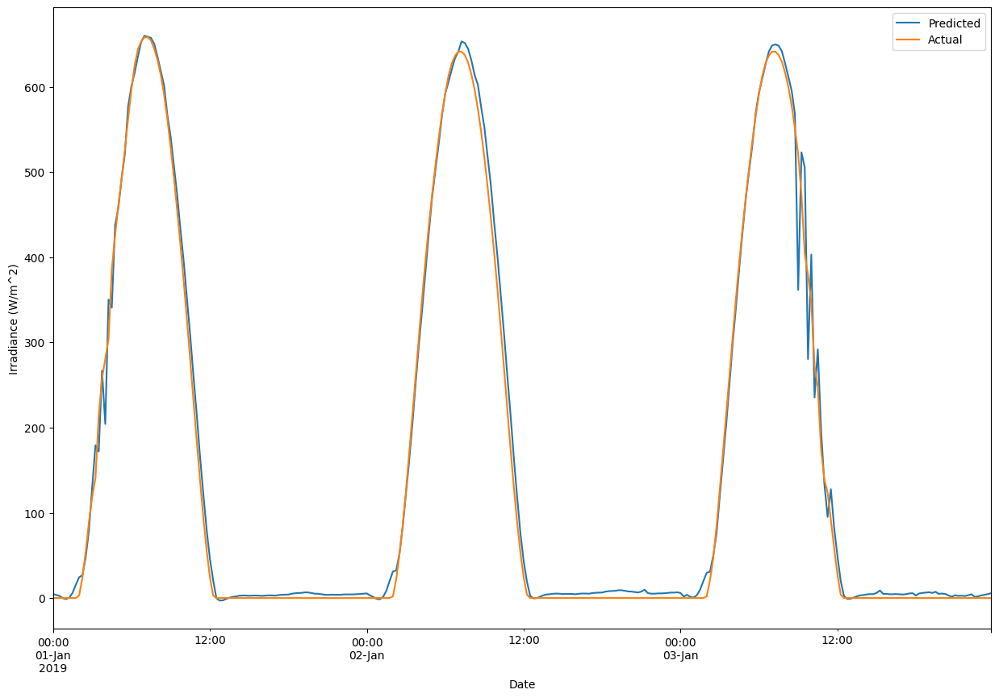

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

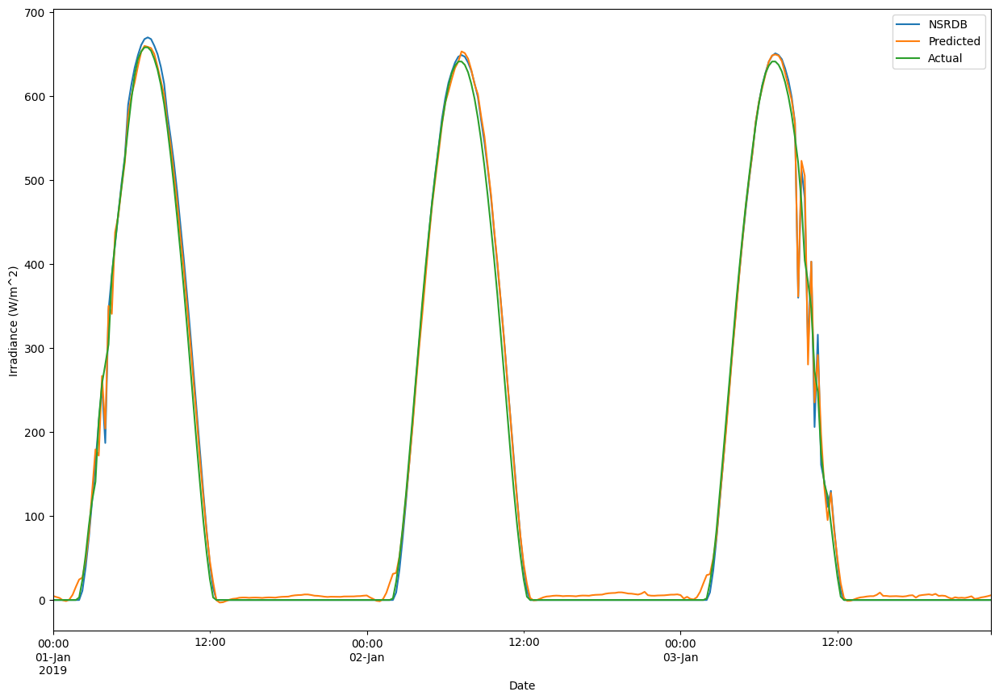

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_12.h5.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9947114728334766
Root Mean Sqaured Error 21.802725
Mean Absolute Error 12.610999


Text(0, 0.5, 'Irradiance (W/m^2)')

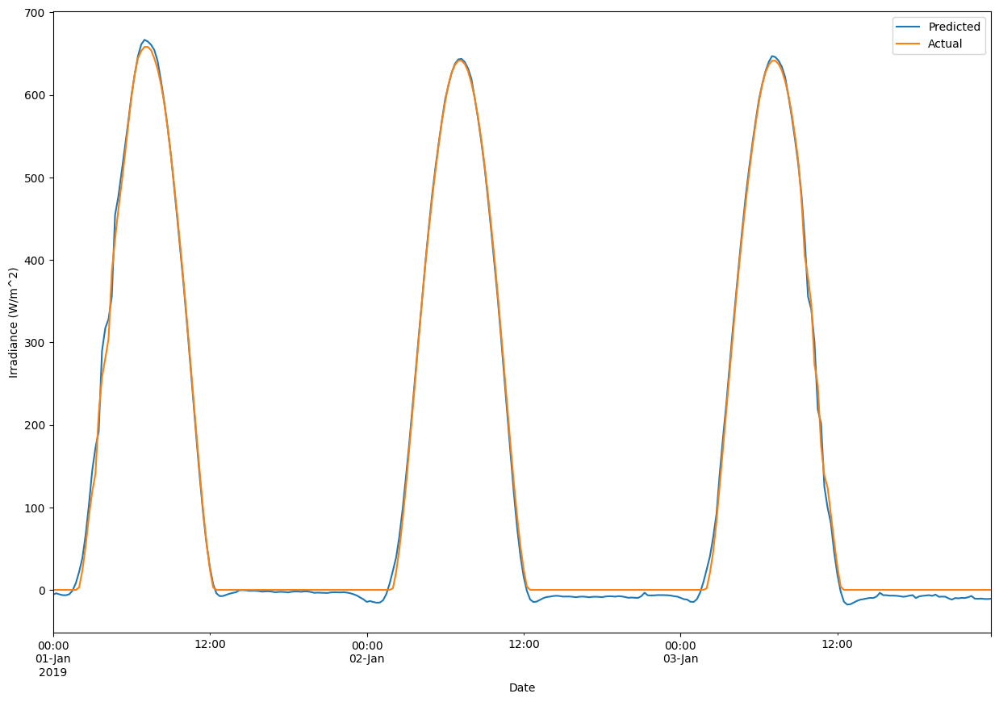

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(bh_val_x))
print("r2_Score",r2_score(s2_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

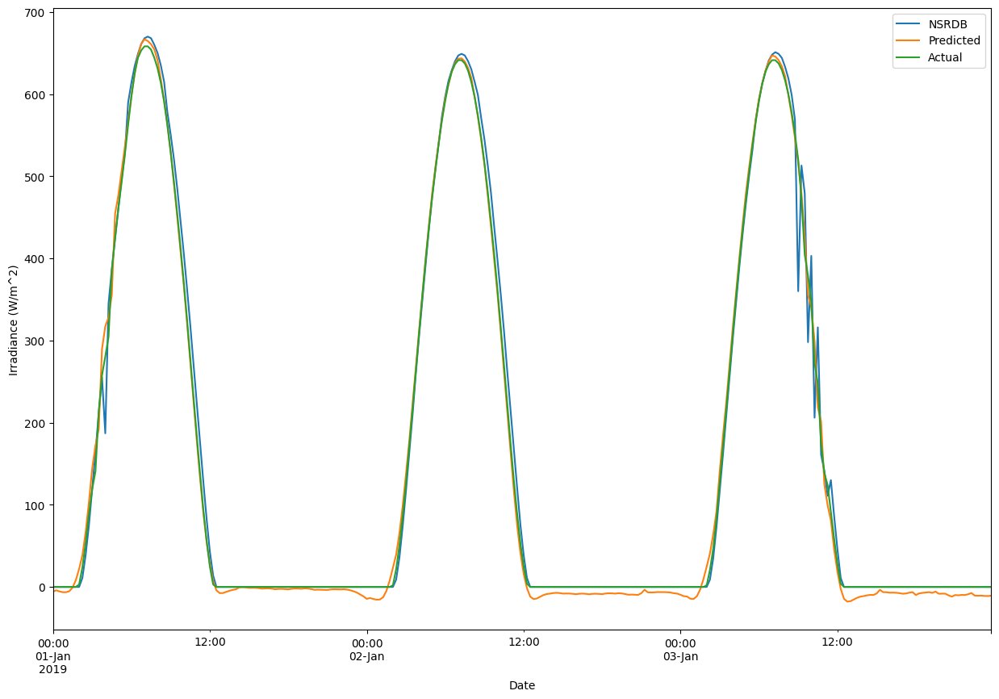

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9949653696743682
Root Mean Sqaured Error 21.80272439404256
Mean Absolute Error 12.610999104171253


Text(0, 0.5, 'Irradiance (W/m^2)')

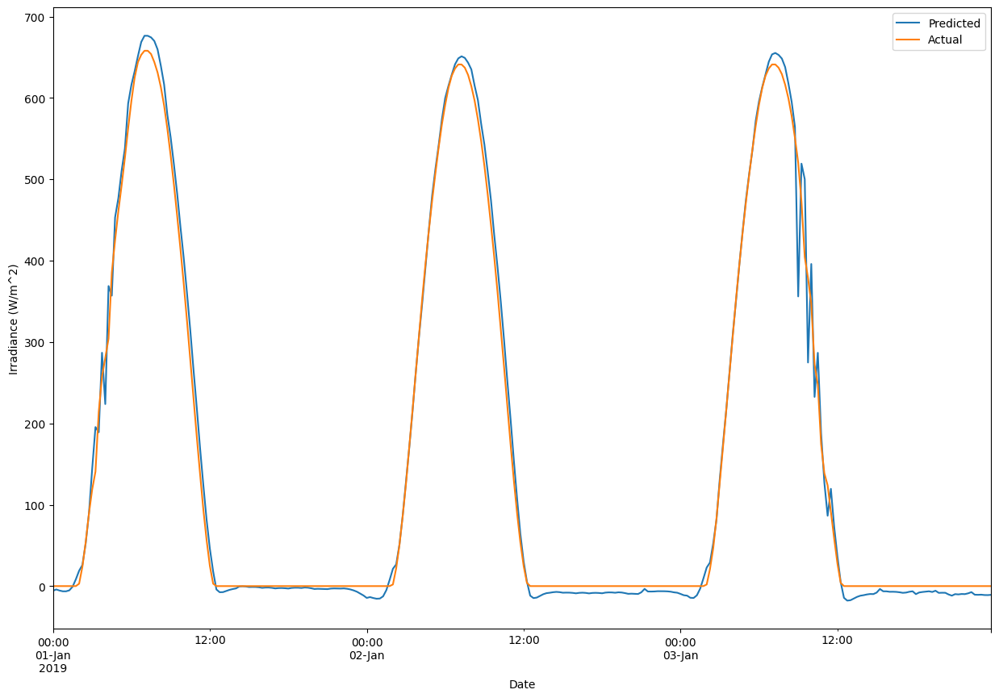

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

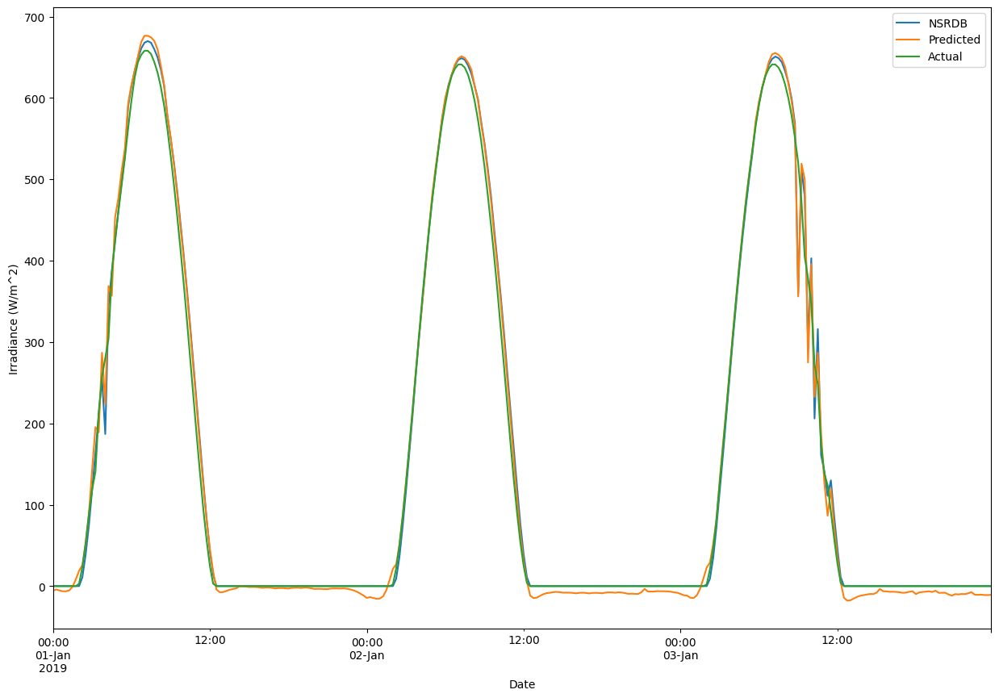

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_4.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9930097794850058
Root Mean Sqaured Error 25.721119
Mean Absolute Error 15.136358


Text(0, 0.5, 'Irradiance (W/m^2)')

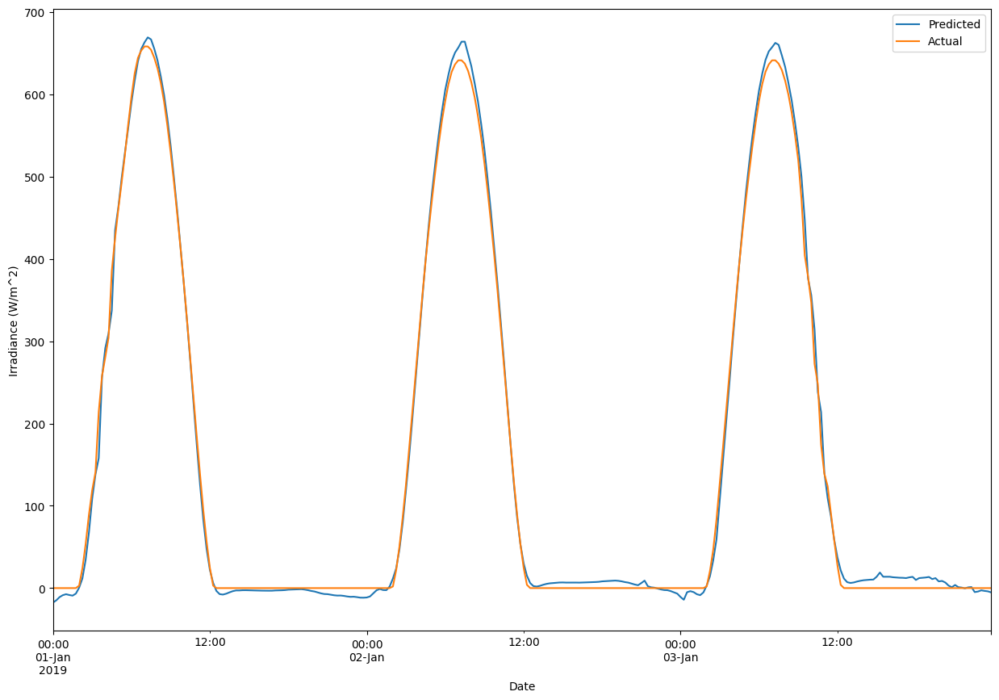

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(bh_val_x))
print("r2_Score",r2_score(s3_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

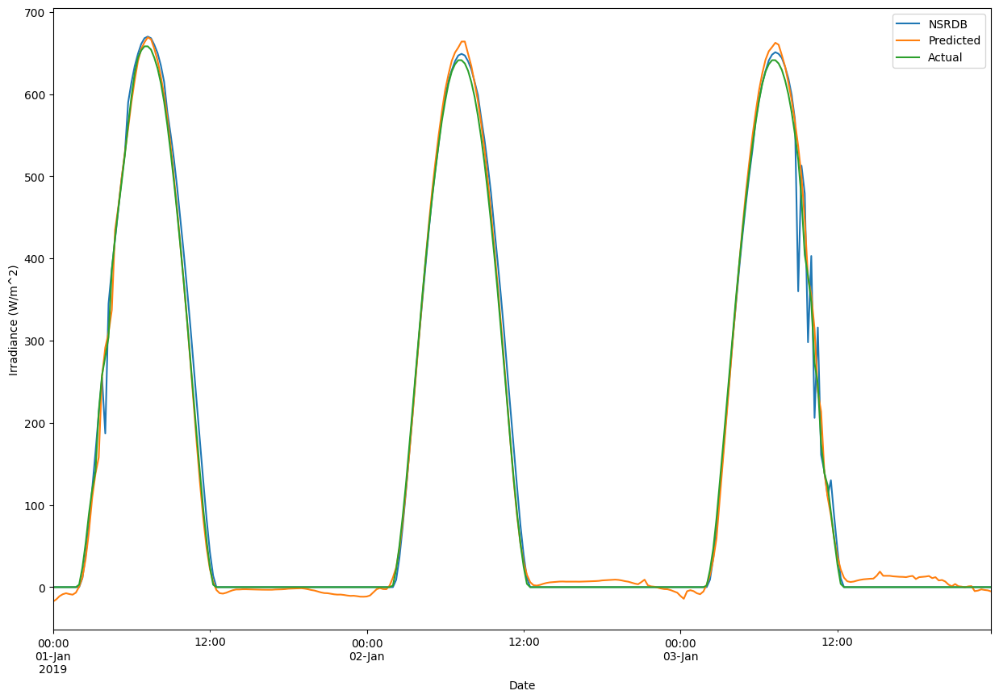

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.992993103090856
Root Mean Sqaured Error 25.72111760742816
Mean Absolute Error 15.136359047974443


Text(0, 0.5, 'Irradiance (W/m^2)')

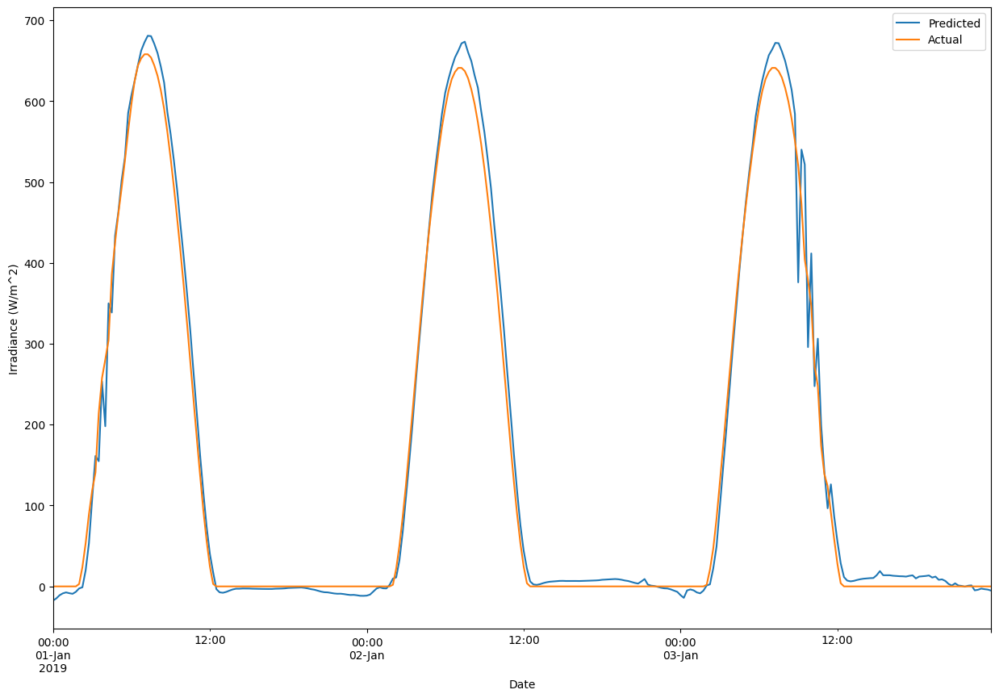

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

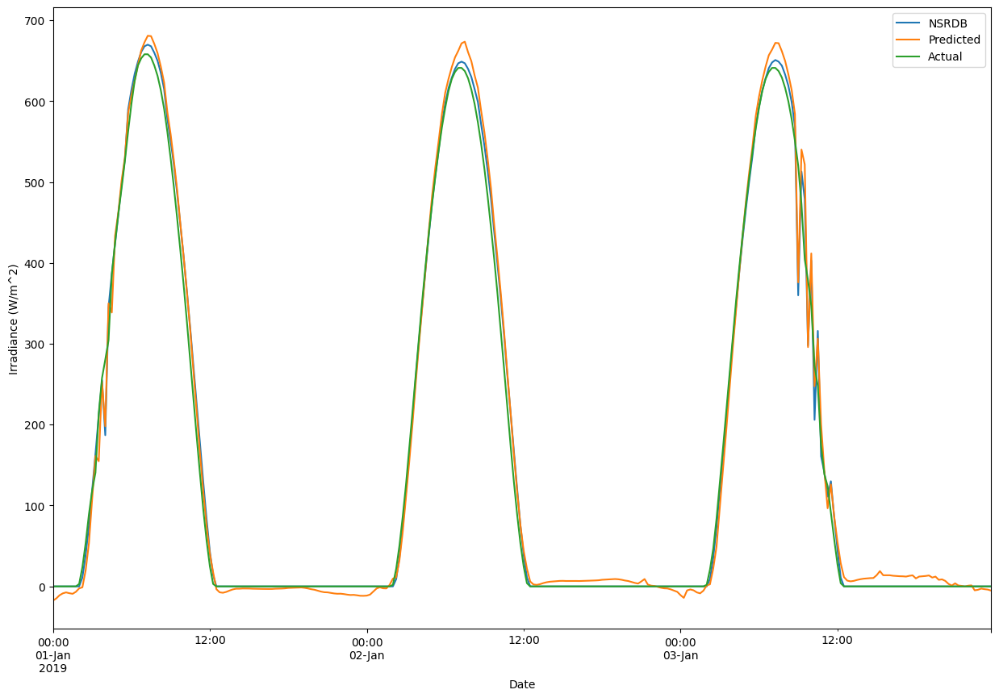

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_8.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9935423768413943
Root Mean Sqaured Error 24.275932
Mean Absolute Error 15.332117


Text(0, 0.5, 'Irradiance (W/m^2)')

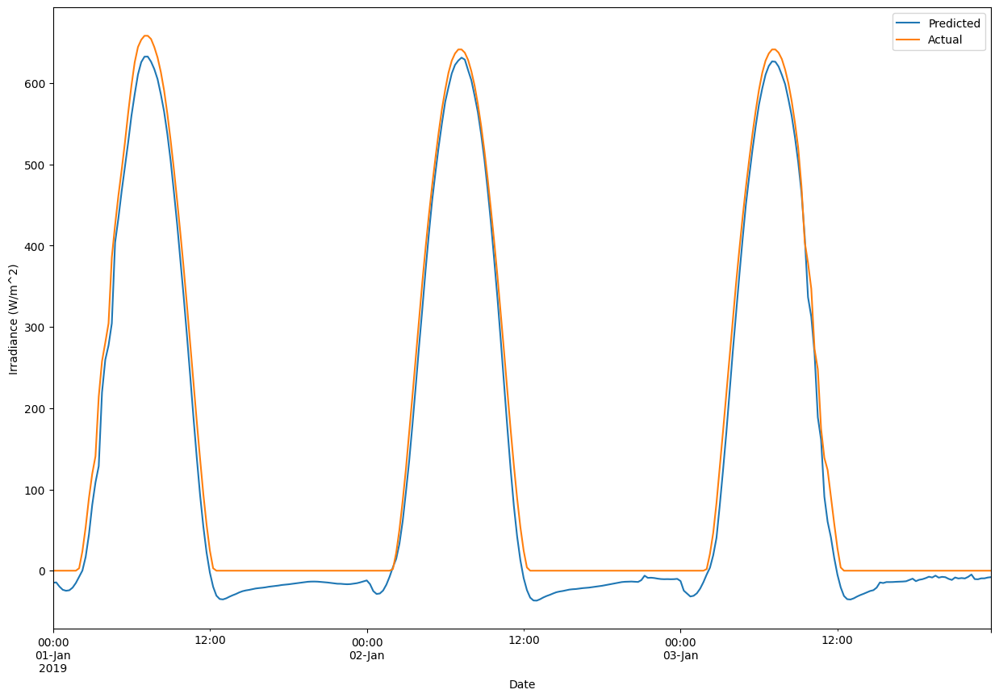

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(bh_val_x))
print("r2_Score",r2_score(s3_8.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

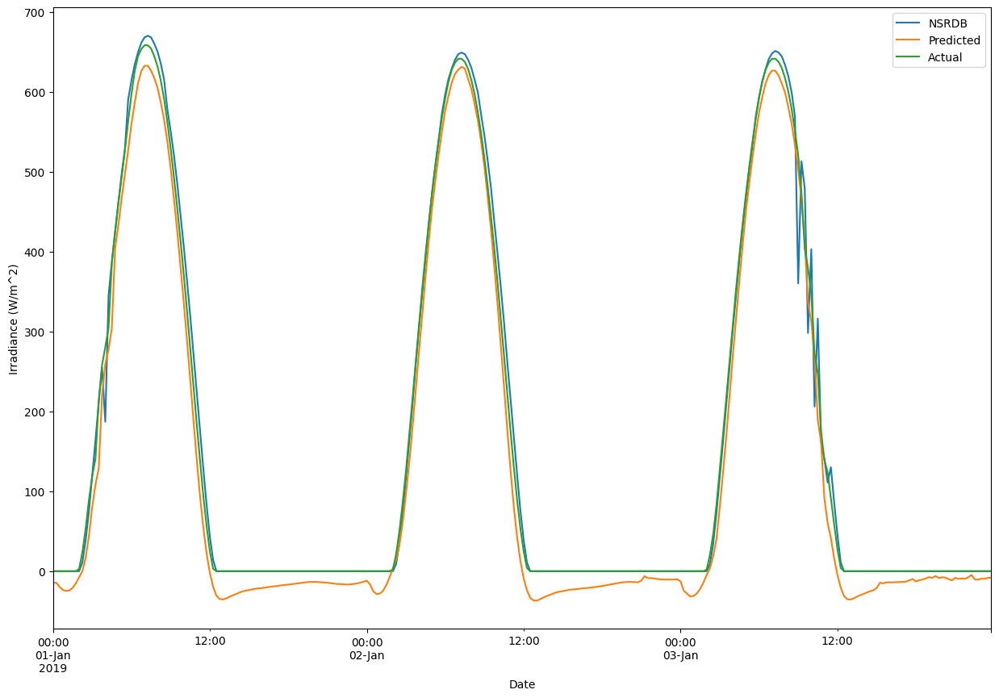

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9937583716430001
Root Mean Sqaured Error 24.275932669051098
Mean Absolute Error 15.332116741440142


Text(0, 0.5, 'Irradiance (W/m^2)')

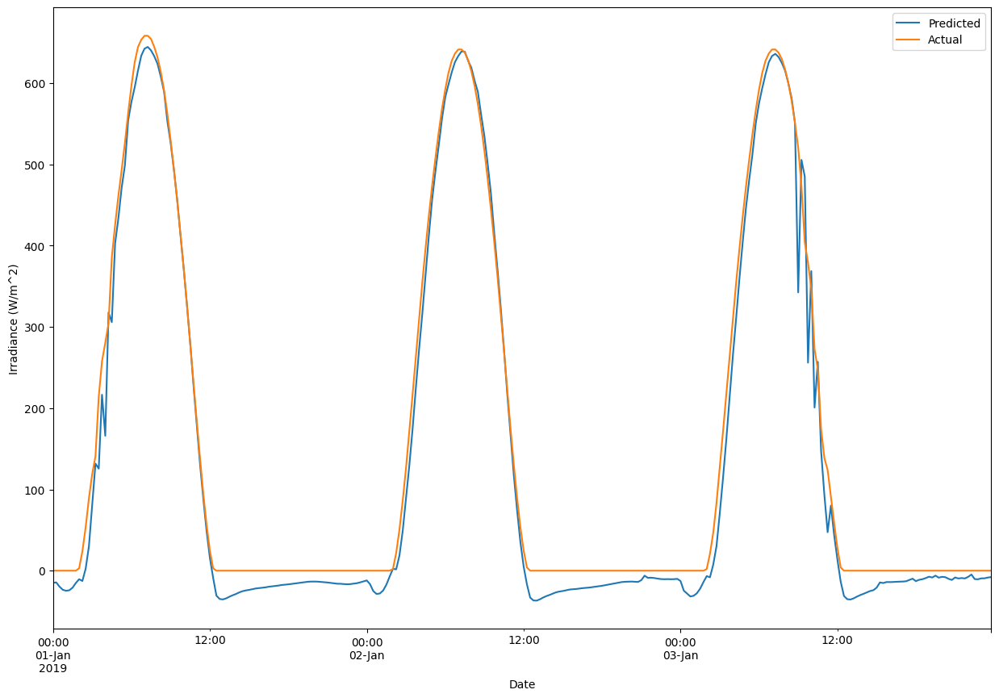

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

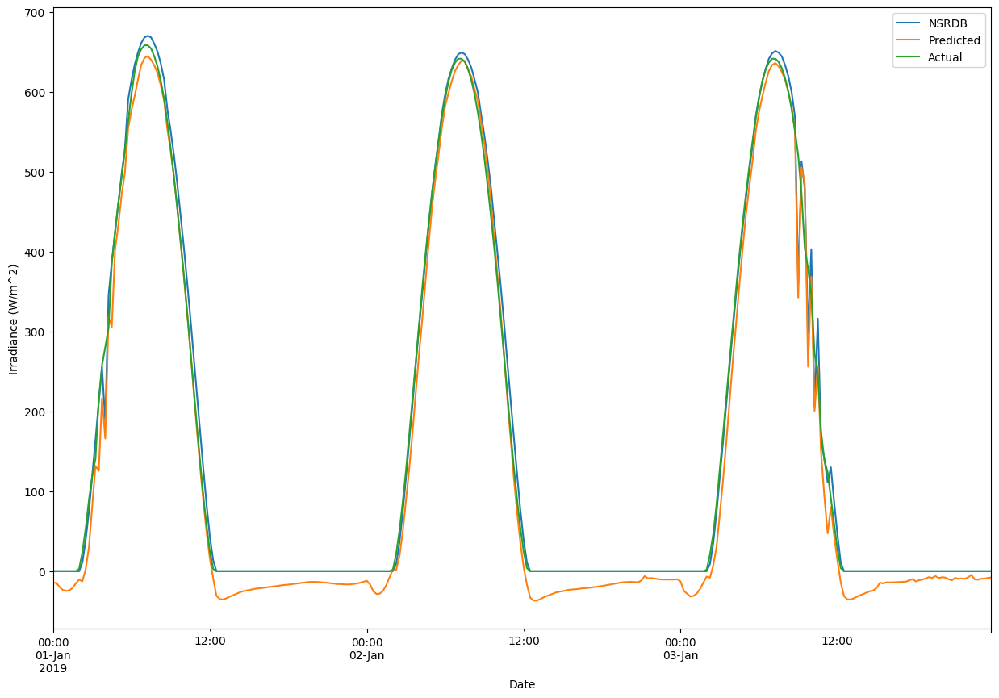

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_12.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9925626071190151
Root Mean Sqaured Error 25.081045
Mean Absolute Error 14.495887


Text(0, 0.5, 'Irradiance (W/m^2)')

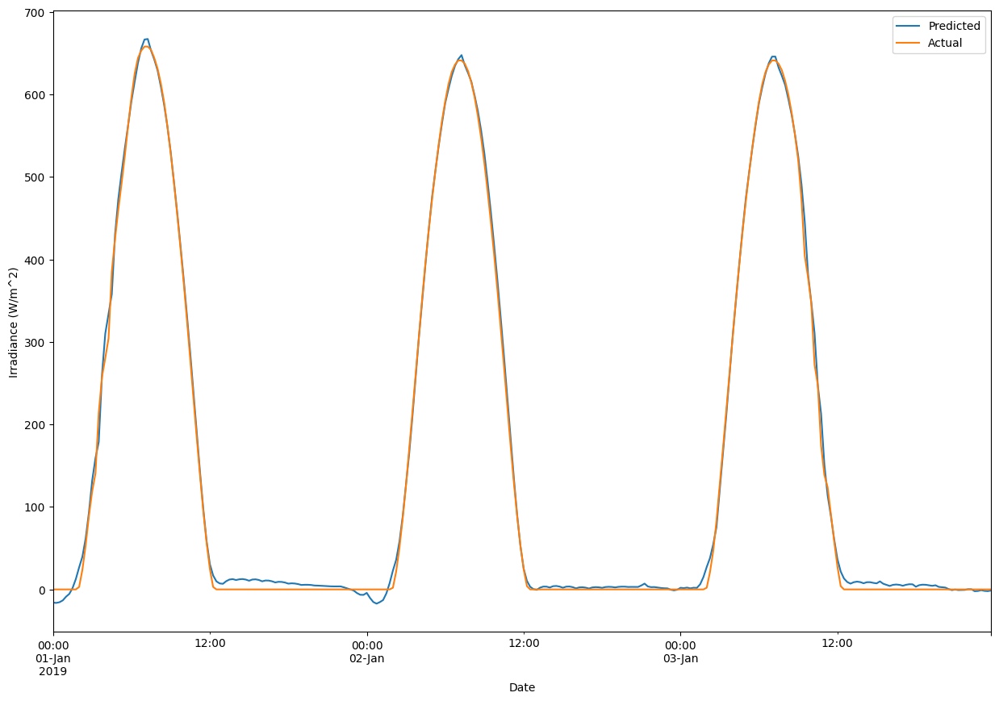

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(bh_val_x))
print("r2_Score",r2_score(s3_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

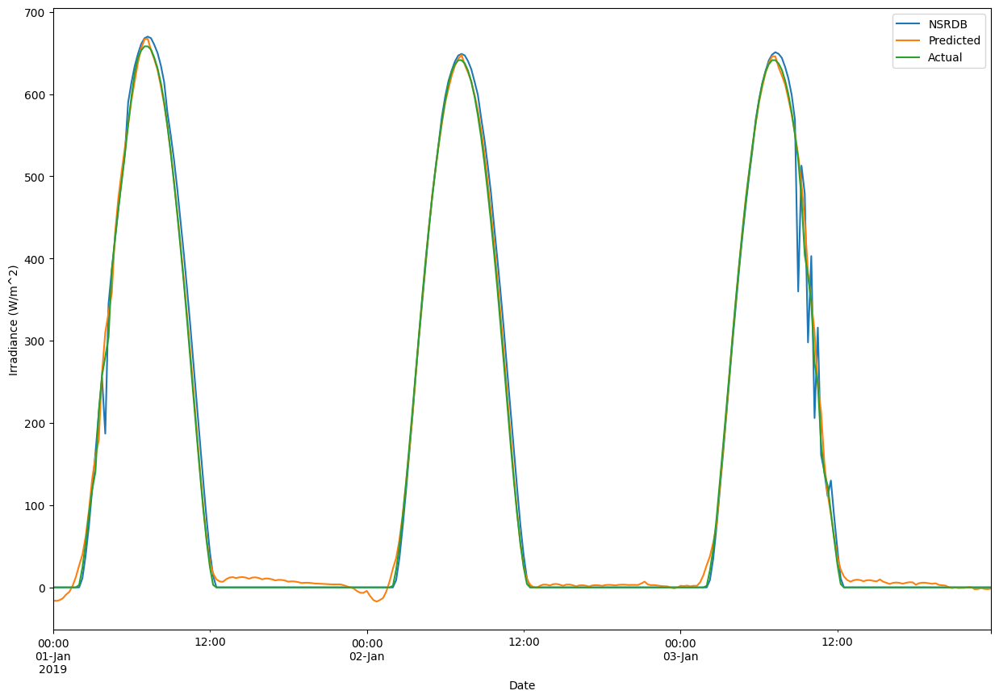

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9933374982720767
Root Mean Sqaured Error 25.081045646448683
Mean Absolute Error 14.495886532812696


Text(0, 0.5, 'Irradiance (W/m^2)')

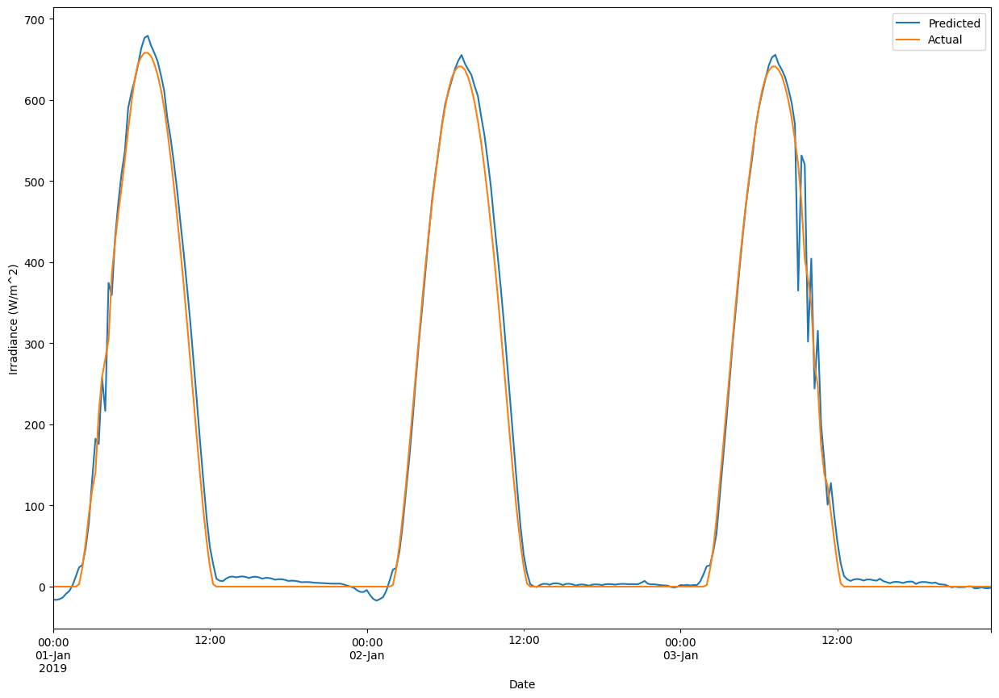

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

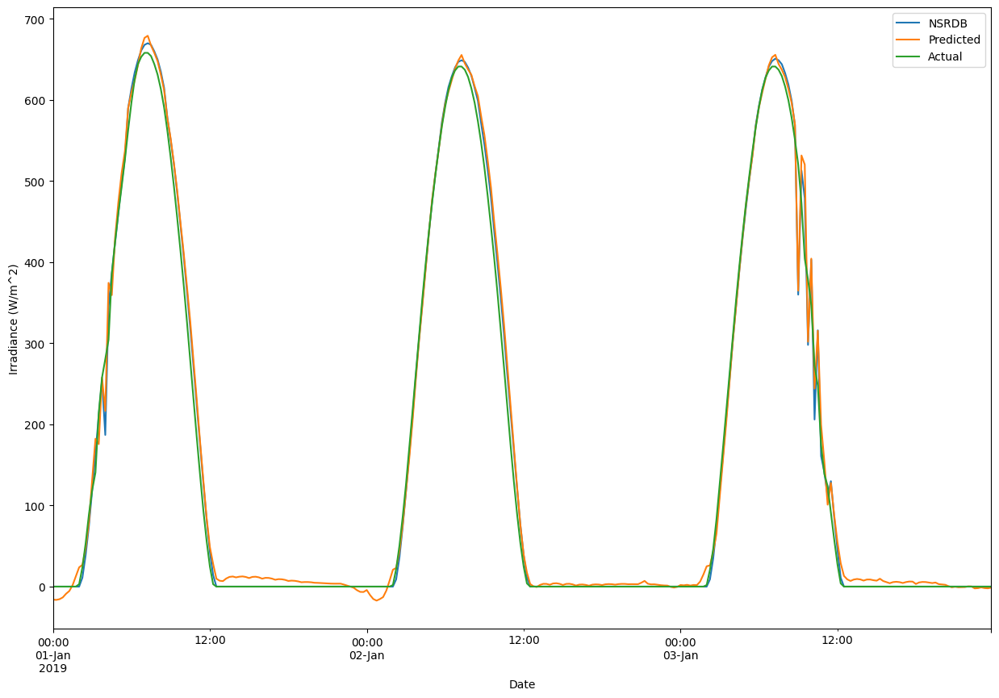

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Dh

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_4.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9929333356519597
Root Mean Sqaured Error 25.90427
Mean Absolute Error 15.501851


Text(0, 0.5, 'Irradiance (W/m^2)')

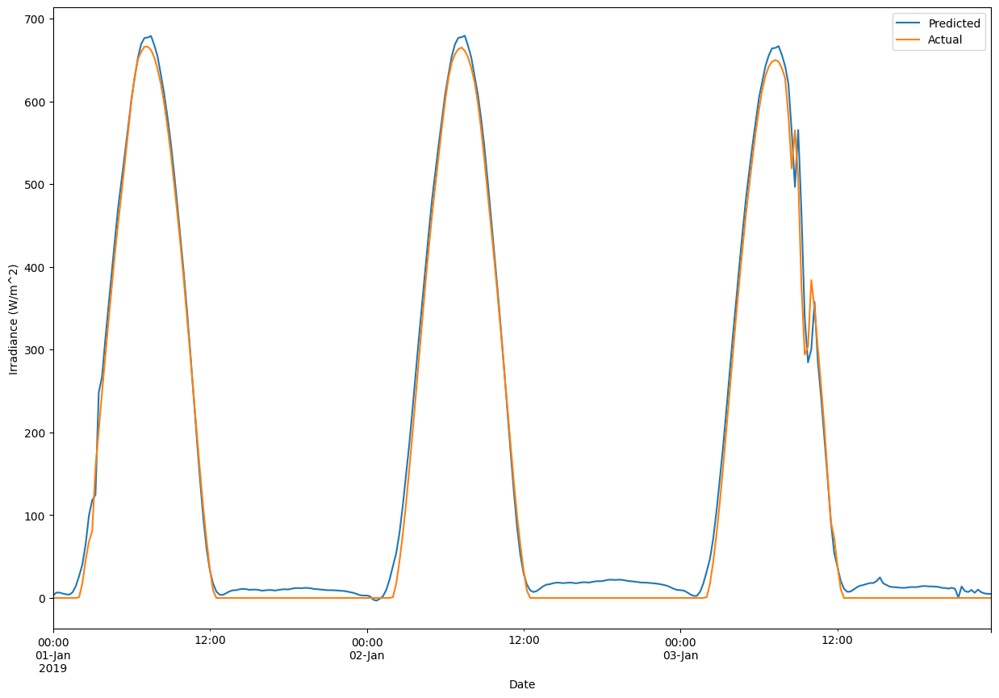

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(dh_val_x))
print("r2_Score",r2_score(s1_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

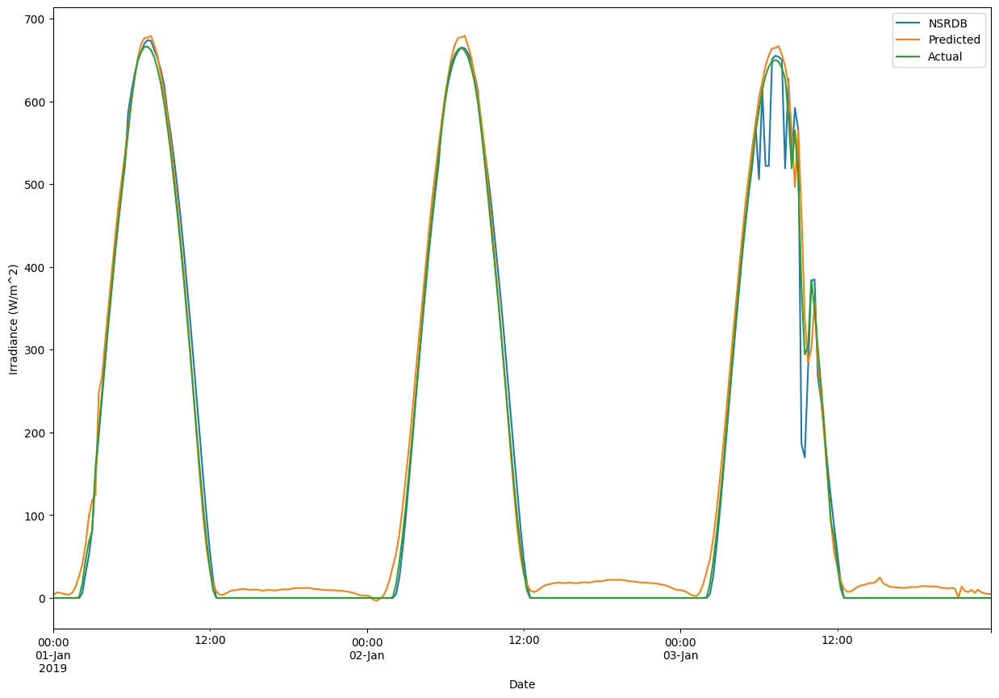

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9931208696107023
Root Mean Sqaured Error 25.904269893091538
Mean Absolute Error 15.501851053244232


Text(0, 0.5, 'Irradiance (W/m^2)')

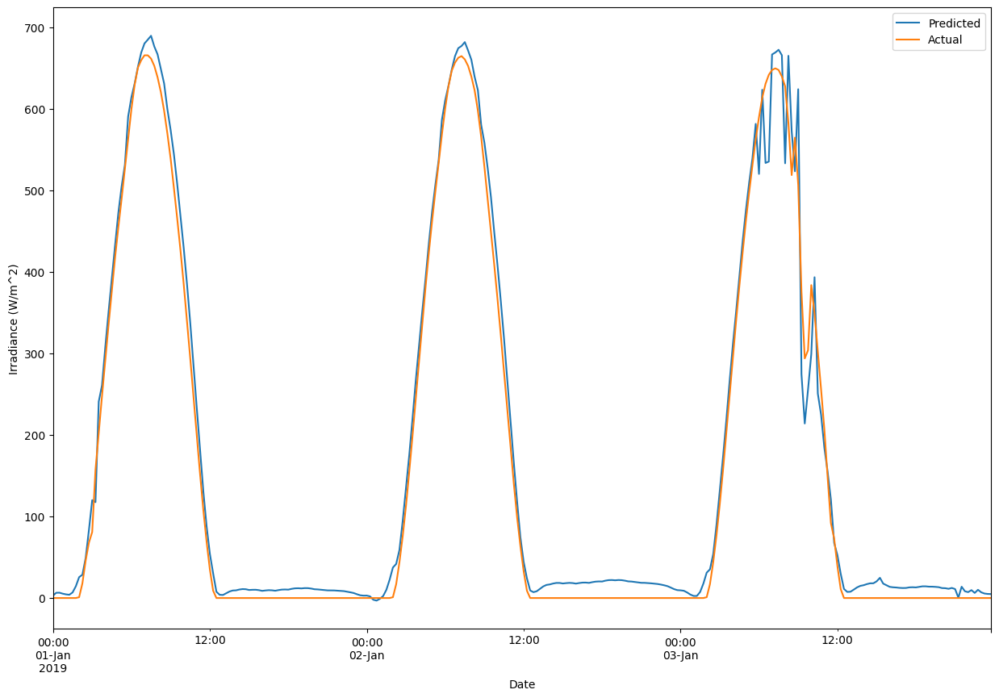

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

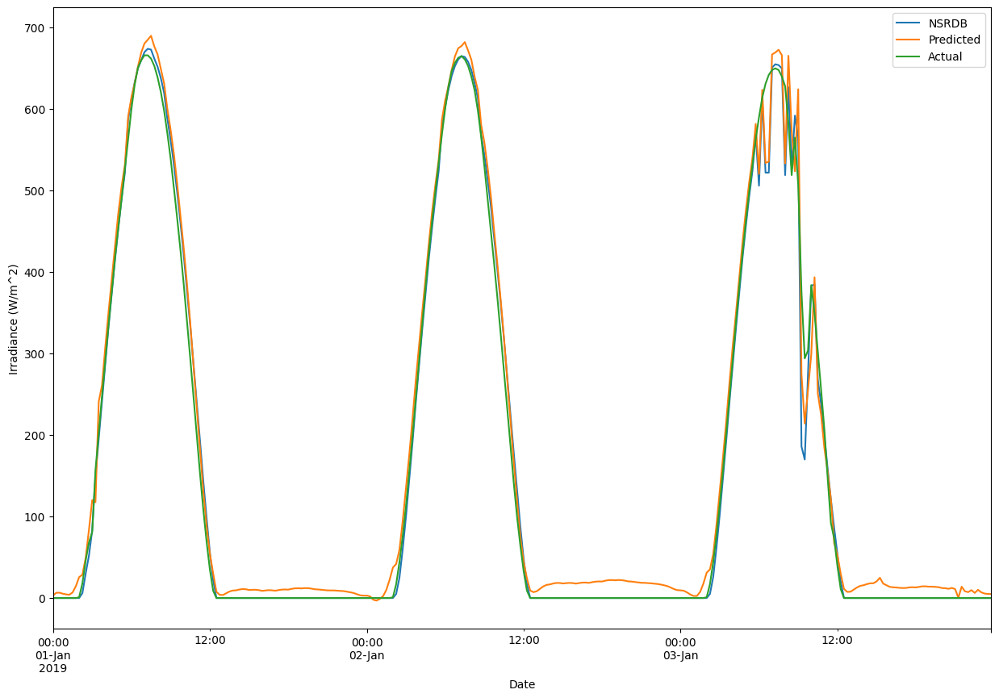

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_8.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.994376112713693
Root Mean Sqaured Error 22.579748
Mean Absolute Error 12.224246


Text(0, 0.5, 'Irradiance (W/m^2)')

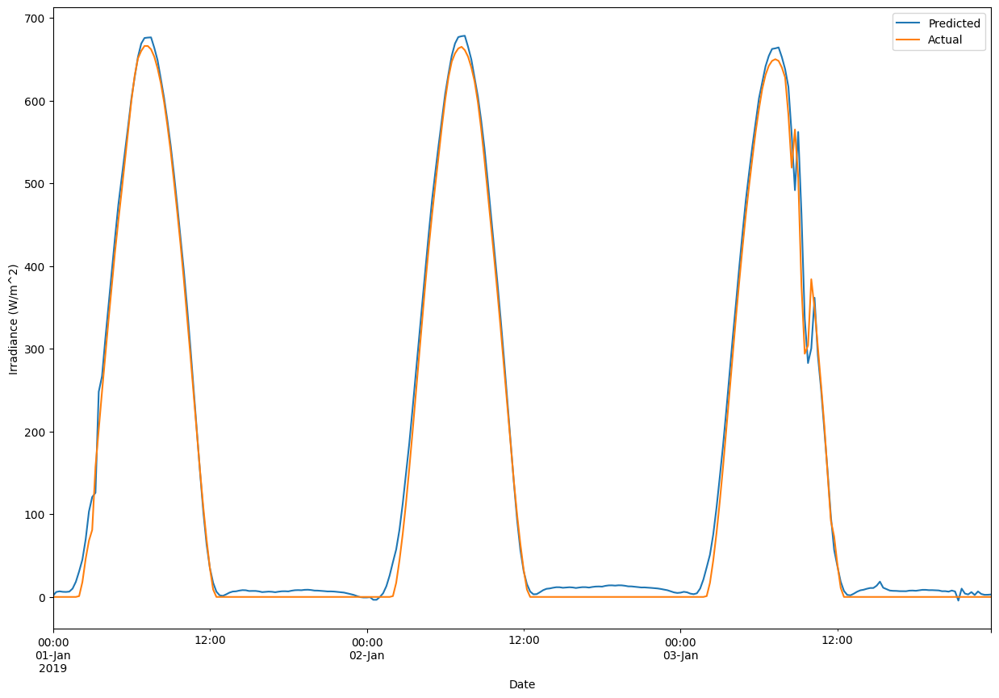

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(dh_val_x))
print("r2_Score",r2_score(s1_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

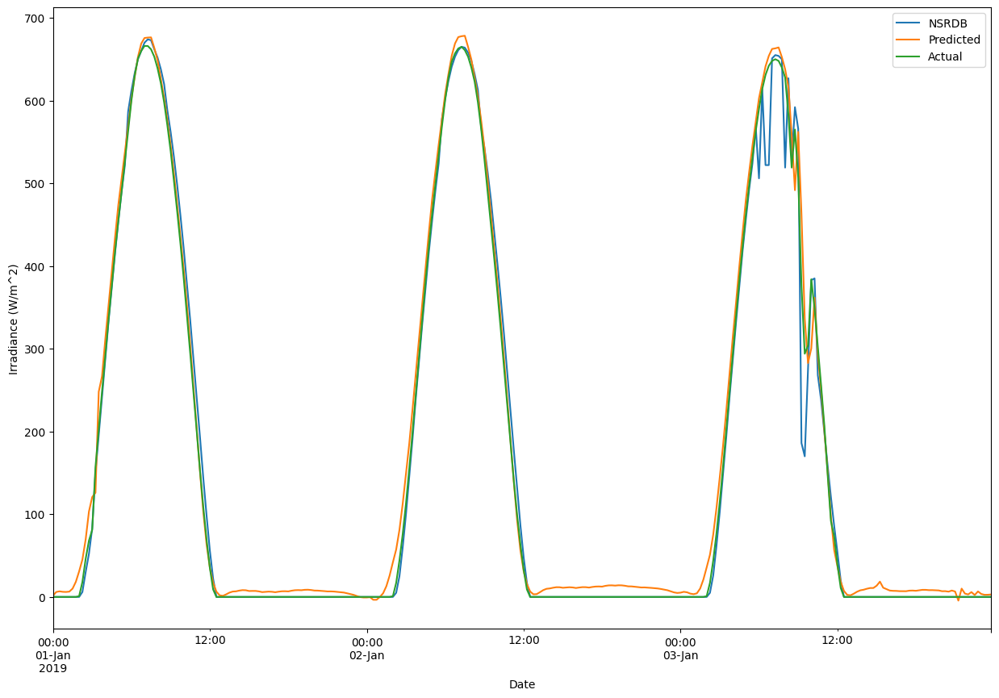

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9947732831848507
Root Mean Sqaured Error 22.579746971714517
Mean Absolute Error 12.22424645567157


Text(0, 0.5, 'Irradiance (W/m^2)')

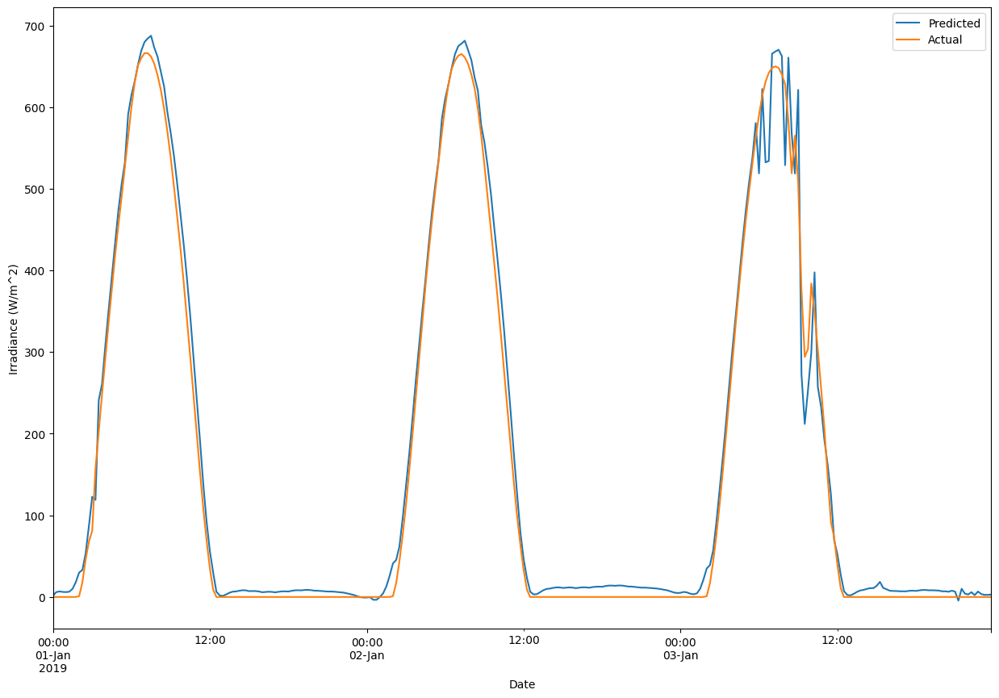

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

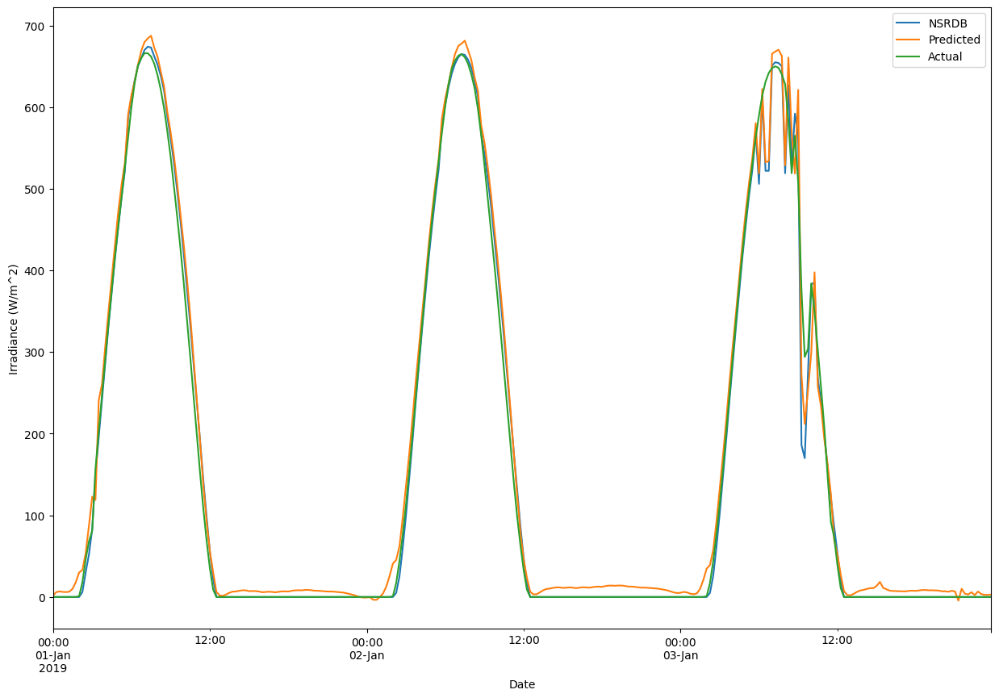

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9945115503146063
Root Mean Sqaured Error 22.281046
Mean Absolute Error 11.895721


Text(0, 0.5, 'Irradiance (W/m^2)')

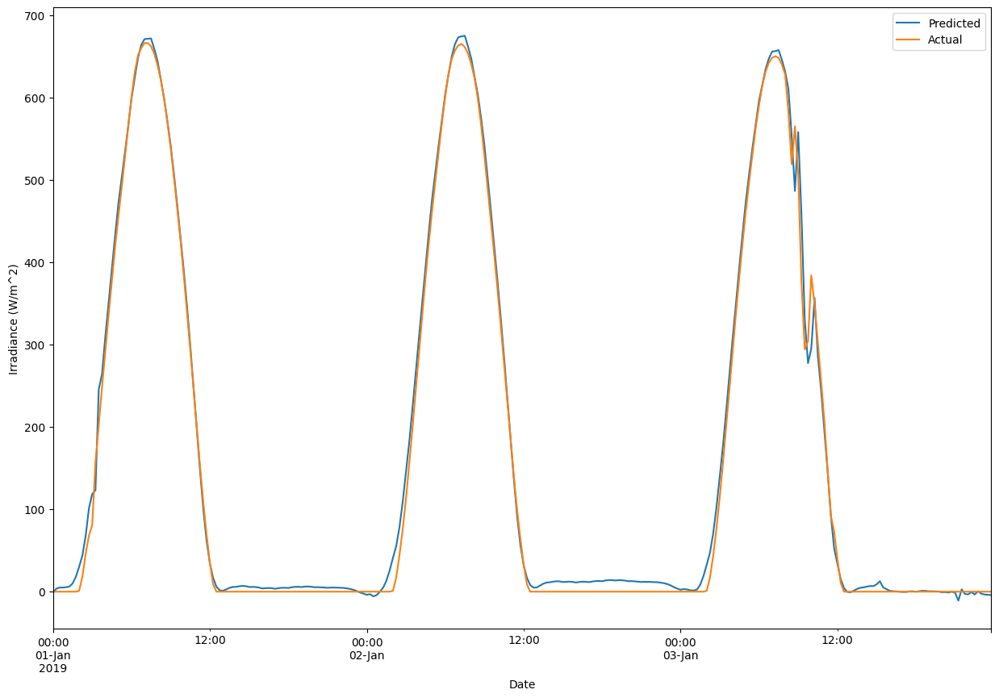

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(dh_val_x))
print("r2_Score",r2_score(s1_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

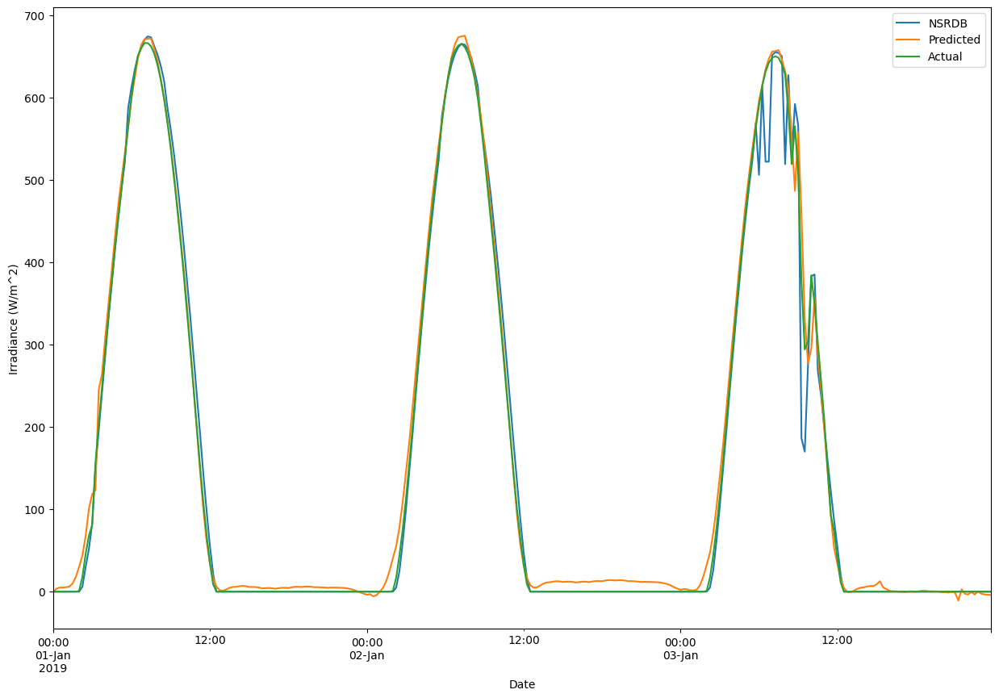

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9949106544054888
Root Mean Sqaured Error 22.281045067265904
Mean Absolute Error 11.895721294948927


Text(0, 0.5, 'Irradiance (W/m^2)')

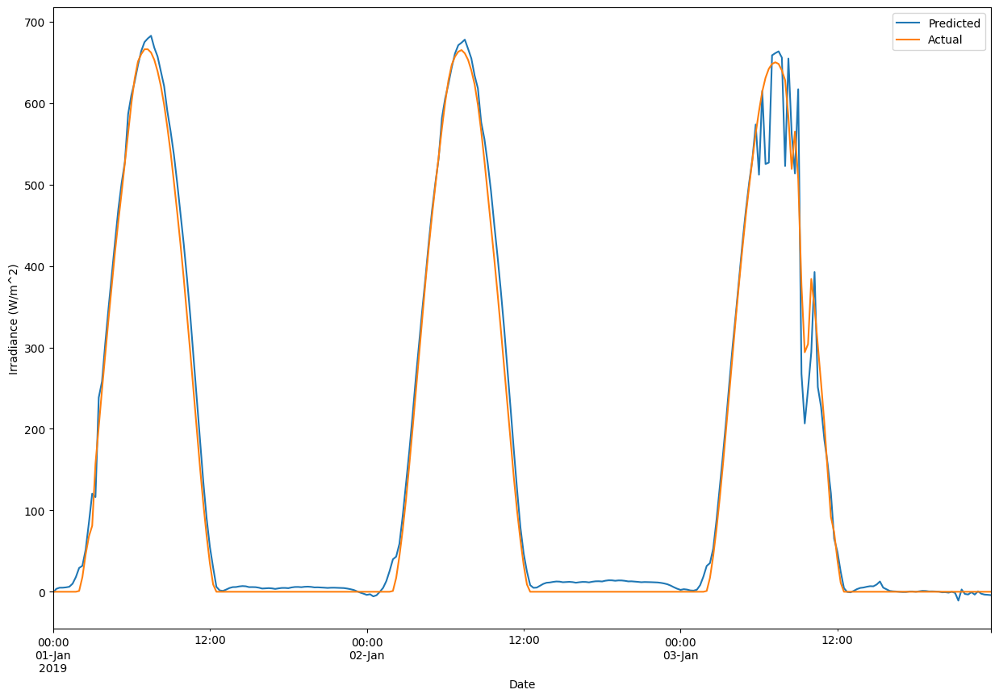

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

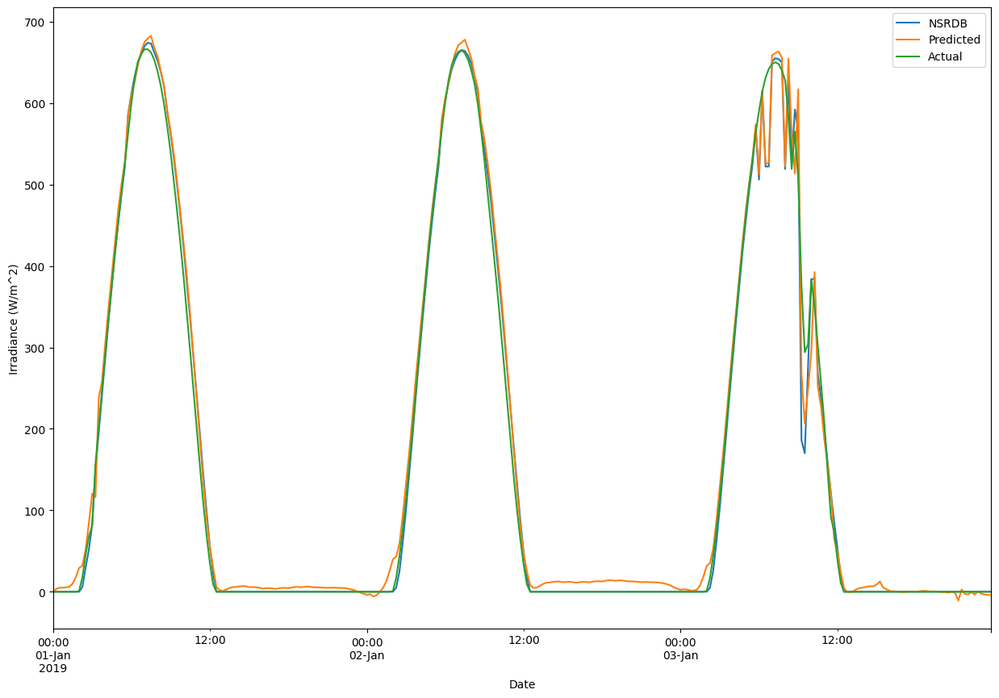

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_4.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9942019192158068
Root Mean Sqaured Error 23.35234
Mean Absolute Error 11.199189


Text(0, 0.5, 'Irradiance (W/m^2)')

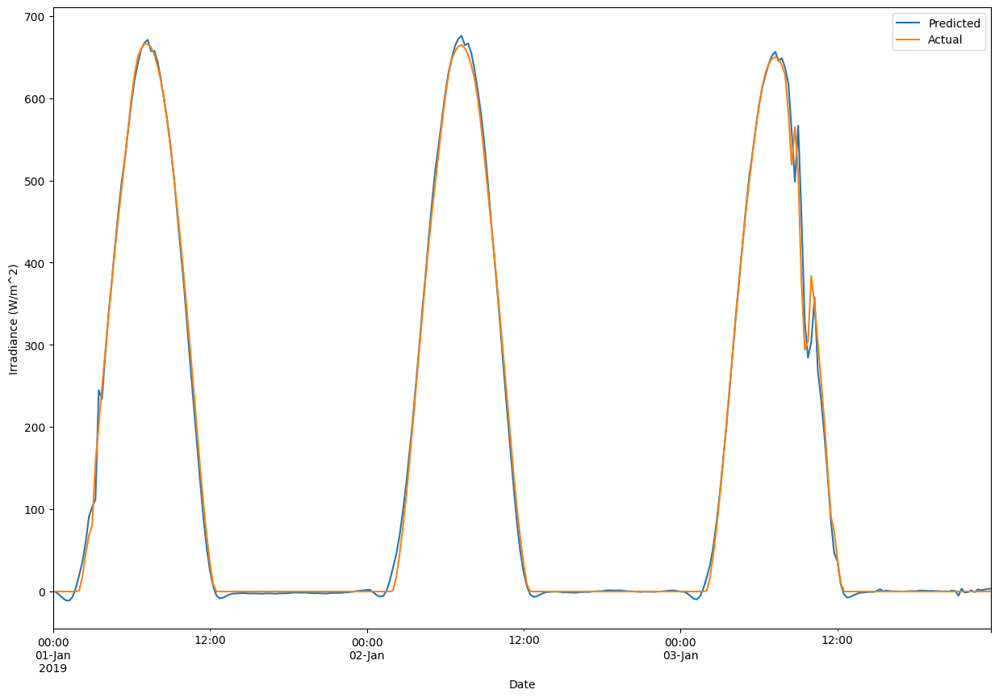

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(dh_val_x))
print("r2_Score",r2_score(s2_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

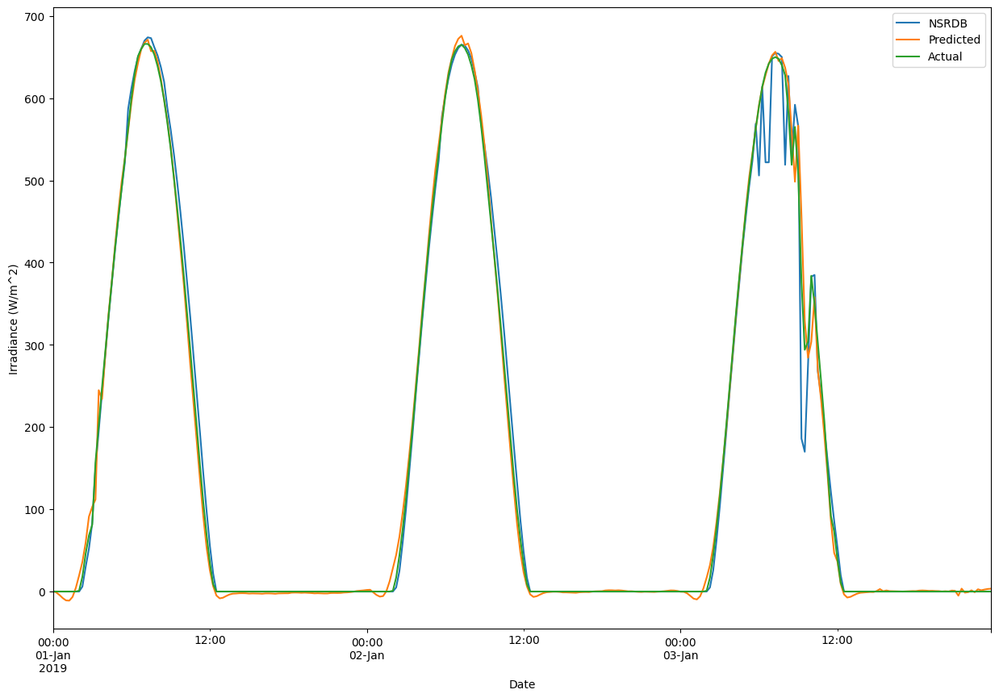

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9944094871754501
Root Mean Sqaured Error 23.352340242822187
Mean Absolute Error 11.19919056426064


Text(0, 0.5, 'Irradiance (W/m^2)')

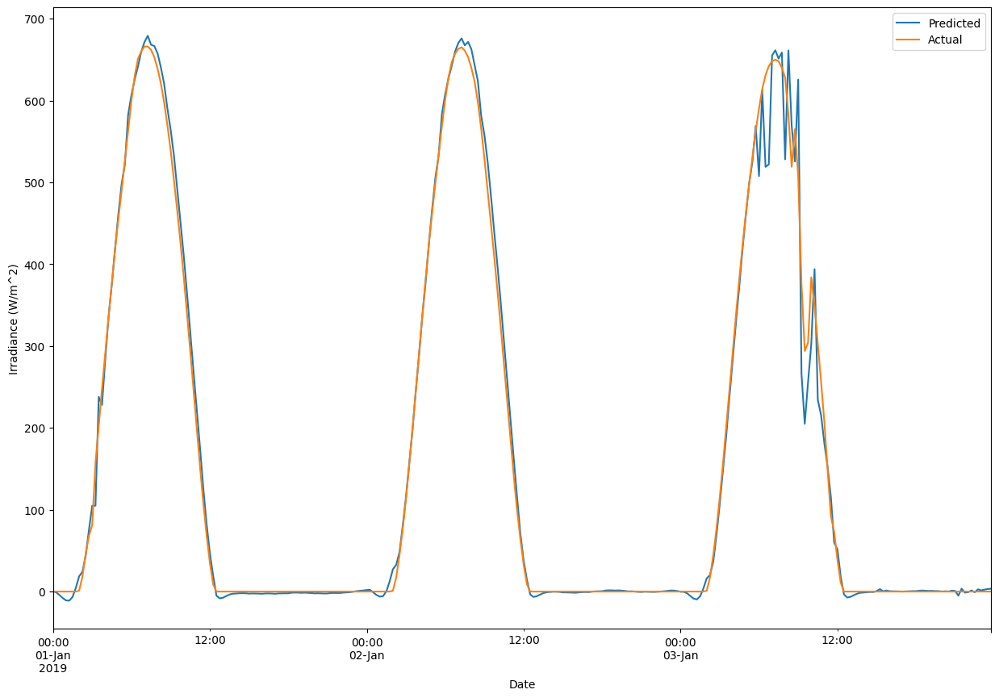

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

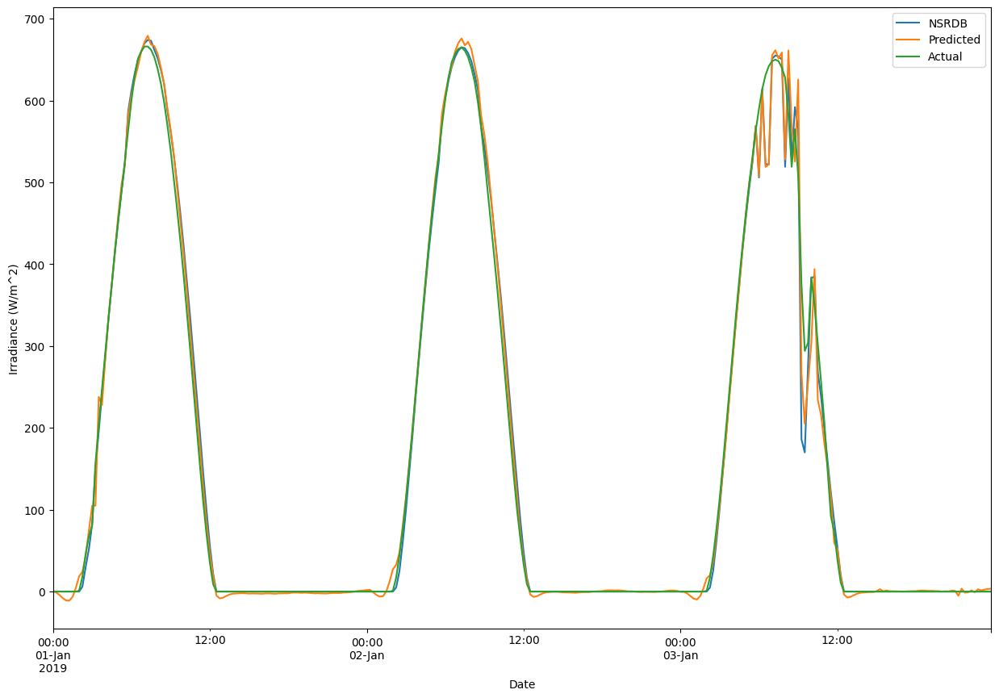

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9946630748162675
Root Mean Sqaured Error 22.225216
Mean Absolute Error 10.983731


Text(0, 0.5, 'Irradiance (W/m^2)')

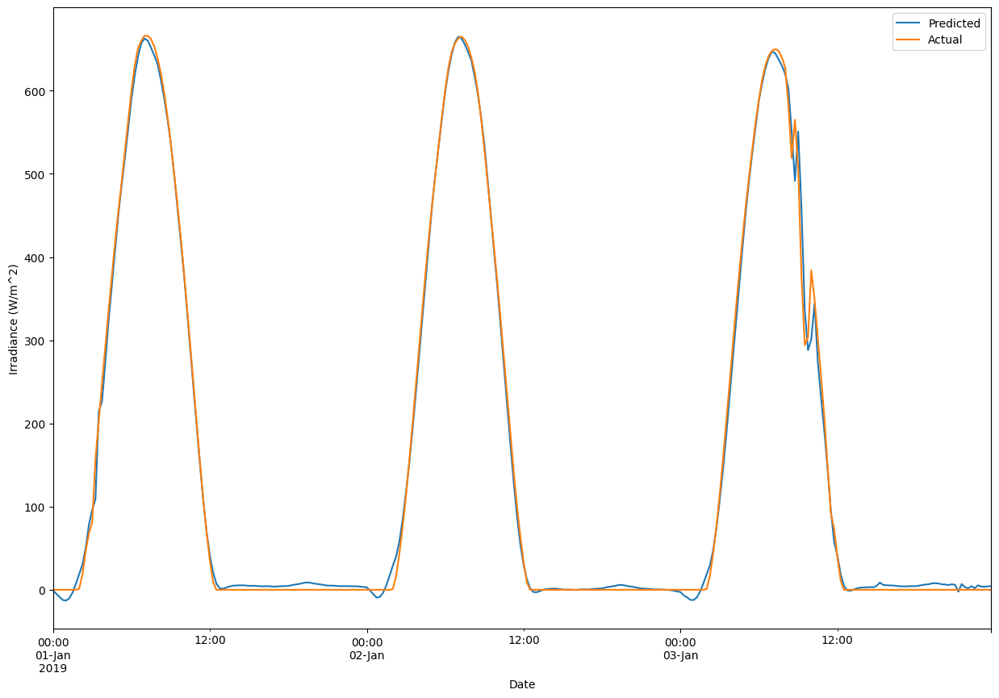

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(dh_val_x))
print("r2_Score",r2_score(s2_8.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

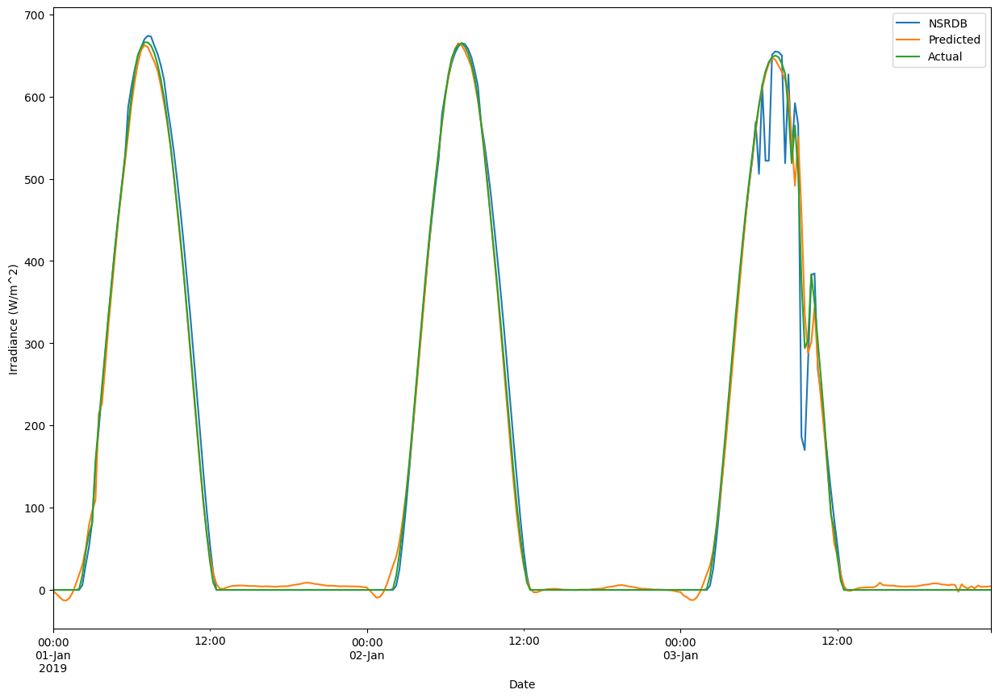

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9949361269747027
Root Mean Sqaured Error 22.225215943496835
Mean Absolute Error 10.983730312117647


Text(0, 0.5, 'Irradiance (W/m^2)')

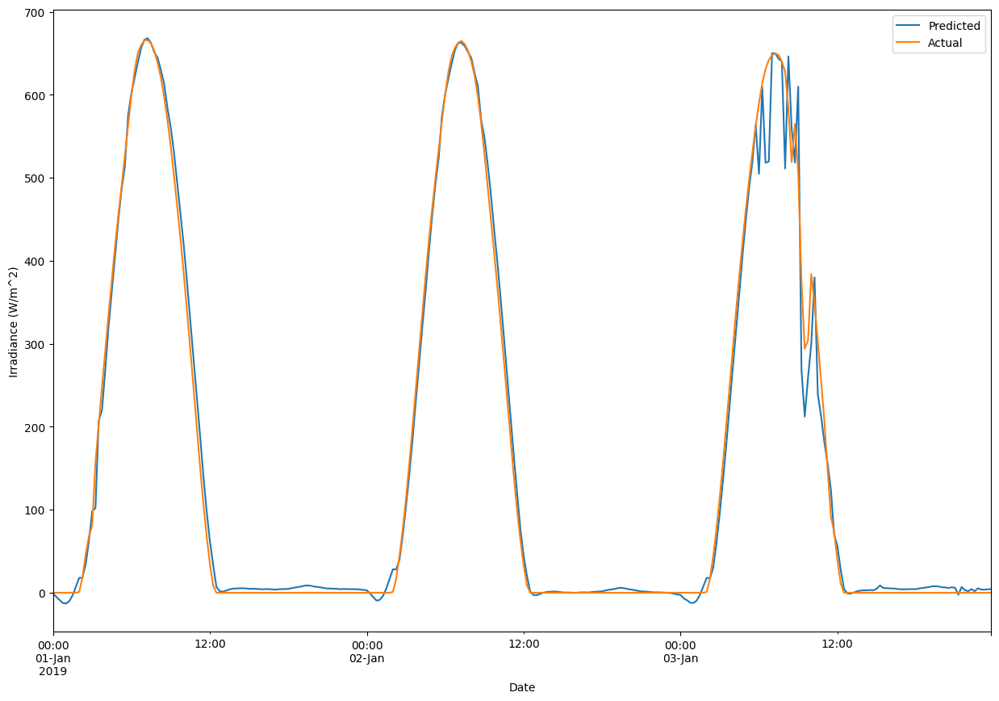

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

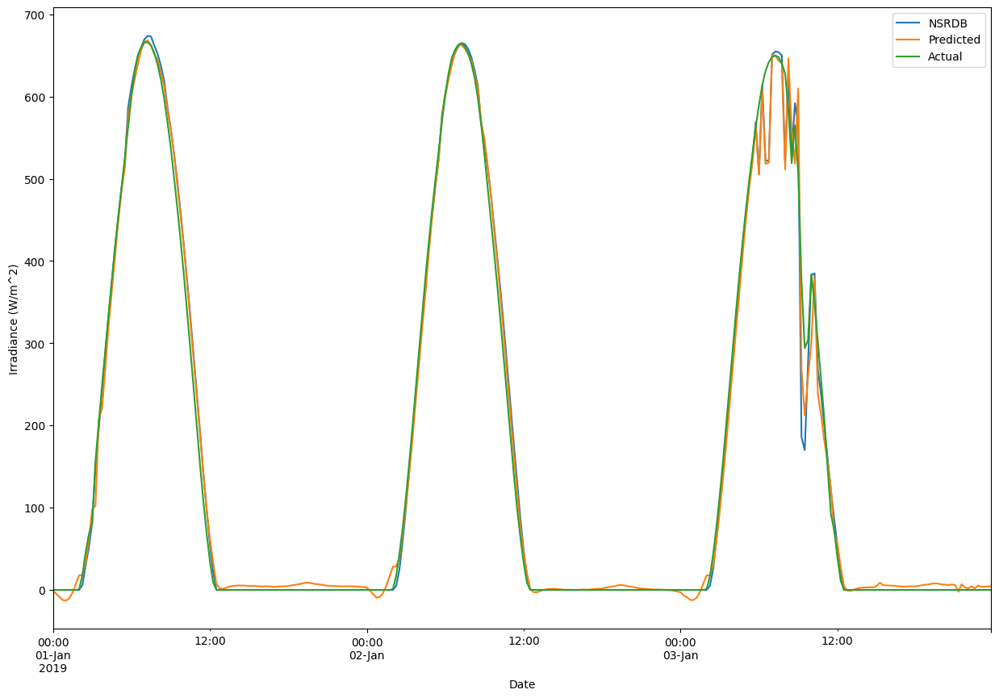

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_12.h5.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9942731071100825
Root Mean Sqaured Error 23.149273
Mean Absolute Error 12.390211


Text(0, 0.5, 'Irradiance (W/m^2)')

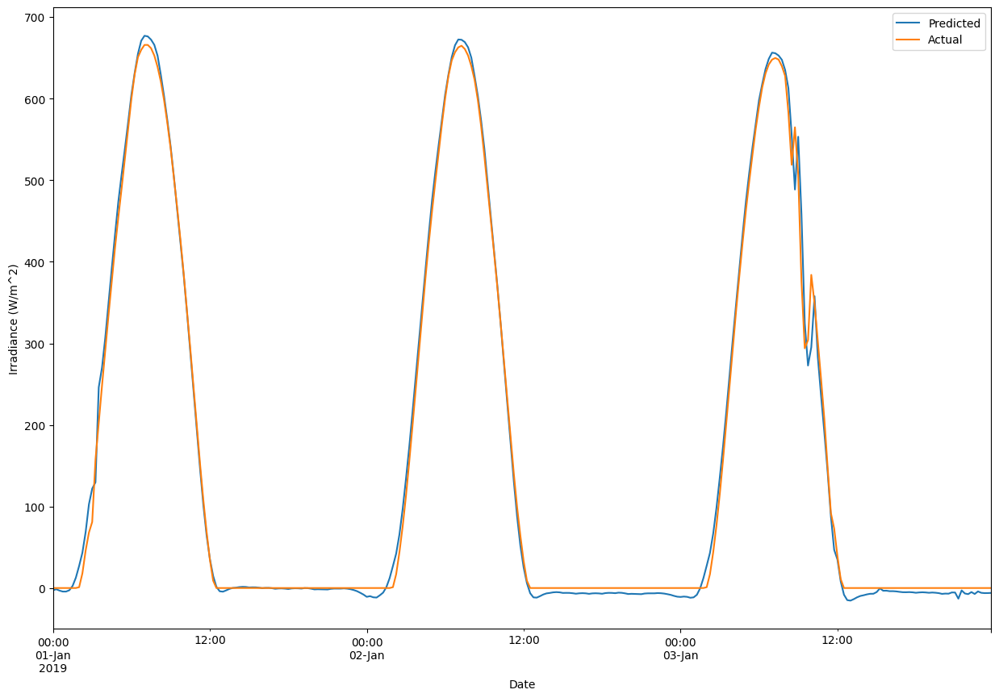

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(dh_val_x))
print("r2_Score",r2_score(s2_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

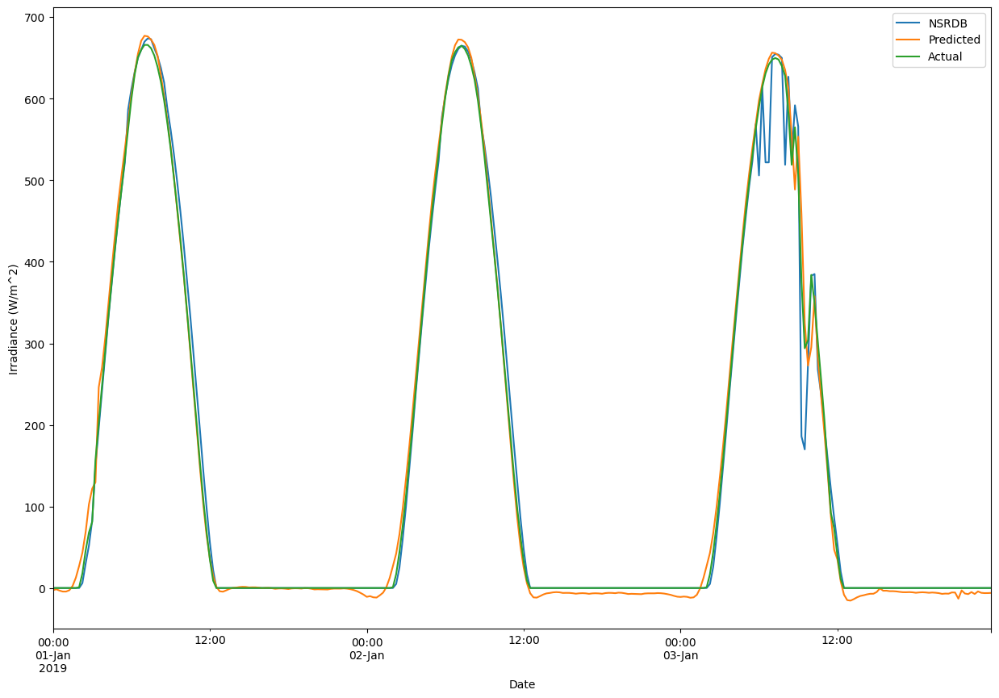

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9945062920535198
Root Mean Sqaured Error 23.14927369428284
Mean Absolute Error 12.390210938357658


Text(0, 0.5, 'Irradiance (W/m^2)')

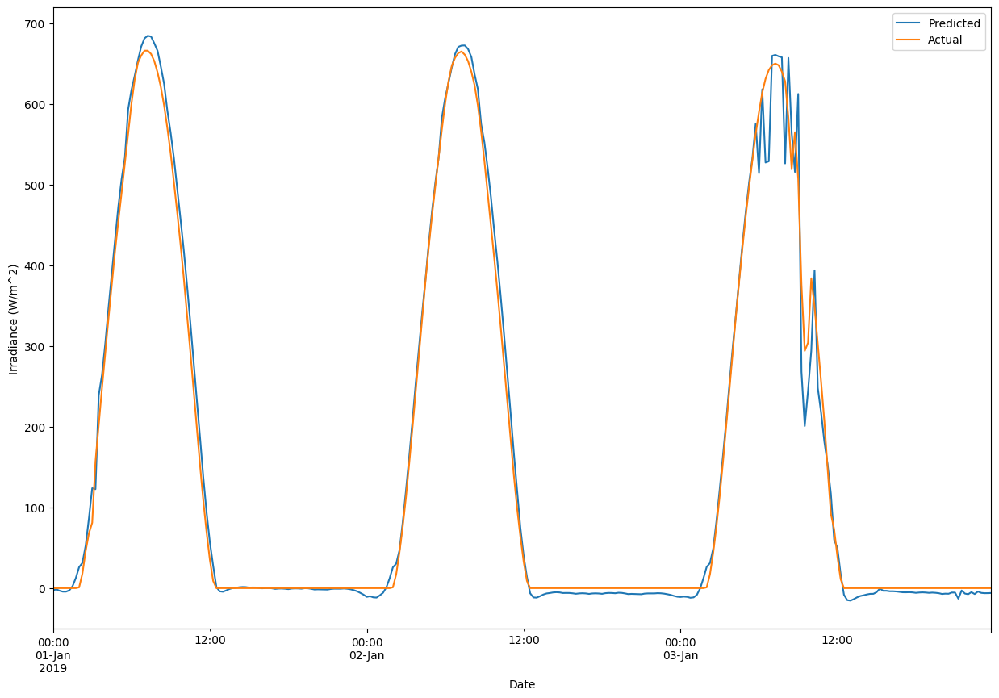

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

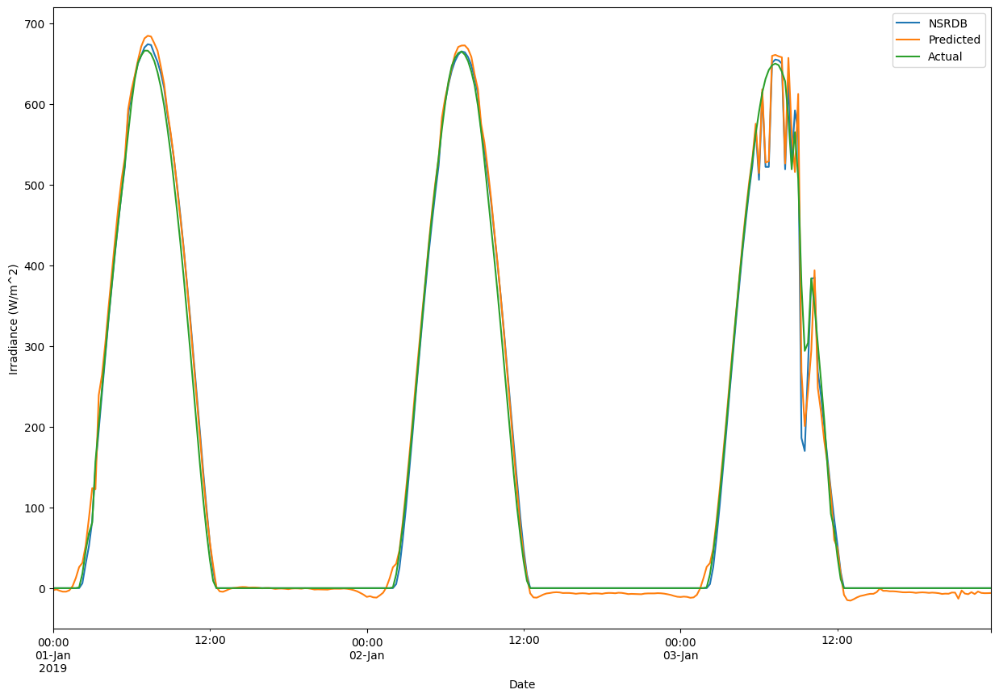

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_4.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(dh_val_x))
print("r2_Score",r2_score(s3_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_8.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(dh_val_x))
print("r2_Score",r2_score(s3_8.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_12.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(dh_val_x))
print("r2_Score",r2_score(s3_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')